In [342]:
import matplotlib.pyplot as plt

import pandas as pd
import seaborn as sns
import numpy as np

from collections import Counter

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import (
    RandomForestClassifier,
    RandomForestRegressor,
)
from sklearn.linear_model import (
    LogisticRegression,
    LinearRegression,
)
from sklearn.svm import (
    SVC,
    SVR,
)
from sklearn.tree import (
    DecisionTreeClassifier,
    DecisionTreeRegressor,
)
from sklearn.neighbors import (
    KNeighborsClassifier,
    KNeighborsRegressor,
)

from sklearn.metrics import (
    roc_curve,
    auc,
    classification_report,
    mean_squared_error,
)
from sklearn.model_selection import (
    cross_val_score,
    GridSearchCV,
    train_test_split,
)

In [343]:
def plotROC(clf, XTest, QTest, probs=True):
    if (probs == True):
        probs = clf.predict_proba(XTest)
        preds = probs[:,1]
    else:
        preds = clf.decision_function(XTest)
    
    fpr, tpr, threshold = roc_curve(QTest, preds)
    roc_auc = auc(fpr, tpr)
    plt.title('ROC curve')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
    
def discreteAlcohol(df):
    df["alcohol_cat"] = 'L'
    mean = df["alcohol"].mean()
    stddev = df["alcohol"].std()
    for index, series in df.iterrows():
        alcohol = series["alcohol"]
        if alcohol < (mean-stddev):
            df.loc[index, "alcohol_cat"] = 'L'
        elif alcohol > (mean+stddev):
            df.loc[index, "alcohol_cat"] = 'H'
        else:
            df.loc[index, "alcohol_cat"] = 'M'
            
            
def discreteSugar(df):
    df["isSweet"] = 0
    threshold = df["residual sugar"].median()

    for index, series in df.iterrows():
        sugar = series["residual sugar"]
        if sugar < threshold:
            df.loc[index, "isSweet"] = 0
        else:
            df.loc[index, "isSweet"] = 1
            
            
df_white = pd.read_csv("winequality-white.csv", header=0, sep=';')
df_red = pd.read_csv("winequality-red.csv", header=0, sep=';')

In [344]:
df_red = pd.read_csv('winequality-red.csv', header=0, sep=";")
print("Shape of Red Data: ", df_red.shape)
print("First 10 Red Data Points:")
df_red.head(10)

Shape of Red Data:  (1599, 12)
First 10 Red Data Points:


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [345]:
df_white = pd.read_csv('winequality-white.csv', header=0, sep=";")
print("Shape of White Data: ", df_white.shape)
print("First 10 White Data Points:")
df_white.head(10)

Shape of White Data:  (4898, 12)
First 10 White Data Points:


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


Task 1 A: Quality Distribution across all samples:

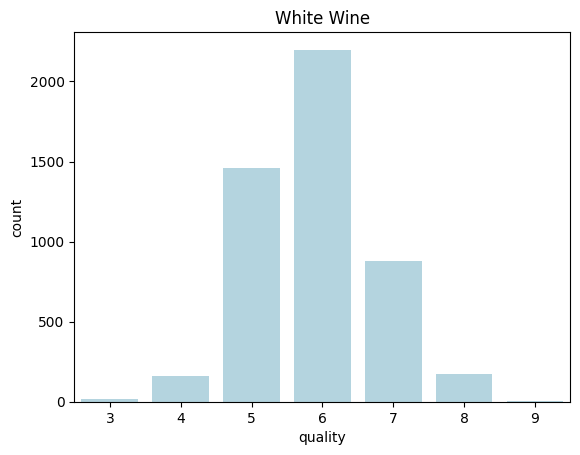

In [346]:
g = sns.countplot(data=df_white, x="quality", color='lightblue').set(title = "White Wine")

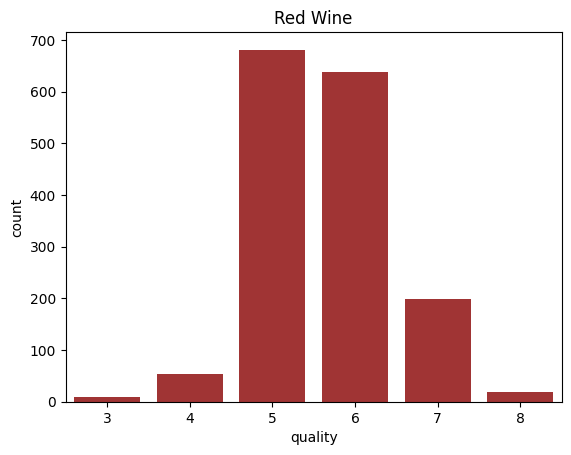

In [347]:
g = sns.countplot(data=df_red, x="quality", color='firebrick').set(title = "Red Wine")

The quality distributions of red and white are similar, but the average quality of red is comparatively lower.

Task 1 B: We'll discretise the alcohol content variable into Low, Mid, and High.

In [348]:
discreteAlcohol(df_white)
discreteAlcohol(df_red)

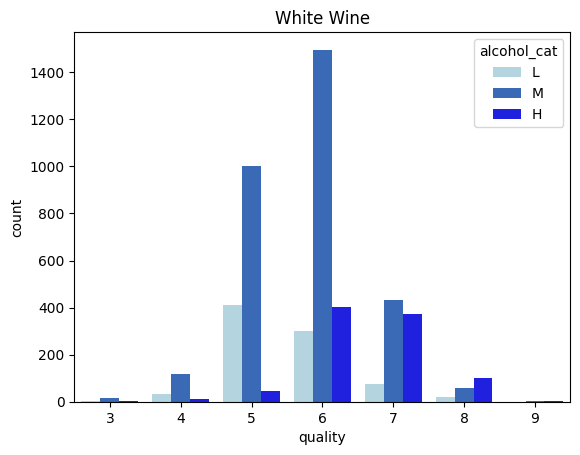

In [349]:
g = sns.countplot(data=df_white, x="quality", hue='alcohol_cat', hue_order=['L','M','H'], palette={'L':"lightblue",'M':"#2665c9",'H':"blue"}).set(title = "White Wine")

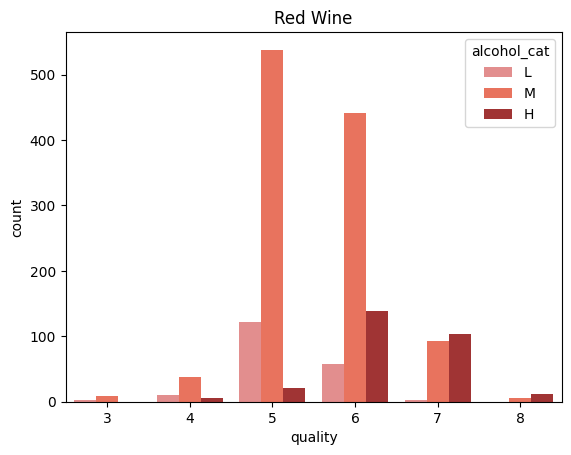

In [350]:
g = sns.countplot(data=df_red, x="quality", hue='alcohol_cat', hue_order=['L','M','H'], palette={'L':"lightcoral",'M':"tomato",'H':"firebrick"}).set(title = "Red Wine")

Task 1 C: There appears to be a correlation between alcohol content and wine quality, where wines with low alcohol content tend to have lower quality ratings (below 6), while wines with high alcohol content tend to have higher quality ratings. Therefore, people probably believe that wines with higher alcohol content as being of higher quality.

Task 1 D: Plotting Residual Sugar Variable to Identify Sweet and Dry Wines.
I have heard that, in comparison to white wines, red wines are generally less sweet, indicating that their residual sugar values should be very low. On the other hand, white wines can range from dry to sweet, implying that their sugar values should be more evenly distributed across.

White Wine:

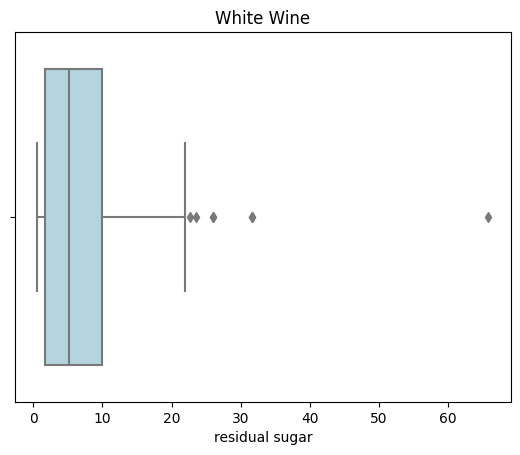

In [351]:
g = sns.boxplot(data=df_white, x='residual sugar', color='lightblue').set(title = "White Wine")

Discretising sugar content

In [352]:
discreteSugar(df_white)

This shows that the dataset is split evenly.

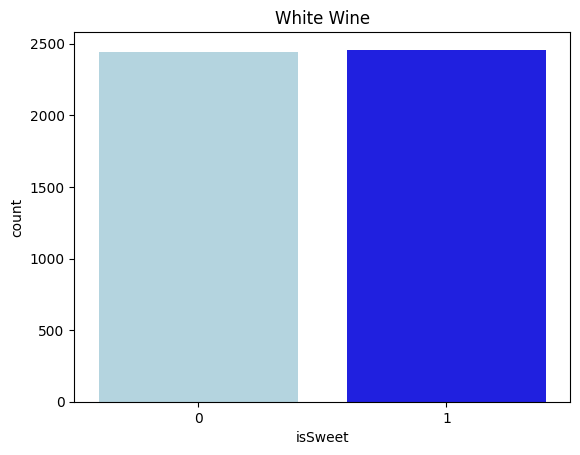

In [353]:
g = sns.countplot(data=df_white, x="isSweet", palette={0:"lightblue",1:"blue"}).set(title = "White Wine")

In [354]:
df_white["isSweet"].value_counts()

1    2458
0    2440
Name: isSweet, dtype: int64

Now, for Red Wine:

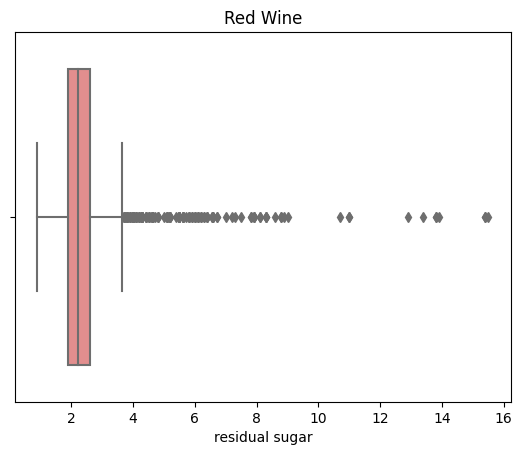

In [355]:
g = sns.boxplot(data=df_red, x='residual sugar', color='lightcoral').set(title = "Red Wine")

Discretising sugar content

In [356]:
discreteSugar(df_red)

Dataset is evenly split

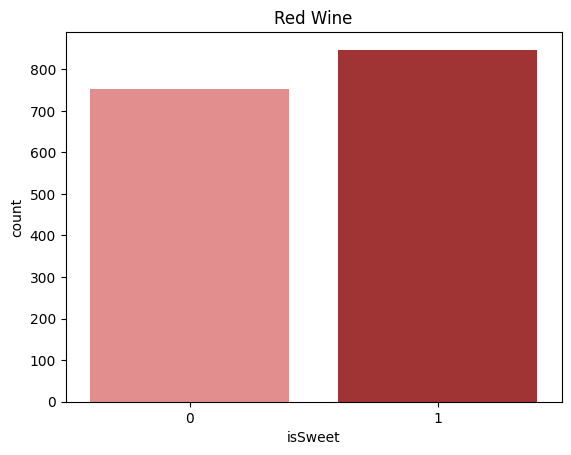

In [357]:
g = sns.countplot(data=df_red, x="isSweet", palette={0:"lightcoral",1:"firebrick"}).set(title = "Red Wine")

In [358]:
df_red["isSweet"].value_counts()

1    847
0    752
Name: isSweet, dtype: int64

Based on the above plots, it is evident that the majority of red wines have low residual sugar levels whereas white wines exhibit higher variance in their residual sugar content and they are generally sweeter than red wine.

Quality Distribution Vs. Residual Sugar

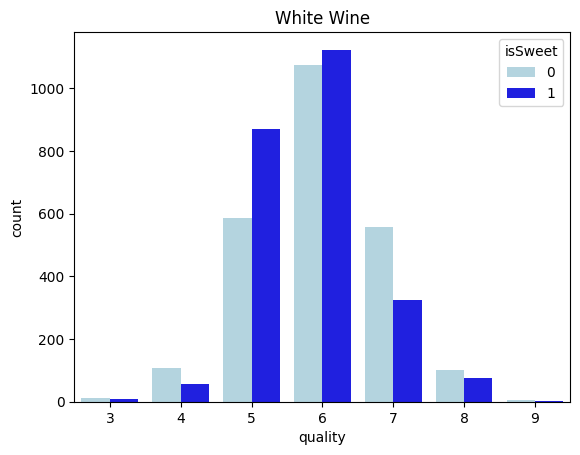

In [359]:
g = sns.countplot(data=df_white, x="quality", hue='isSweet', hue_order=[0,1], palette={0:"lightblue",1:"blue"}).set(title = "White Wine")

Here, it is visible that white wines with a drier taste are more commonly found in higher quality categories.

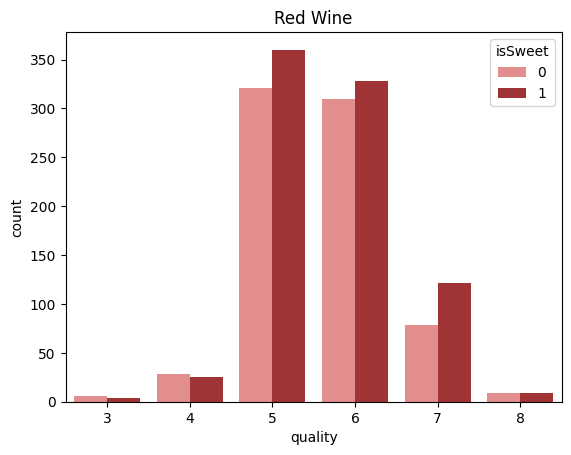

In [360]:
g = sns.countplot(data=df_red, x="quality", hue='isSweet', hue_order=[0,1], palette={0:"lightcoral",1:"firebrick"}).set(title = "Red Wine")

Here, it is apparent that the distribution of wine quality remains unchanged, indicating that the perceived quality of the wines here is not affected by their sweetness.

Task 2: Correlations between different variables to decide which is the best for analysis

For White Wine:

Scattered Graph along with Regression Lines

First with Fixed Acidity:

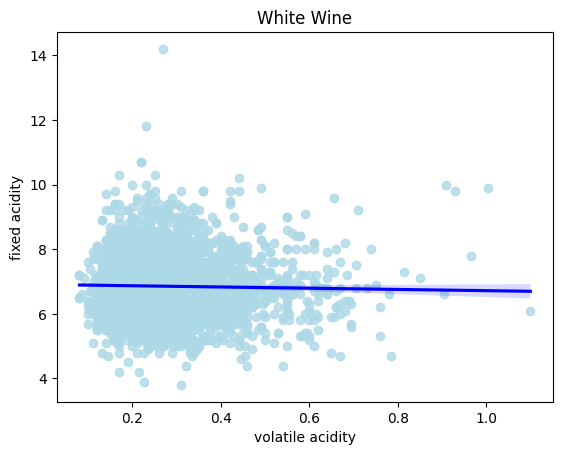

In [361]:
g = sns.regplot(data=df_white, x="volatile acidity", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

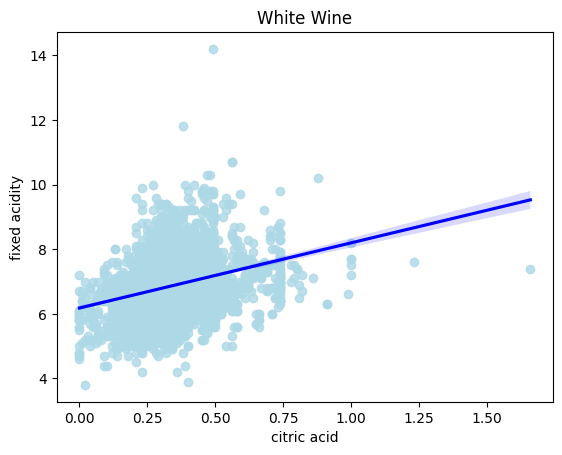

In [362]:
g = sns.regplot(data=df_white, x="citric acid", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

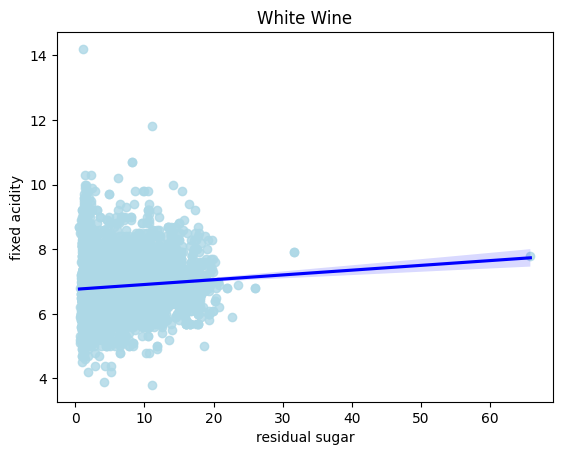

In [363]:
g = sns.regplot(data=df_white, x="residual sugar", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

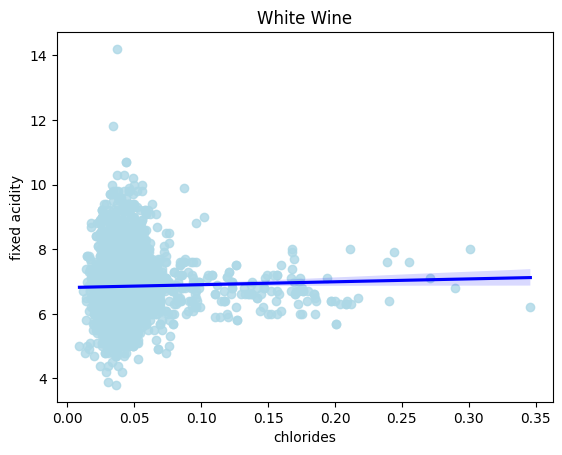

In [364]:
g = sns.regplot(data=df_white, x="chlorides", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

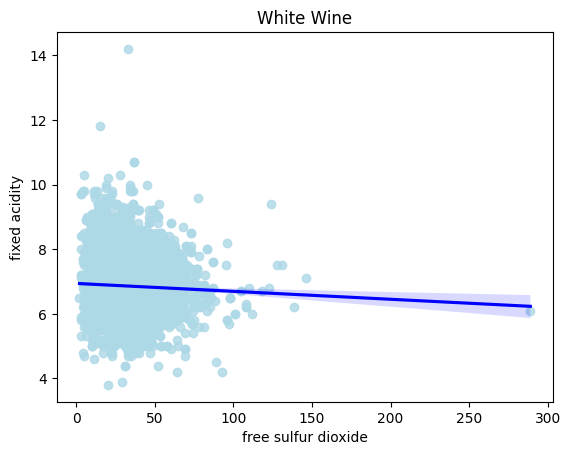

In [365]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

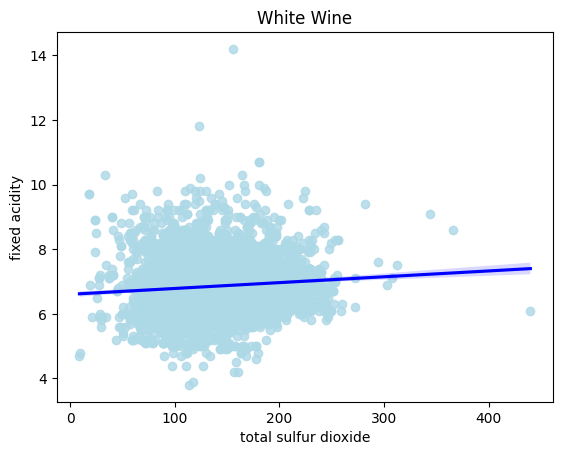

In [366]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

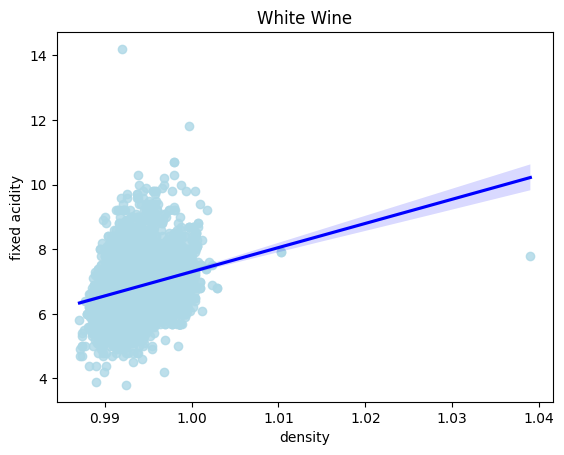

In [367]:
g = sns.regplot(data=df_white, x="density", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

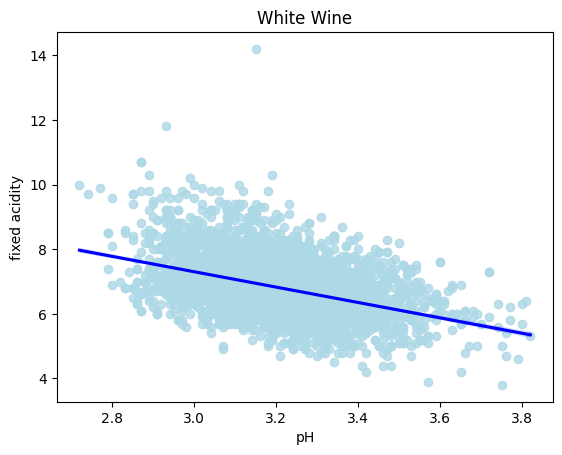

In [368]:
g = sns.regplot(data=df_white, x="pH", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

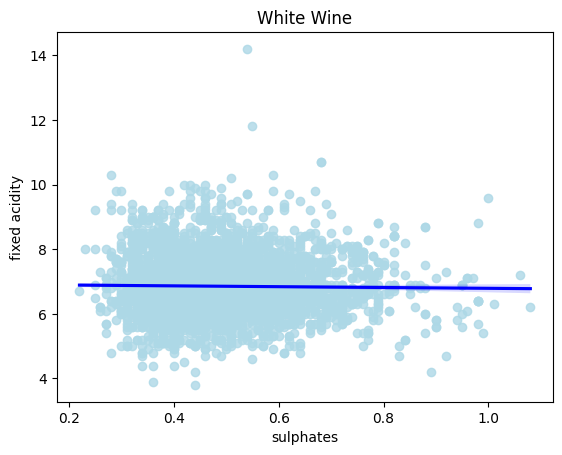

In [369]:
g = sns.regplot(data=df_white, x="sulphates", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

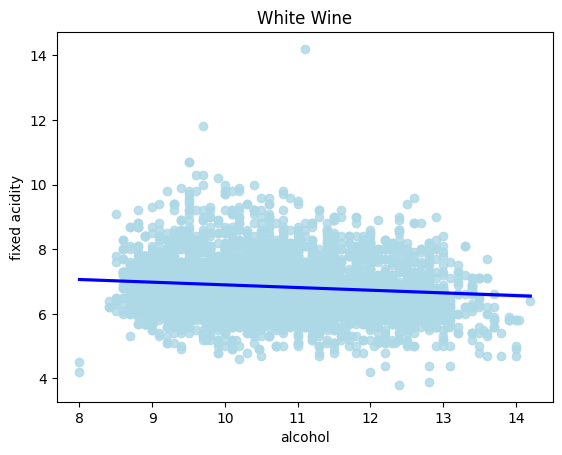

In [370]:
g = sns.regplot(data=df_white, x="alcohol", y="fixed acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Volatile Activity:

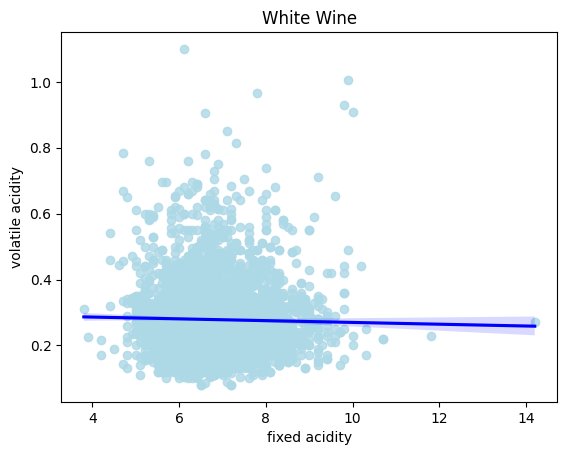

In [371]:
g = sns.regplot(data=df_white, x="fixed acidity", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

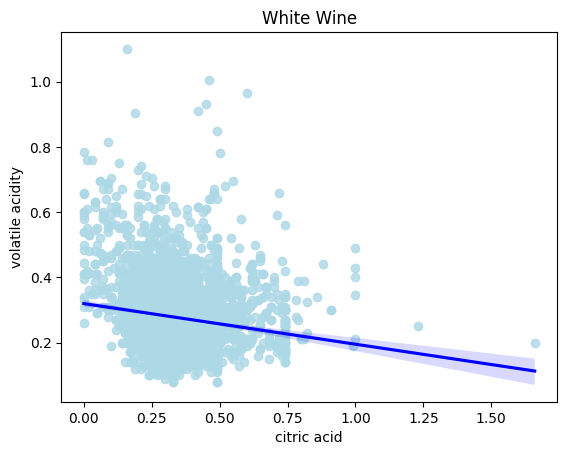

In [372]:
g = sns.regplot(data=df_white, x="citric acid", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

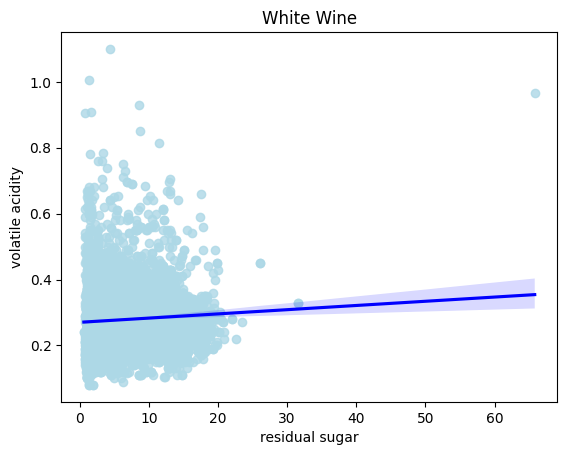

In [373]:
g = sns.regplot(data=df_white, x="residual sugar", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

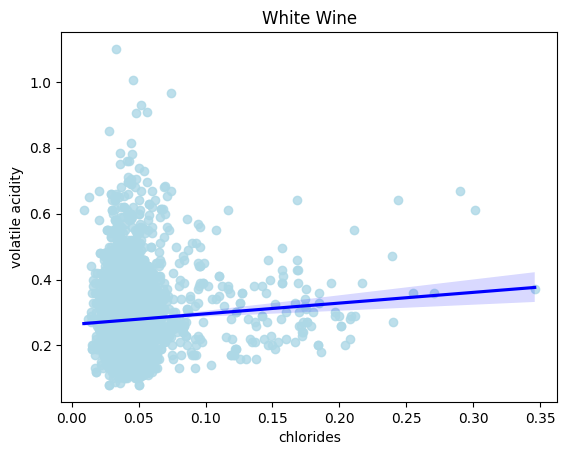

In [374]:
g = sns.regplot(data=df_white, x="chlorides", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

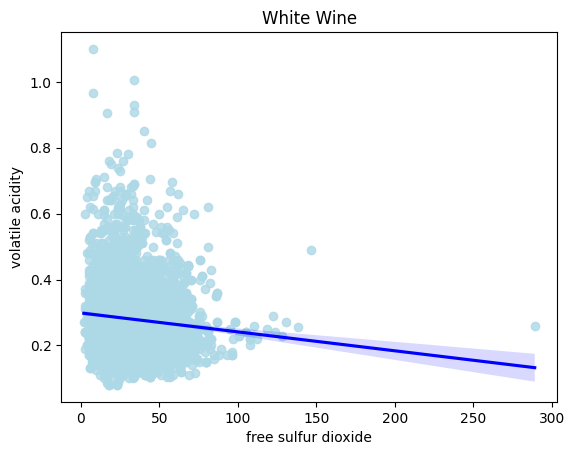

In [375]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

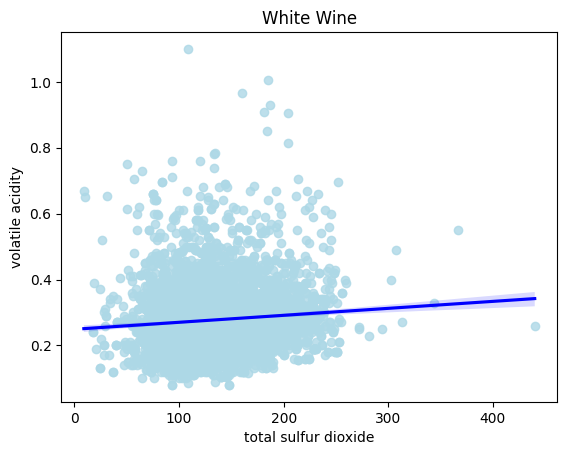

In [376]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

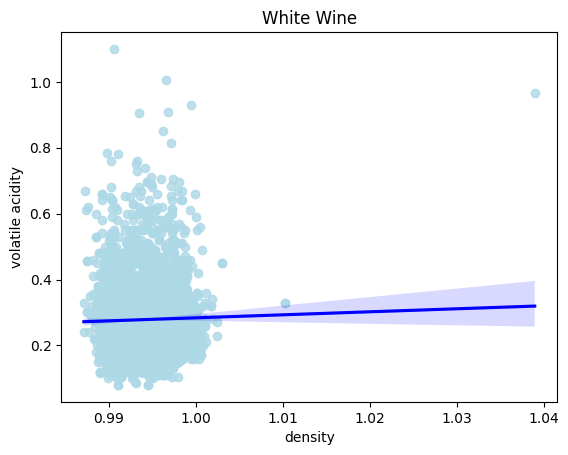

In [377]:
g = sns.regplot(data=df_white, x="density", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

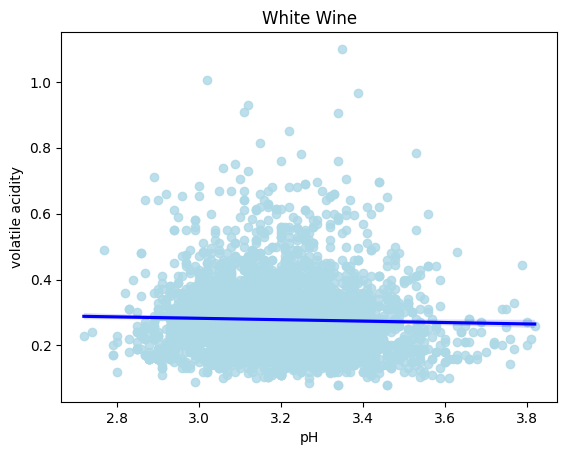

In [378]:
g = sns.regplot(data=df_white, x="pH", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

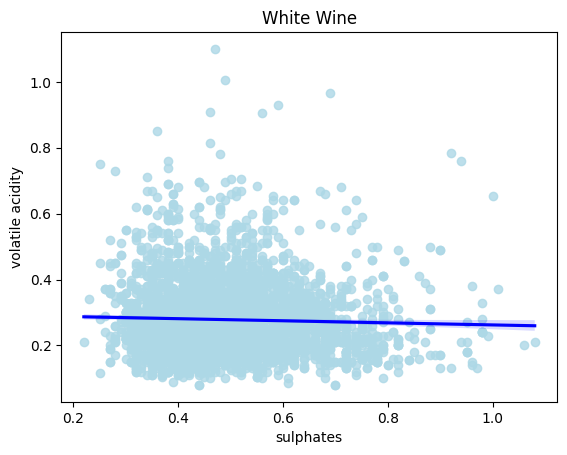

In [379]:
g = sns.regplot(data=df_white, x="sulphates", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

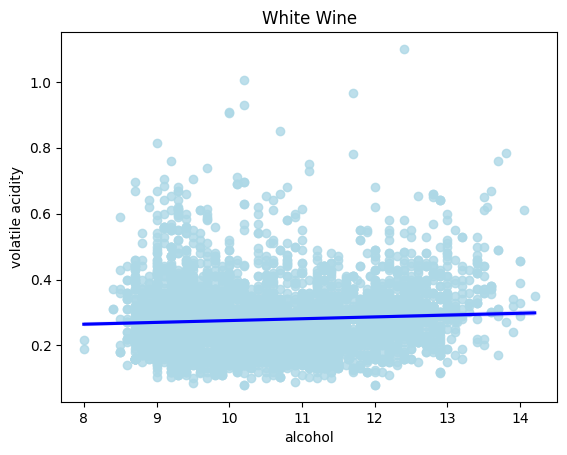

In [380]:
g = sns.regplot(data=df_white, x="alcohol", y="volatile acidity", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Citric Acid

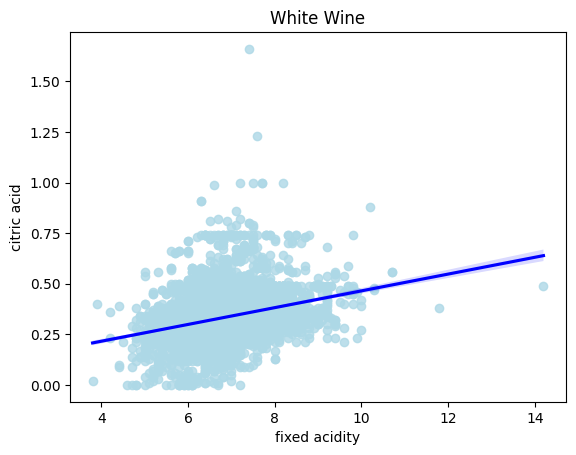

In [381]:
g = sns.regplot(data=df_white, x="fixed acidity", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

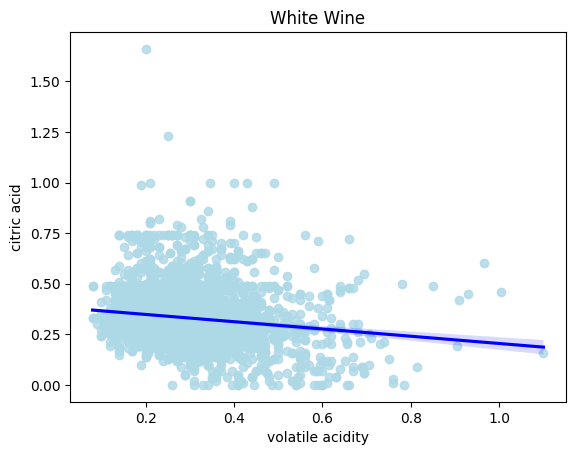

In [382]:
g = sns.regplot(data=df_white, x="volatile acidity", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

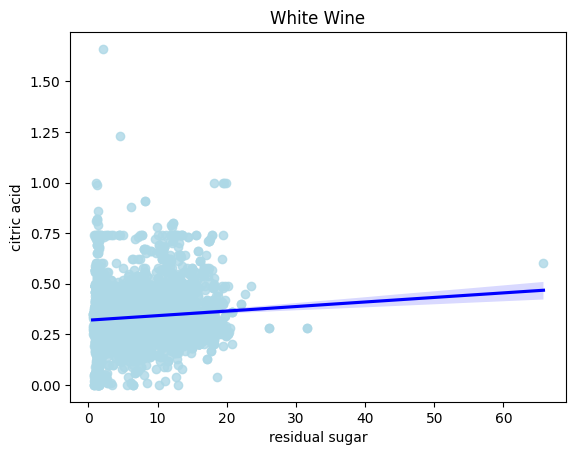

In [383]:
g = sns.regplot(data=df_white, x="residual sugar", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

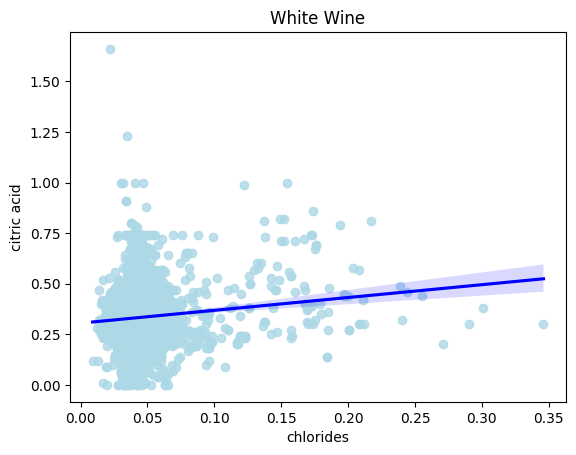

In [384]:
g = sns.regplot(data=df_white, x="chlorides", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

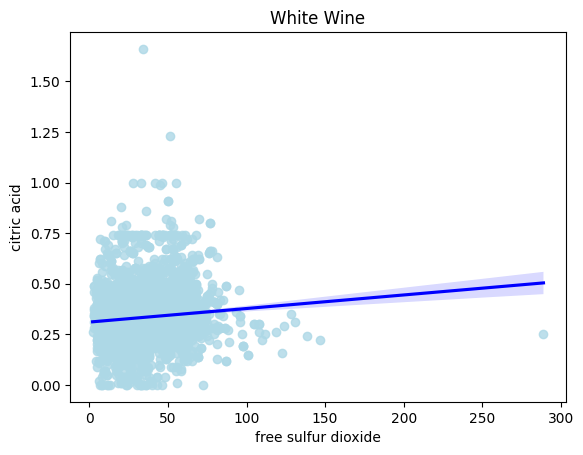

In [385]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

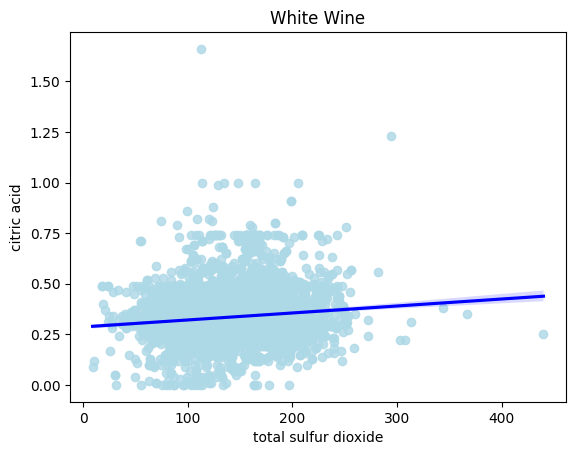

In [386]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

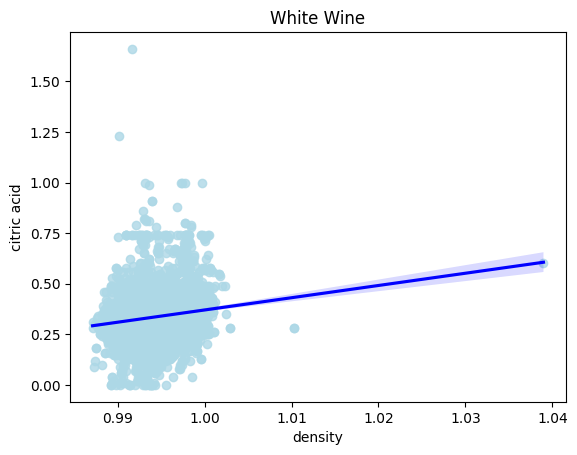

In [387]:
g = sns.regplot(data=df_white, x="density", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

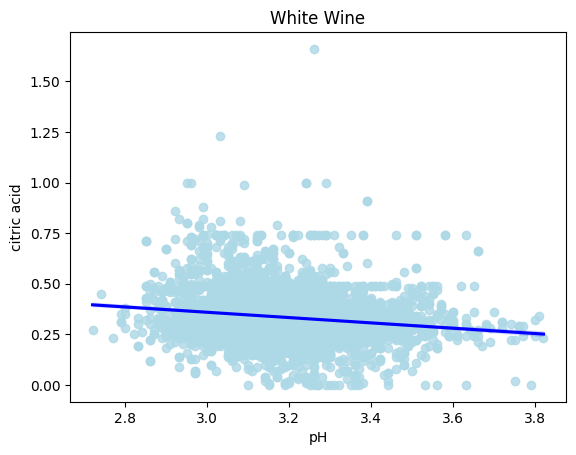

In [388]:
g = sns.regplot(data=df_white, x="pH", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

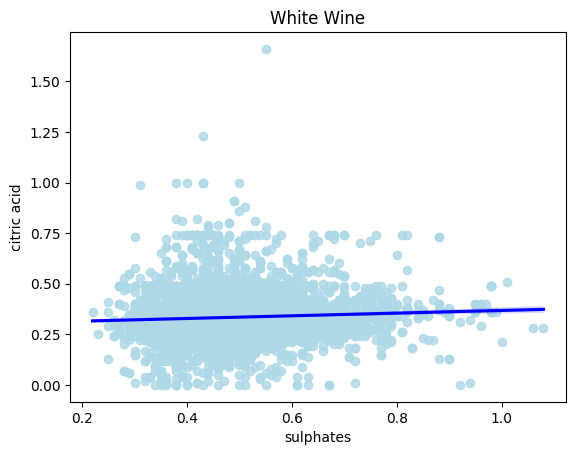

In [389]:
g = sns.regplot(data=df_white, x="sulphates", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

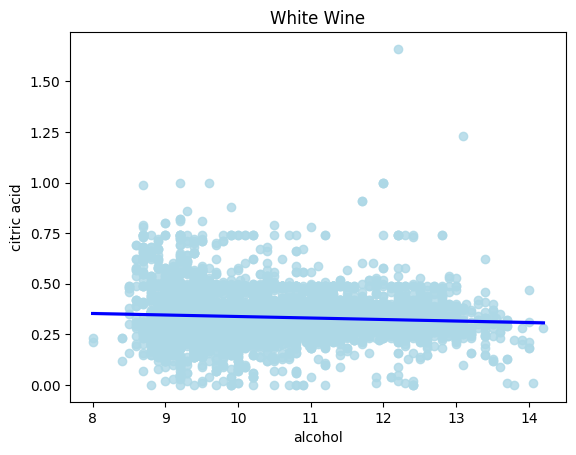

In [390]:
g = sns.regplot(data=df_white, x="alcohol", y="citric acid", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Residual Sugar:

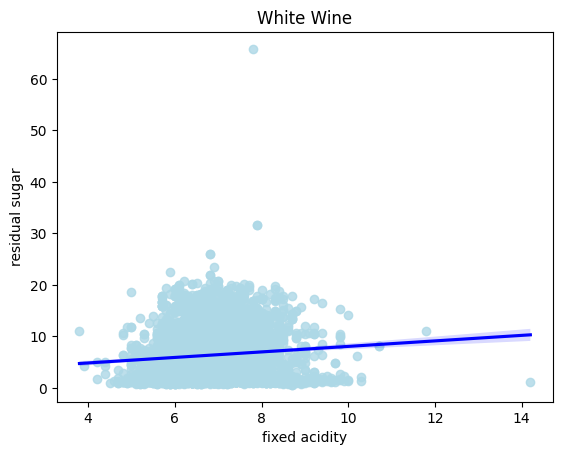

In [391]:
g = sns.regplot(data=df_white, x="fixed acidity", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

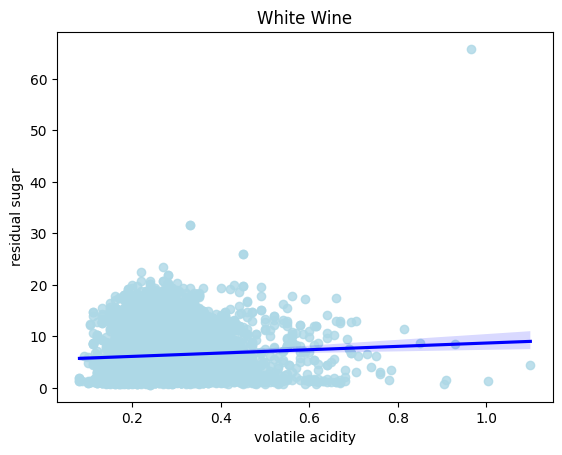

In [392]:
g = sns.regplot(data=df_white, x="volatile acidity", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

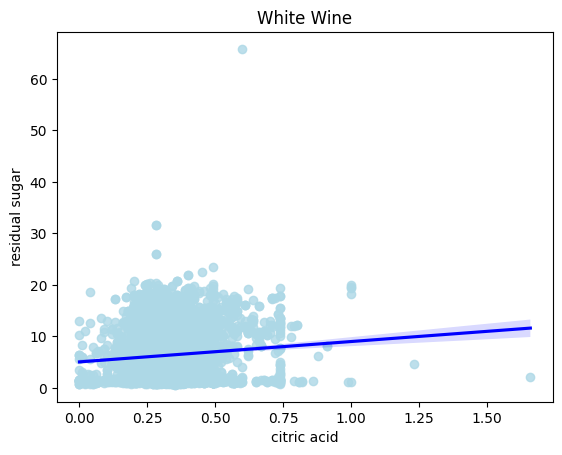

In [393]:
g = sns.regplot(data=df_white, x="citric acid", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

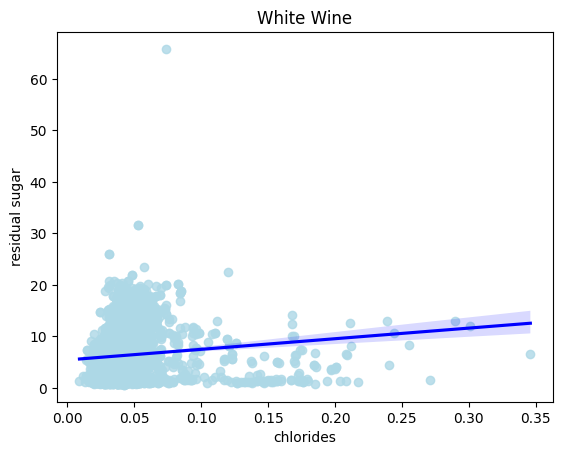

In [394]:
g = sns.regplot(data=df_white, x="chlorides", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

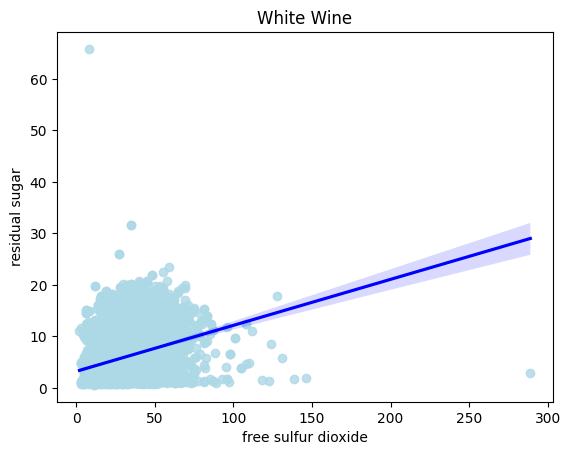

In [395]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

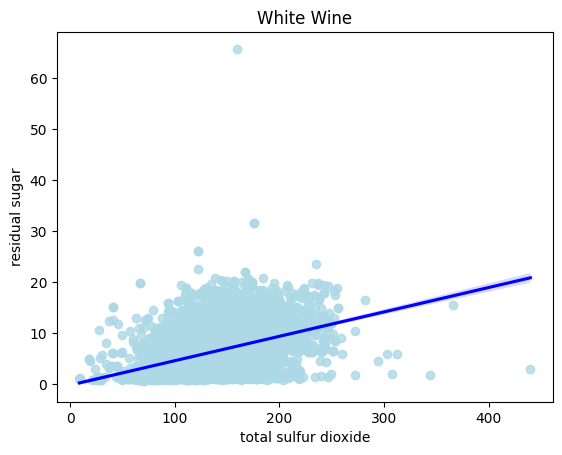

In [396]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

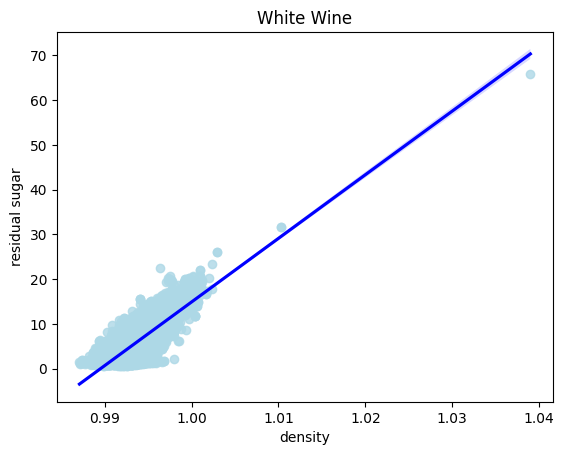

In [397]:
g = sns.regplot(data=df_white, x="density", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

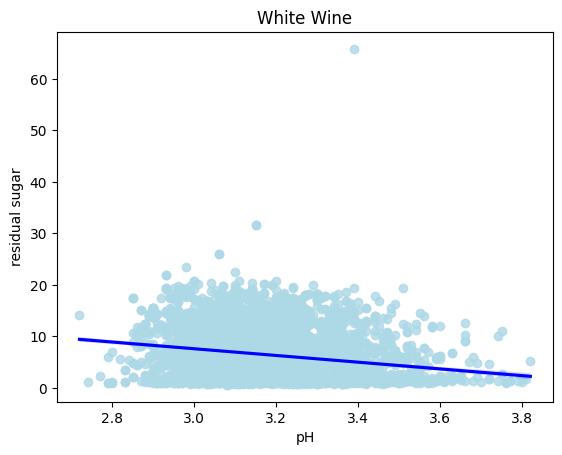

In [398]:
g = sns.regplot(data=df_white, x="pH", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

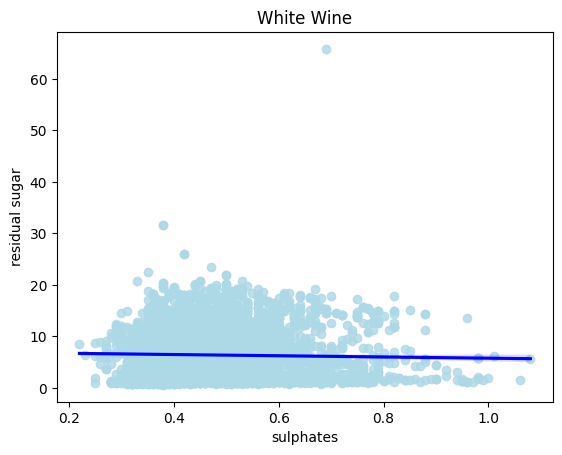

In [399]:
g = sns.regplot(data=df_white, x="sulphates", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

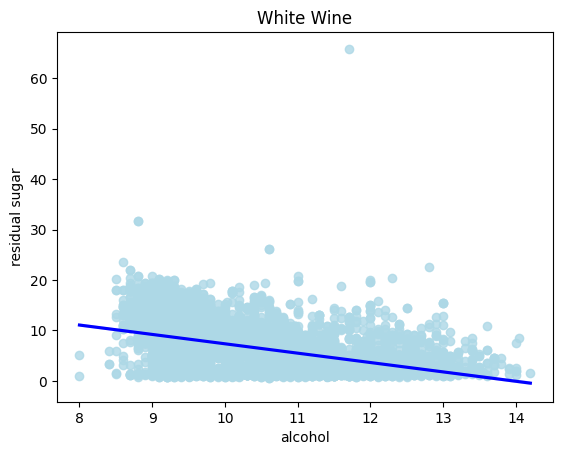

In [400]:
g = sns.regplot(data=df_white, x="alcohol", y="residual sugar", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Chlorides:

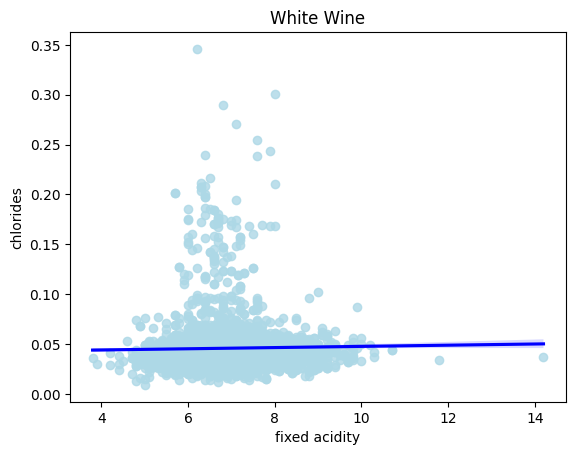

In [401]:
g = sns.regplot(data=df_white, x="fixed acidity", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

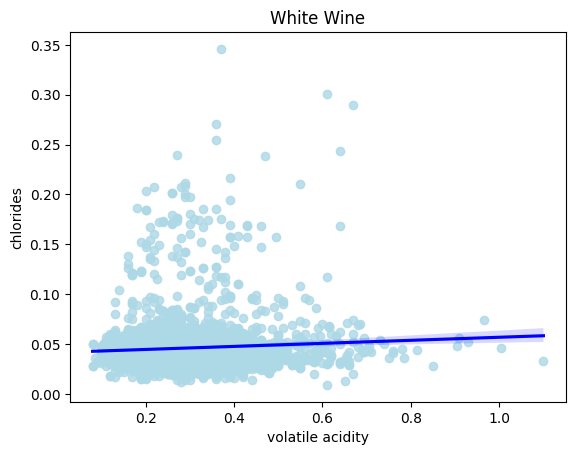

In [402]:
g = sns.regplot(data=df_white, x="volatile acidity", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

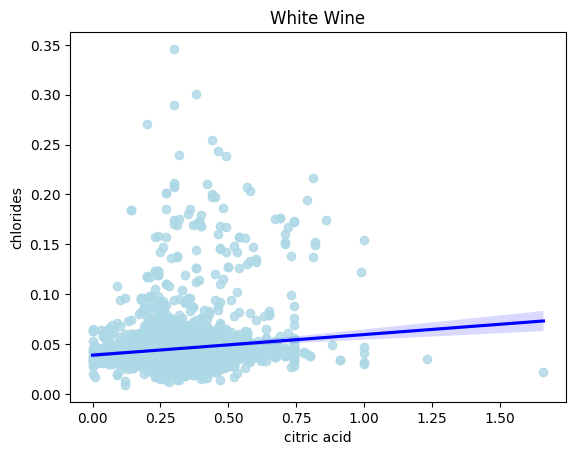

In [403]:
g = sns.regplot(data=df_white, x="citric acid", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

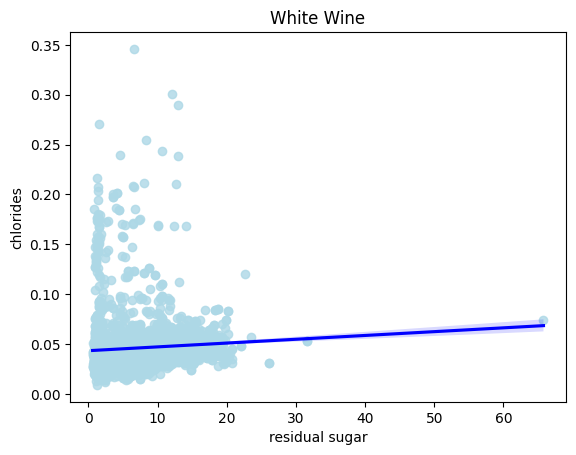

In [404]:
g = sns.regplot(data=df_white, x="residual sugar", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

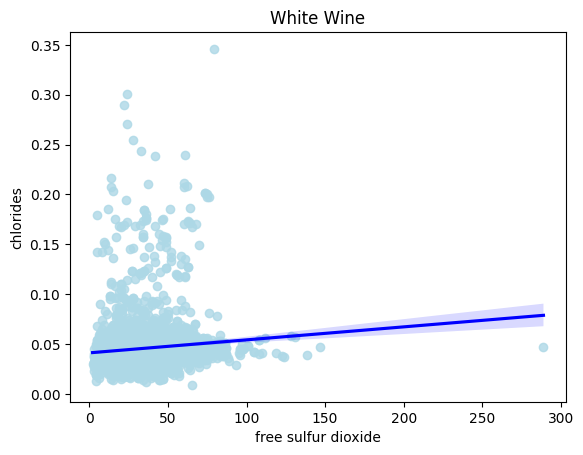

In [405]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

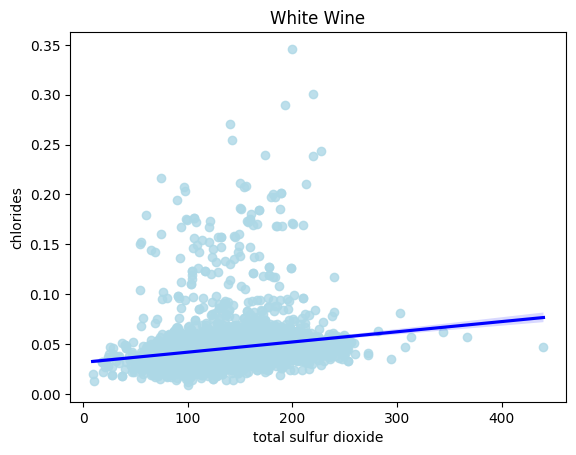

In [406]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

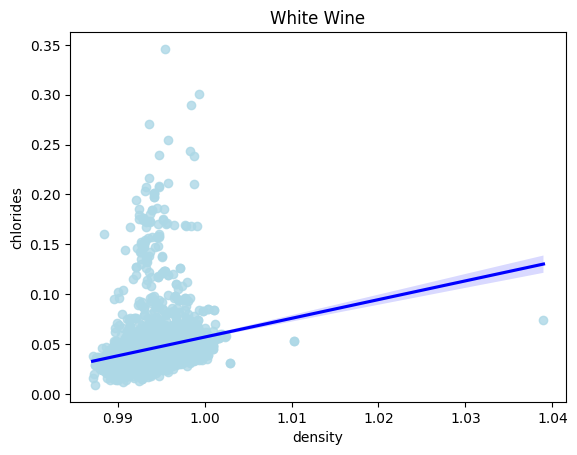

In [407]:
g = sns.regplot(data=df_white, x="density", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

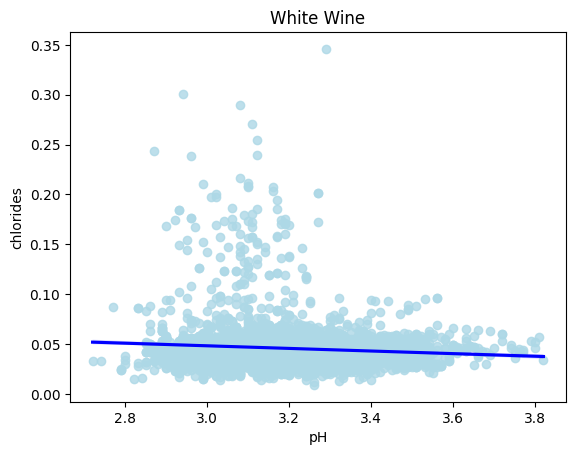

In [408]:
g = sns.regplot(data=df_white, x="pH", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

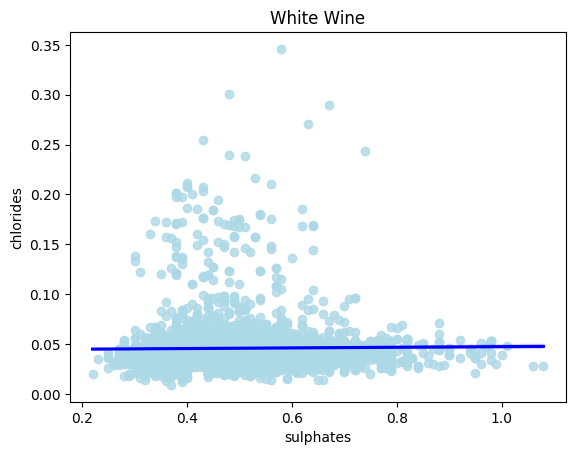

In [409]:
g = sns.regplot(data=df_white, x="sulphates", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

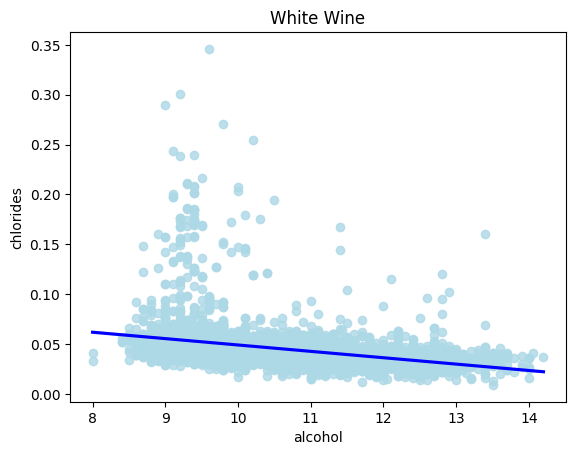

In [410]:
g = sns.regplot(data=df_white, x="alcohol", y="chlorides", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Free Sulfur Dioxide:

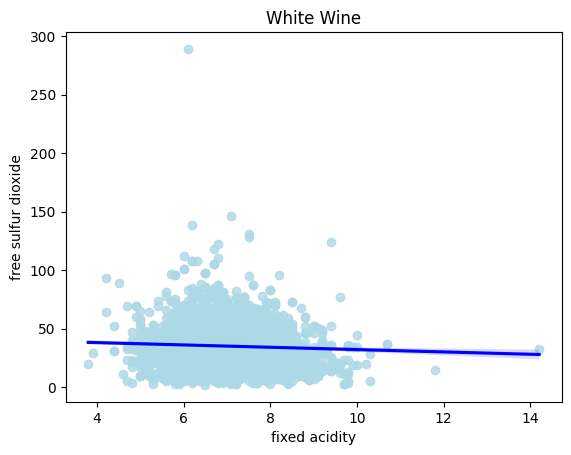

In [411]:
g = sns.regplot(data=df_white, x="fixed acidity", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

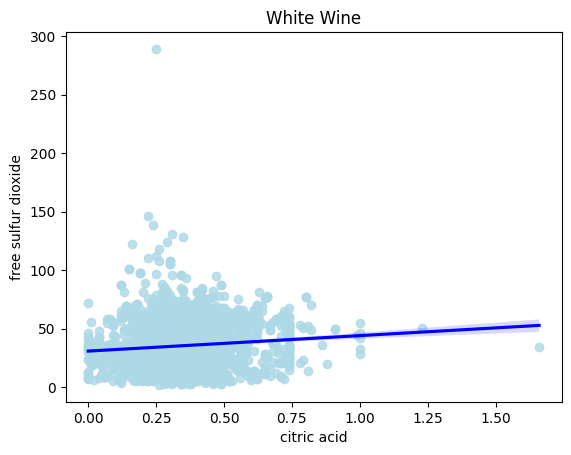

In [412]:
g = sns.regplot(data=df_white, x="citric acid", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

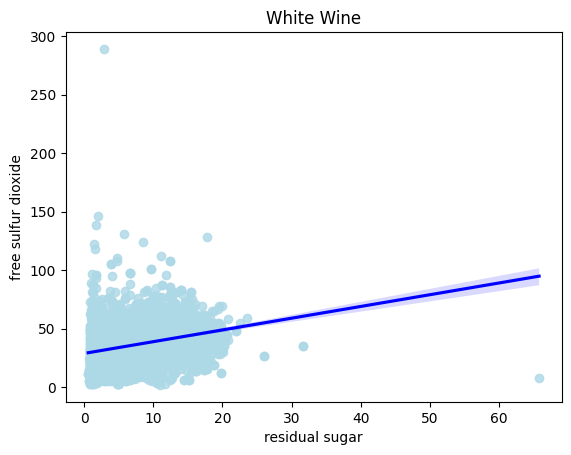

In [413]:
g = sns.regplot(data=df_white, x="residual sugar", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

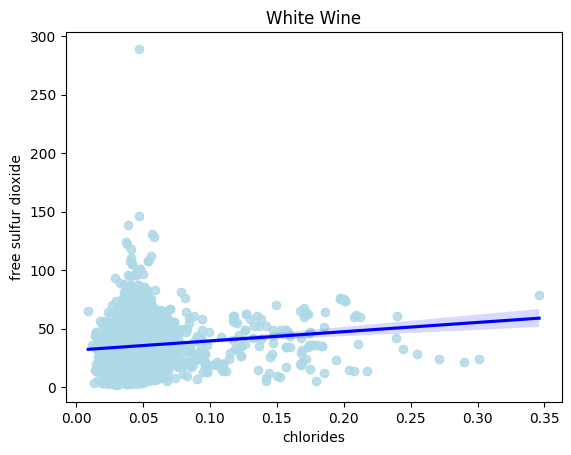

In [414]:
g = sns.regplot(data=df_white, x="chlorides", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

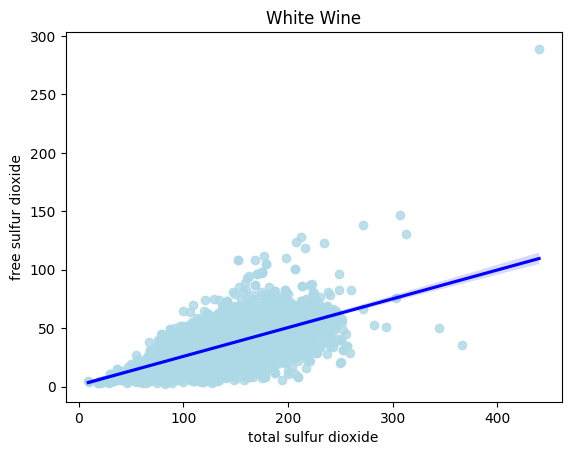

In [415]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

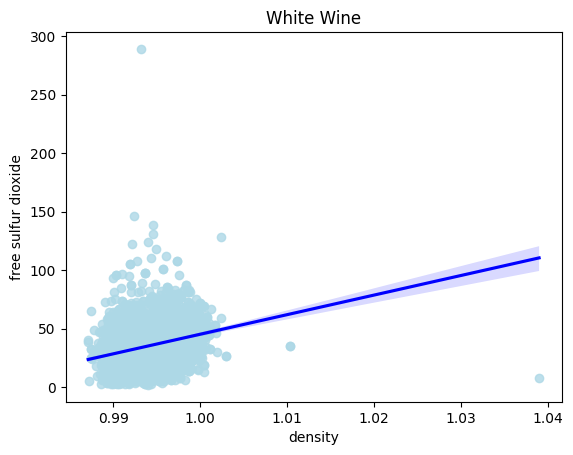

In [416]:
g = sns.regplot(data=df_white, x="density", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

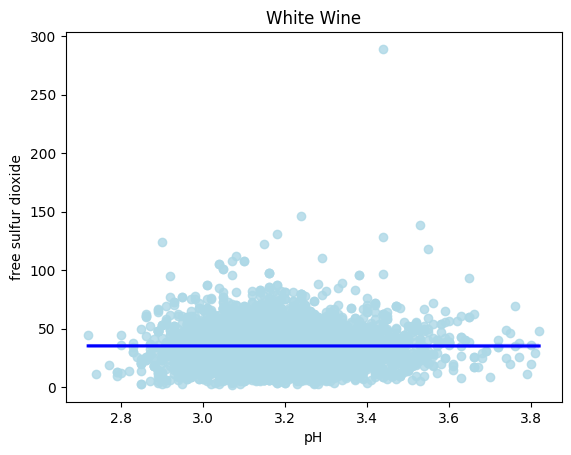

In [417]:
g = sns.regplot(data=df_white, x="pH", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

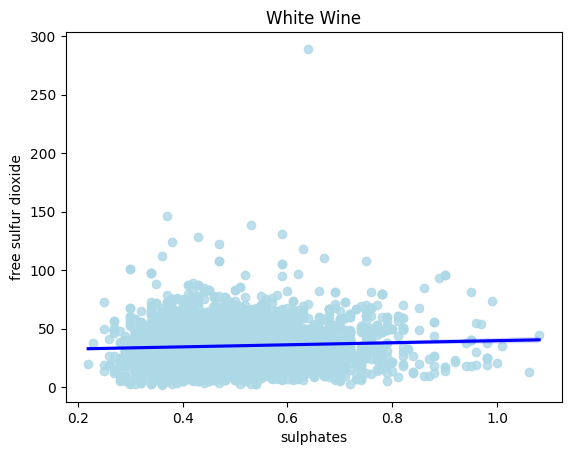

In [418]:
g = sns.regplot(data=df_white, x="sulphates", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

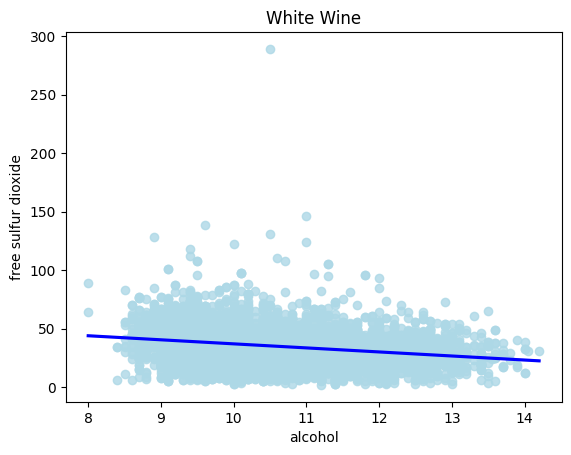

In [419]:
g = sns.regplot(data=df_white, x="alcohol", y="free sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Total Sulfur Dioxide:

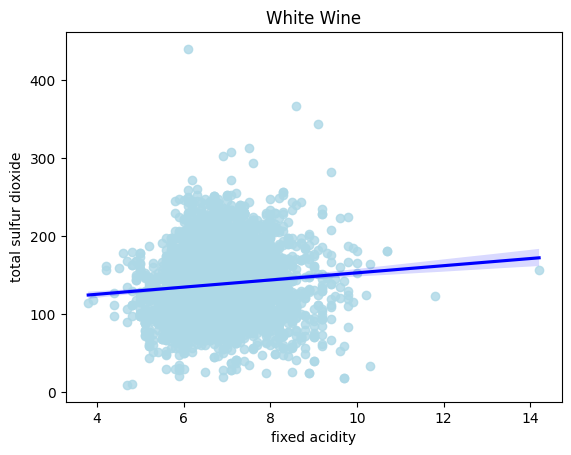

In [420]:
g = sns.regplot(data=df_white, x="fixed acidity", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

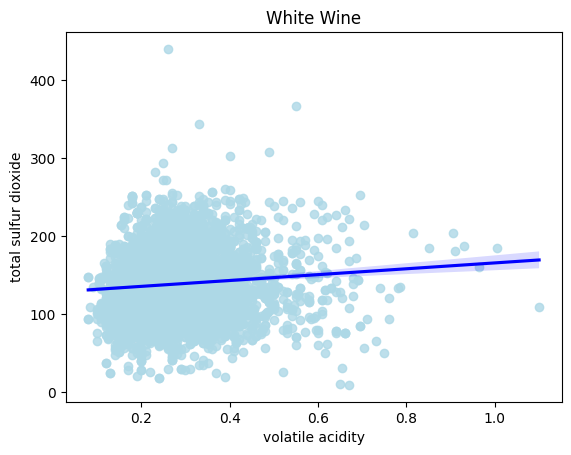

In [421]:
g = sns.regplot(data=df_white, x="volatile acidity", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

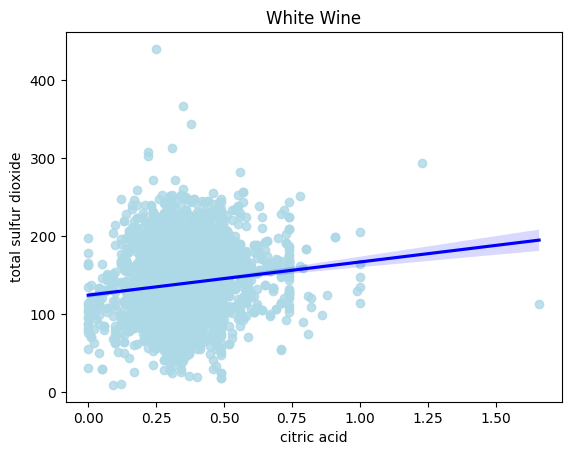

In [422]:
g = sns.regplot(data=df_white, x="citric acid", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

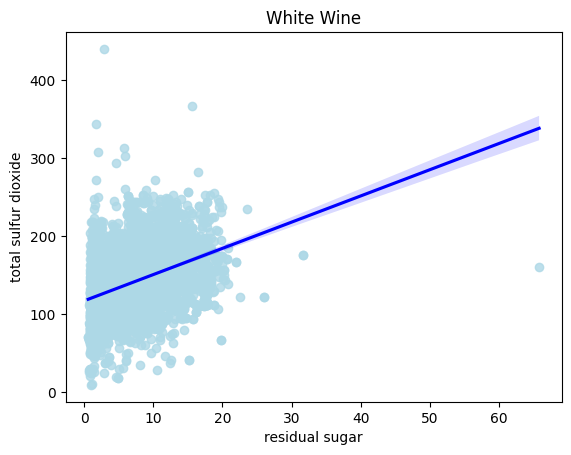

In [423]:
g = sns.regplot(data=df_white, x="residual sugar", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

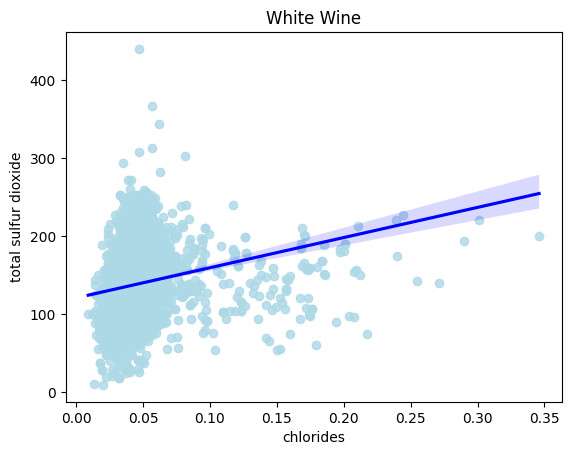

In [424]:
g = sns.regplot(data=df_white, x="chlorides", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

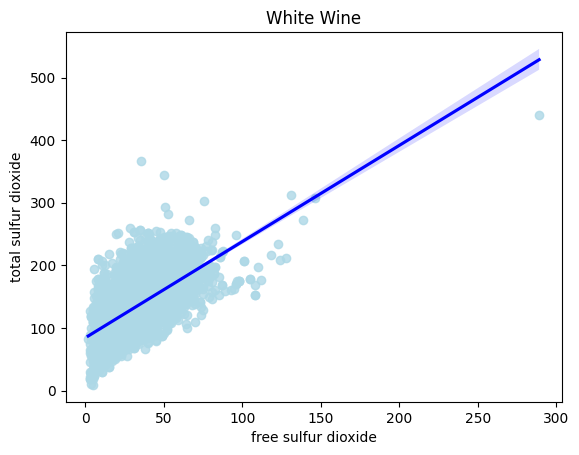

In [425]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

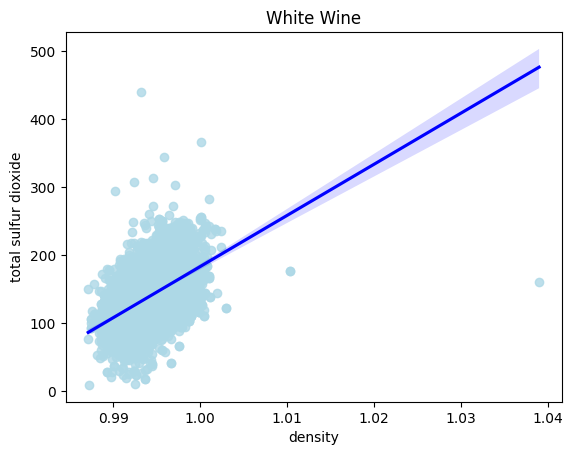

In [426]:
g = sns.regplot(data=df_white, x="density", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

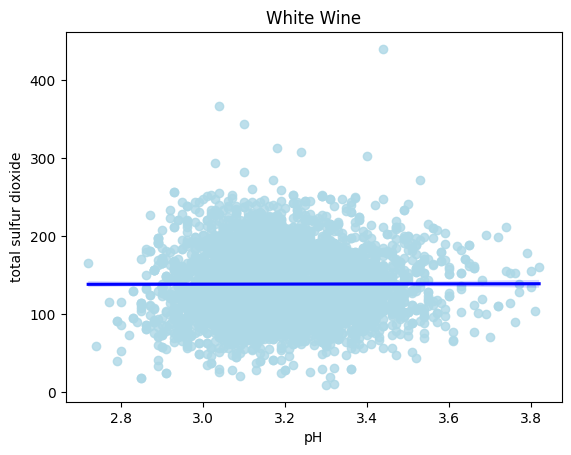

In [427]:
g = sns.regplot(data=df_white, x="pH", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

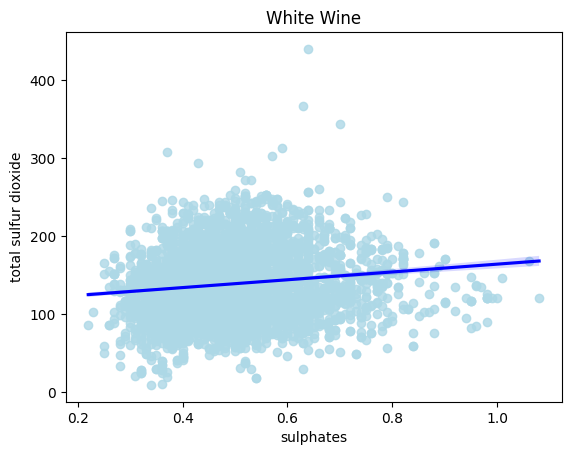

In [428]:
g = sns.regplot(data=df_white, x="sulphates", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

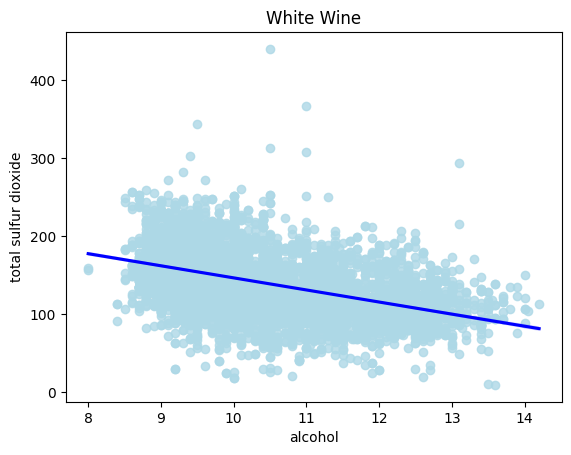

In [429]:
g = sns.regplot(data=df_white, x="alcohol", y="total sulfur dioxide", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

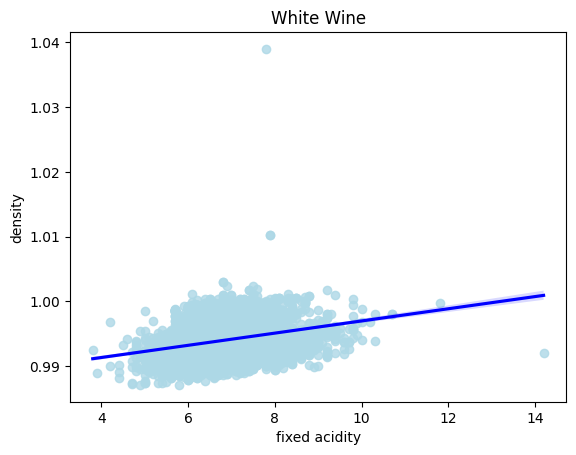

In [430]:
g = sns.regplot(data=df_white, x="fixed acidity", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Density:

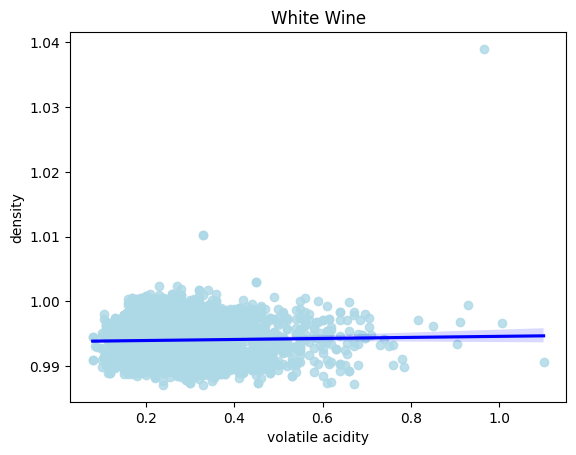

In [431]:
g = sns.regplot(data=df_white, x="volatile acidity", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

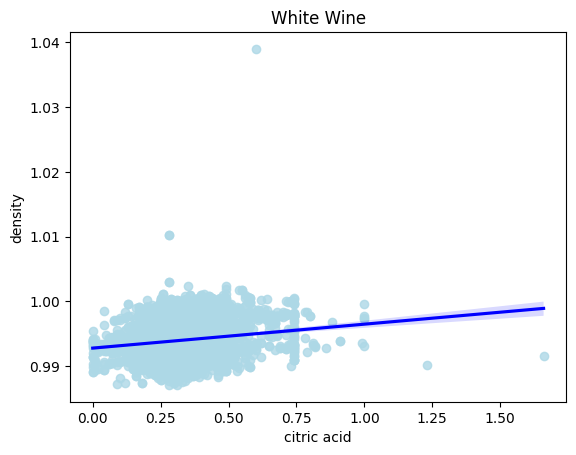

In [432]:
g = sns.regplot(data=df_white, x="citric acid", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

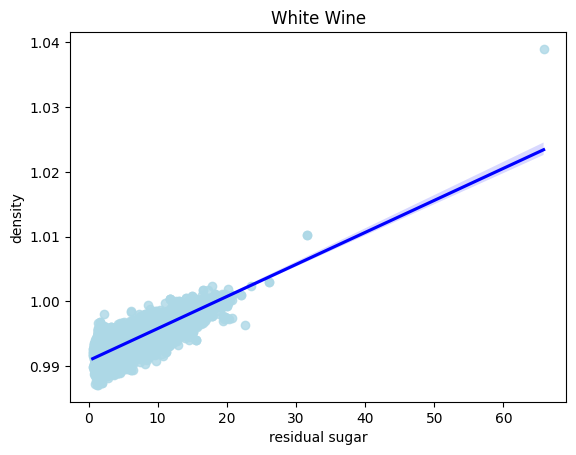

In [433]:
g = sns.regplot(data=df_white, x="residual sugar", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

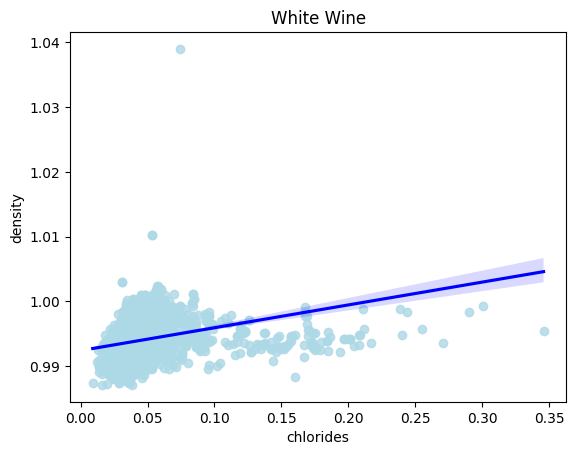

In [434]:
g = sns.regplot(data=df_white, x="chlorides", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

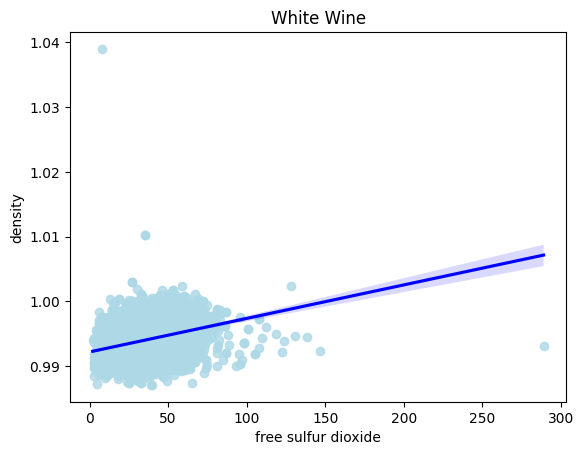

In [435]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

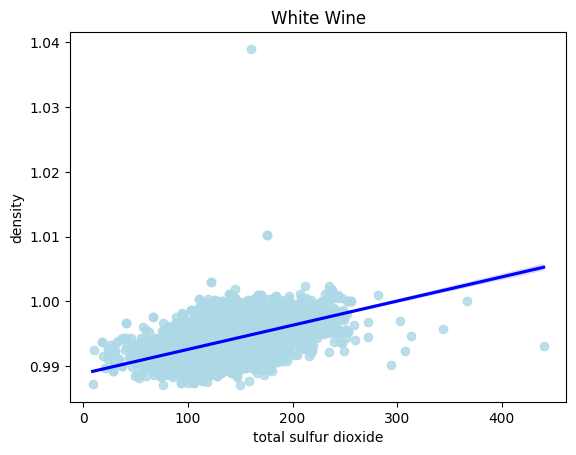

In [436]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

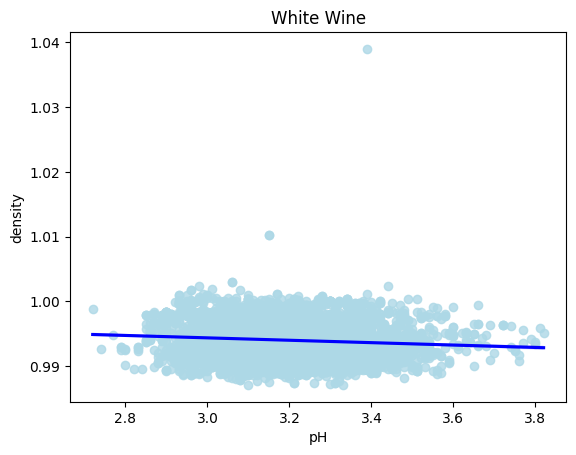

In [437]:
g = sns.regplot(data=df_white, x="pH", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

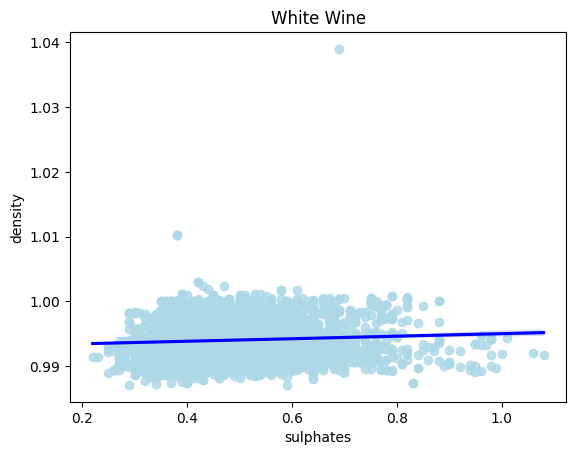

In [438]:
g = sns.regplot(data=df_white, x="sulphates", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

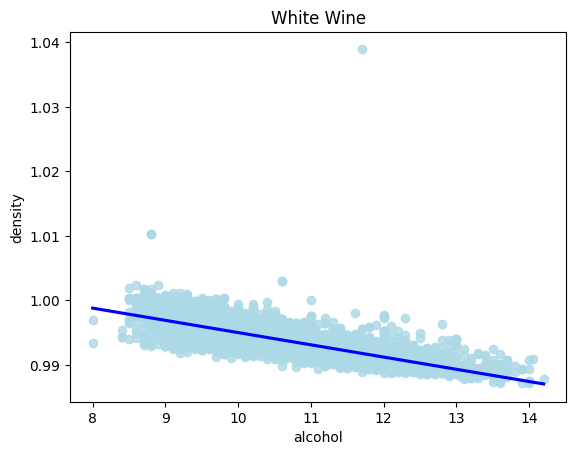

In [439]:
g = sns.regplot(data=df_white, x="alcohol", y="density", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with pH:

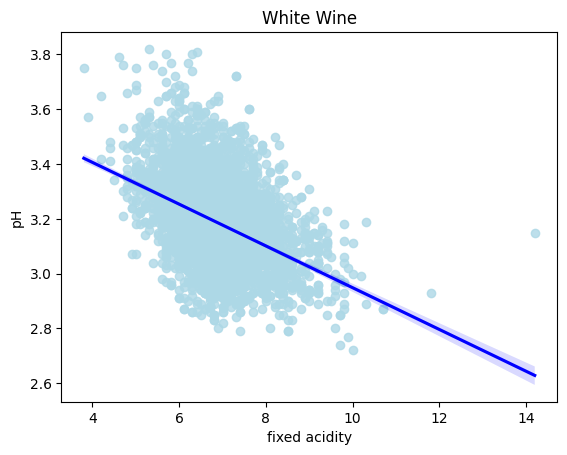

In [440]:
g = sns.regplot(data=df_white, x="fixed acidity", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

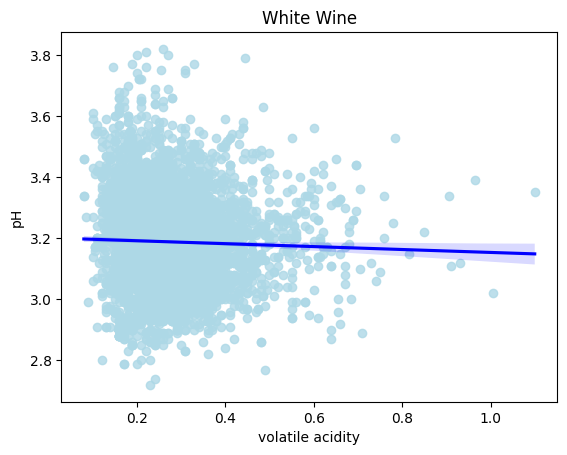

In [441]:
g = sns.regplot(data=df_white, x="volatile acidity", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

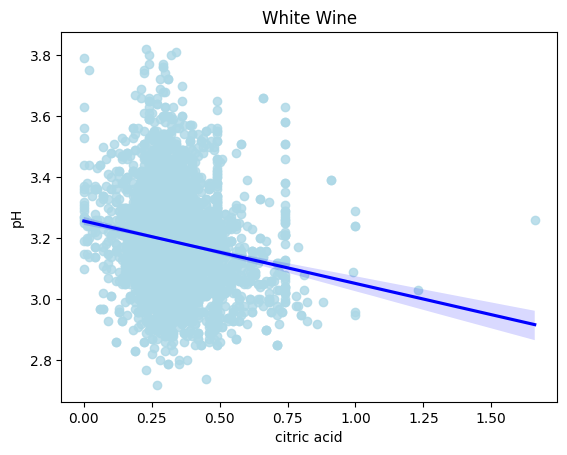

In [442]:
g = sns.regplot(data=df_white, x="citric acid", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

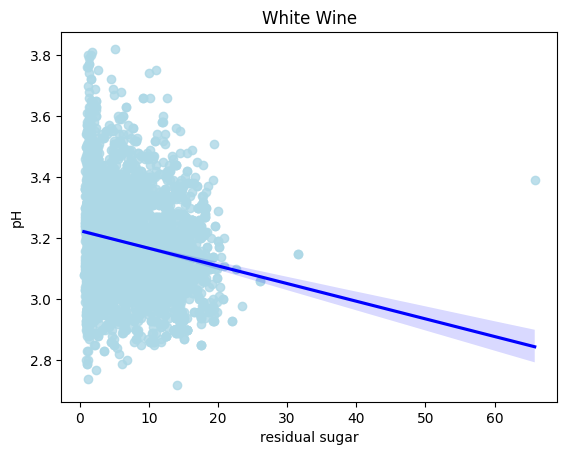

In [443]:
g = sns.regplot(data=df_white, x="residual sugar", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

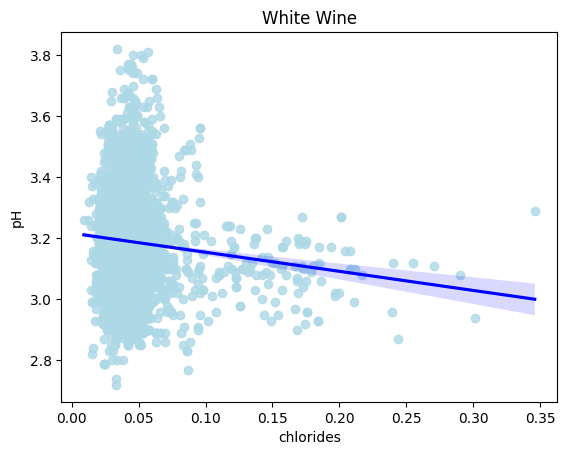

In [444]:
g = sns.regplot(data=df_white, x="chlorides", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

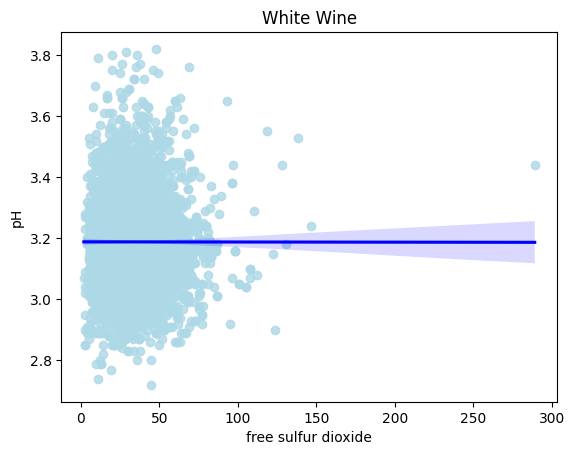

In [445]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

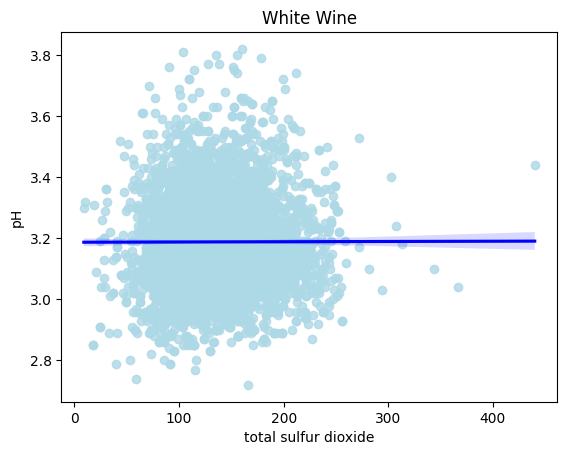

In [446]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

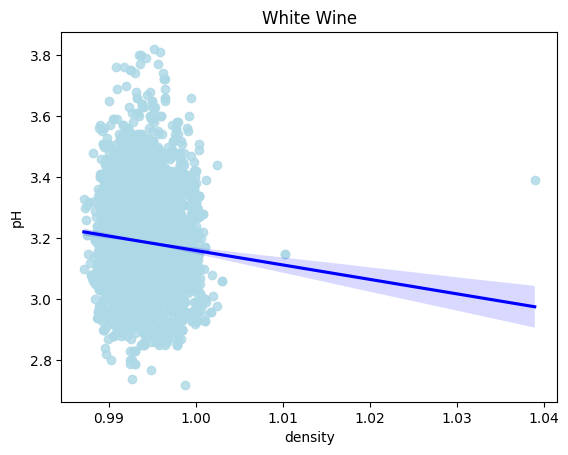

In [447]:
g = sns.regplot(data=df_white, x="density", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

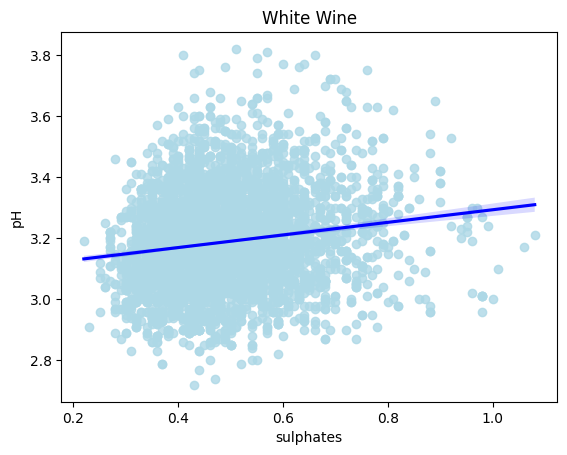

In [448]:
g = sns.regplot(data=df_white, x="sulphates", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

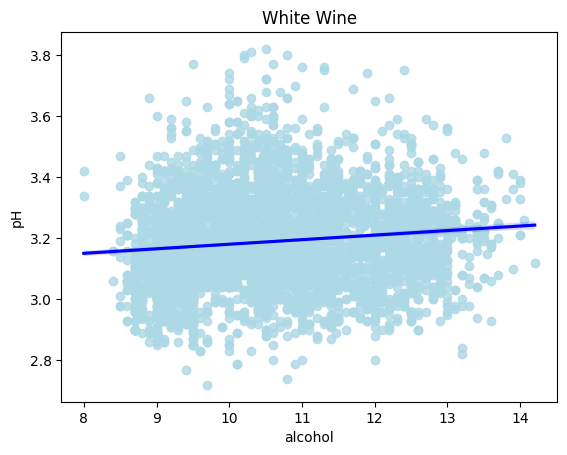

In [449]:
g = sns.regplot(data=df_white, x="alcohol", y="pH", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Sulphates:

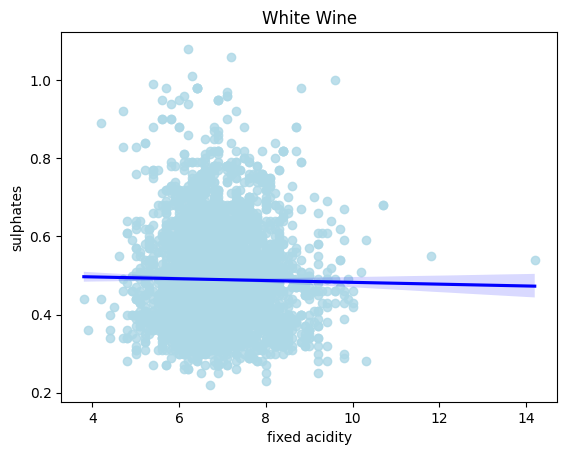

In [450]:
g = sns.regplot(data=df_white, x="fixed acidity", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

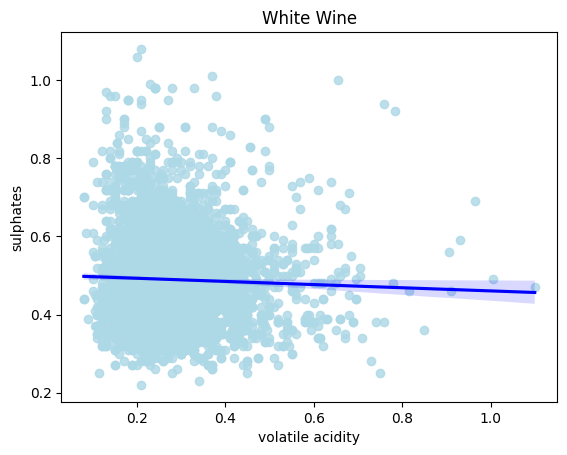

In [451]:
g = sns.regplot(data=df_white, x="volatile acidity", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

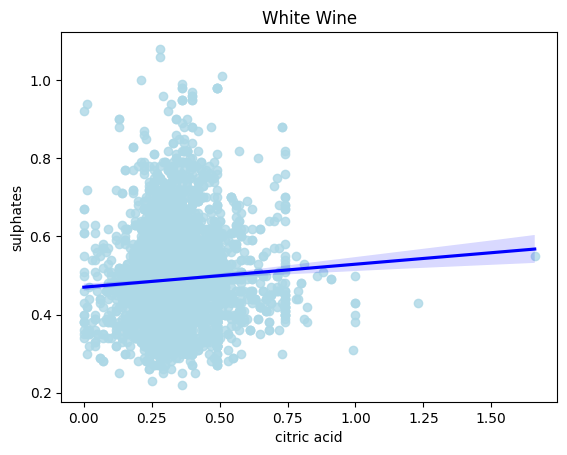

In [452]:
g = sns.regplot(data=df_white, x="citric acid", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

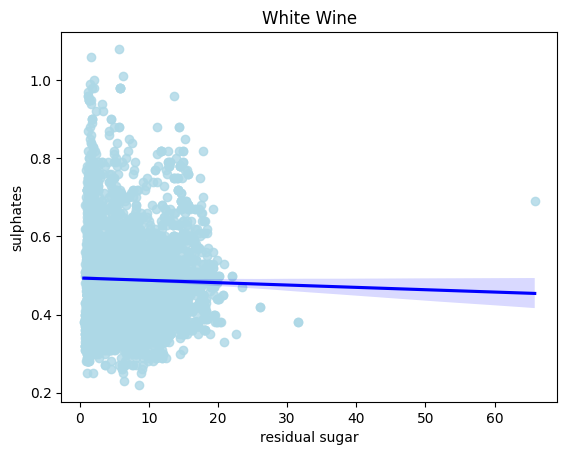

In [453]:
g = sns.regplot(data=df_white, x="residual sugar", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

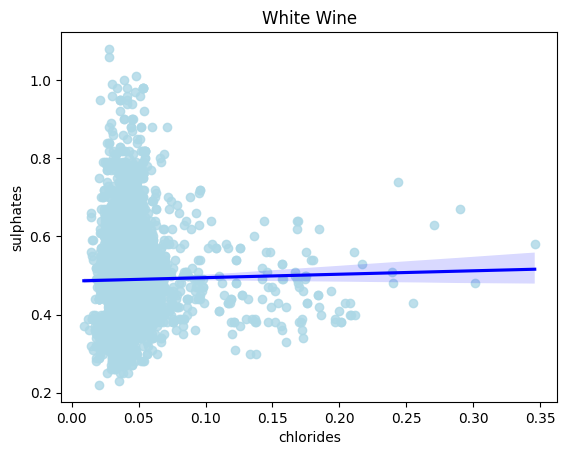

In [454]:
g = sns.regplot(data=df_white, x="chlorides", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

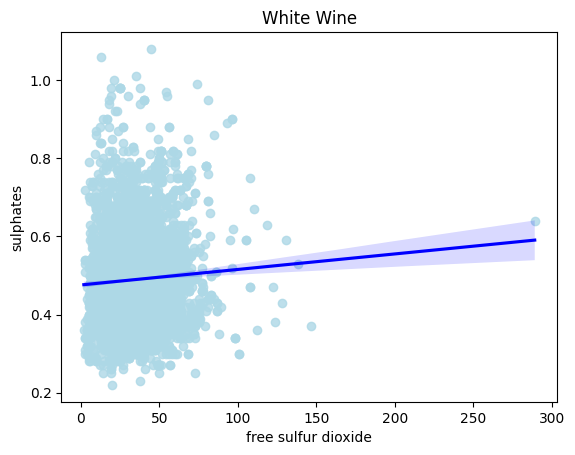

In [455]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

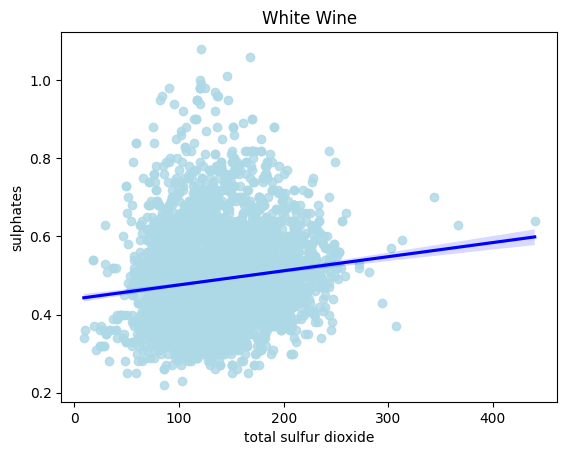

In [456]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

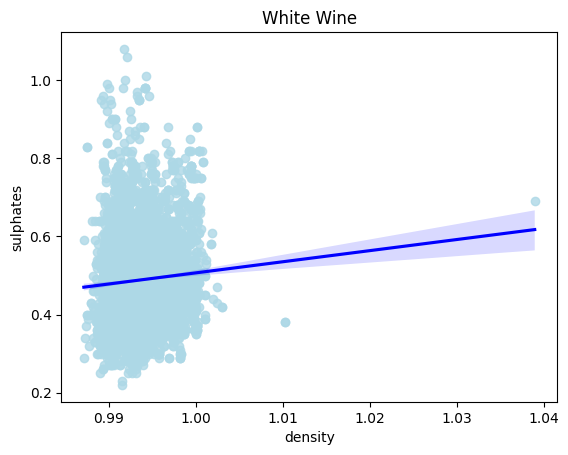

In [457]:
g = sns.regplot(data=df_white, x="density", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

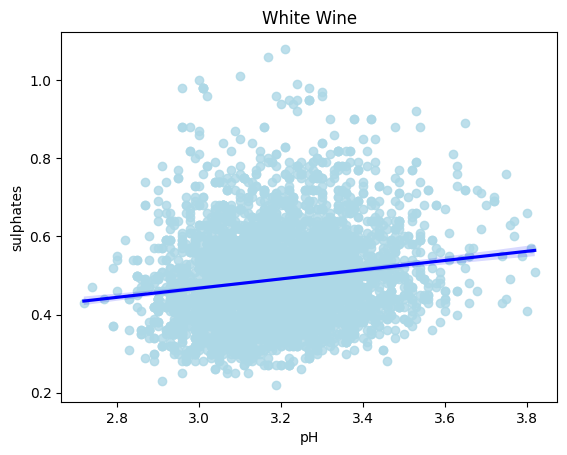

In [458]:
g = sns.regplot(data=df_white, x="pH", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

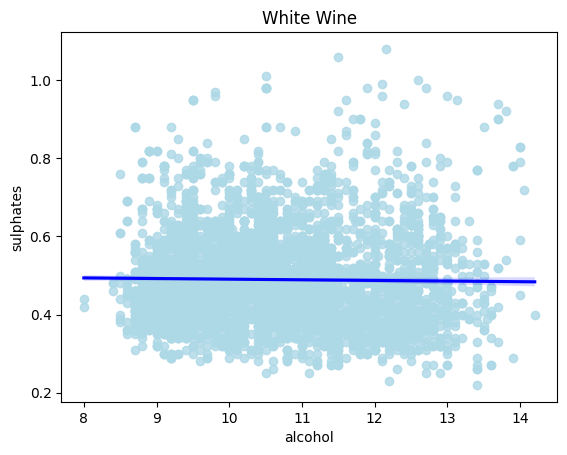

In [459]:
g = sns.regplot(data=df_white, x="alcohol", y="sulphates", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Now with Alcohol:

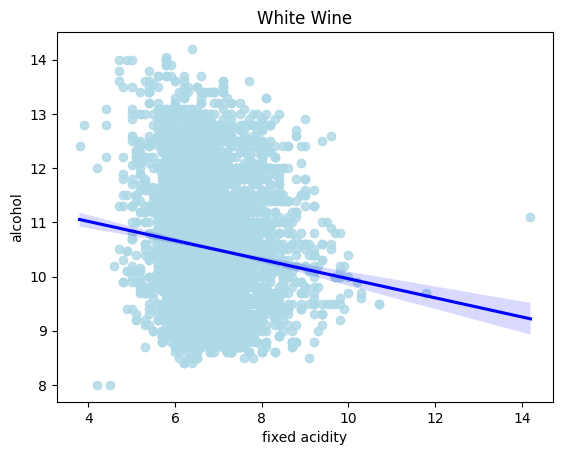

In [460]:
g = sns.regplot(data=df_white, x="fixed acidity", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

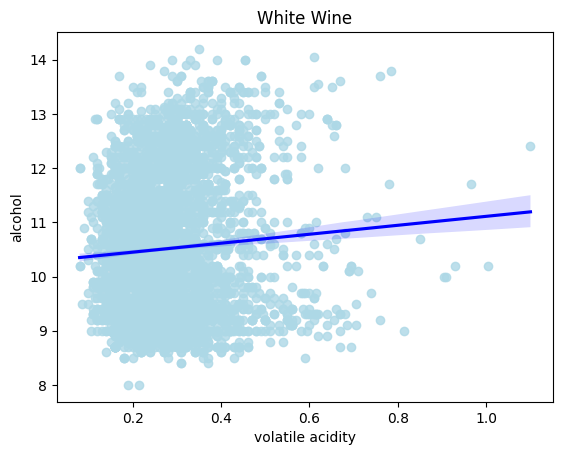

In [461]:
g = sns.regplot(data=df_white, x="volatile acidity", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

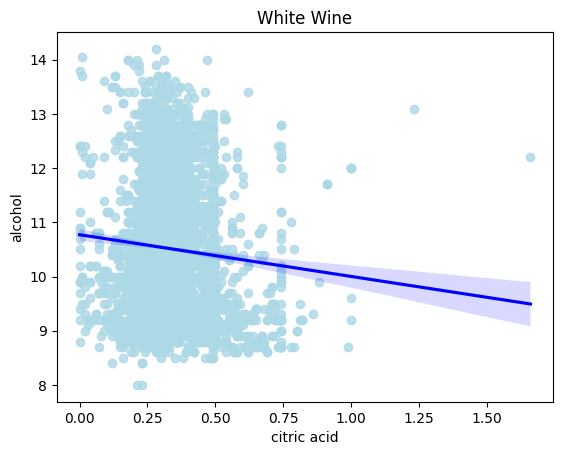

In [462]:
g = sns.regplot(data=df_white, x="citric acid", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

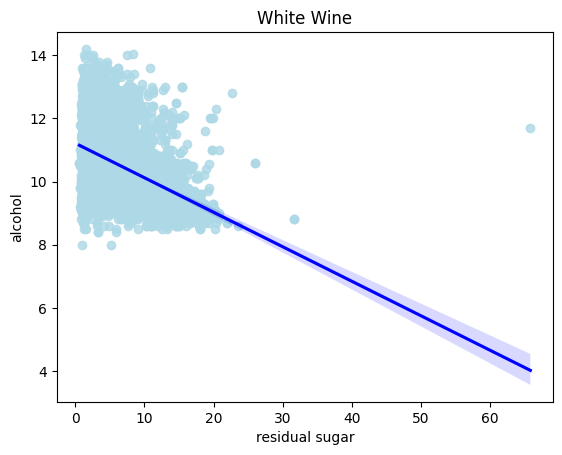

In [463]:
g = sns.regplot(data=df_white, x="residual sugar", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

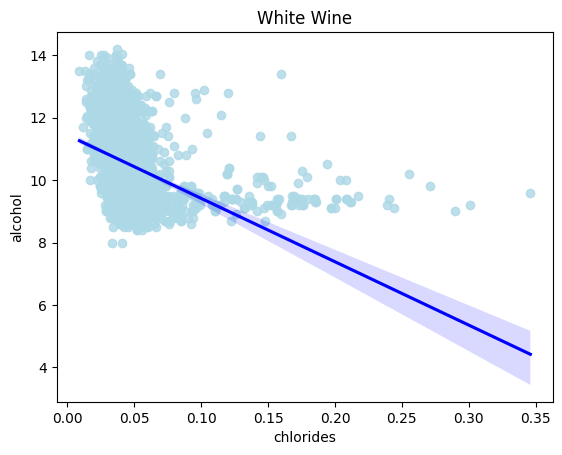

In [464]:
g = sns.regplot(data=df_white, x="chlorides", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

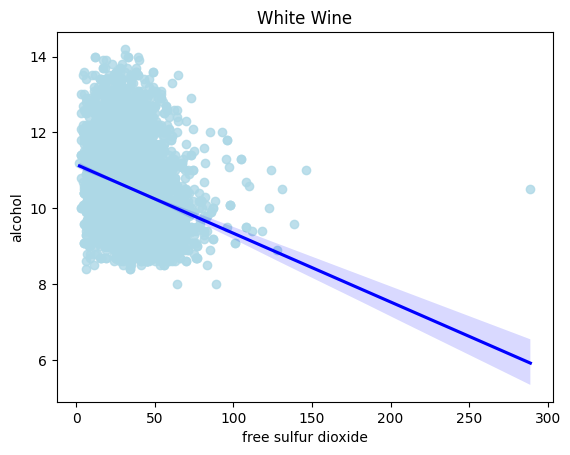

In [465]:
g = sns.regplot(data=df_white, x="free sulfur dioxide", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

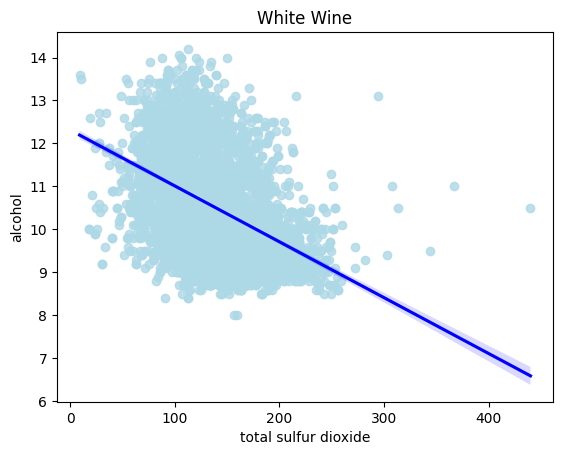

In [466]:
g = sns.regplot(data=df_white, x="total sulfur dioxide", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

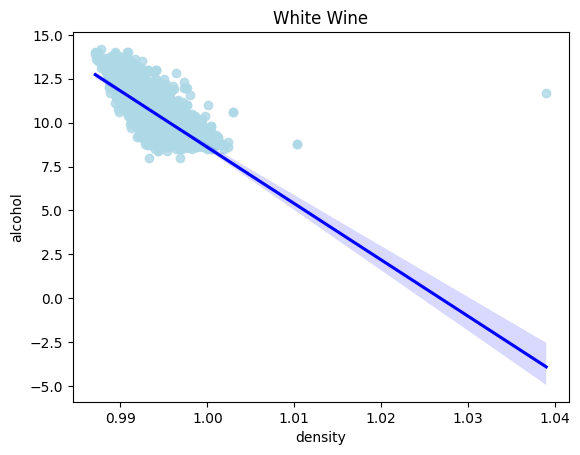

In [467]:
g = sns.regplot(data=df_white, x="density", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

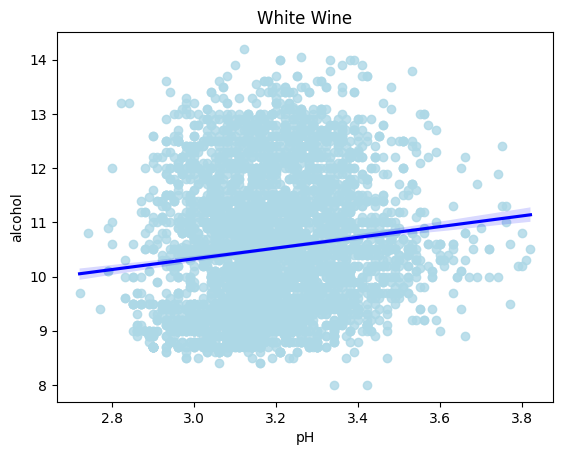

In [468]:
g = sns.regplot(data=df_white, x="pH", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

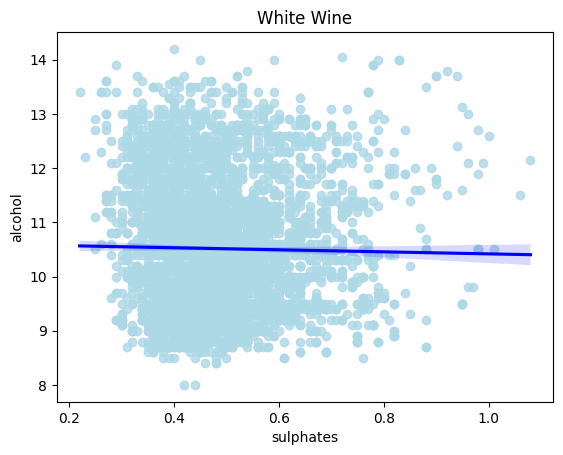

In [469]:
g = sns.regplot(data=df_white, x="sulphates", y="alcohol", scatter_kws={"color":"lightblue"}, line_kws={"color":"blue"}).set(title = "White Wine")

Below are Scattered Plots according to categories:

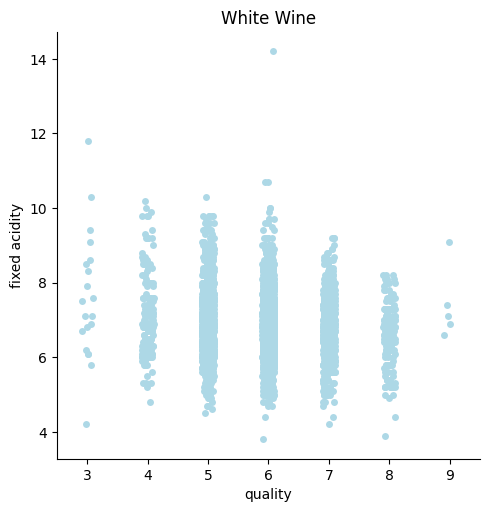

In [470]:
g = sns.catplot(data=df_white, x="quality", y="fixed acidity", color="lightblue").set(title = "White Wine")

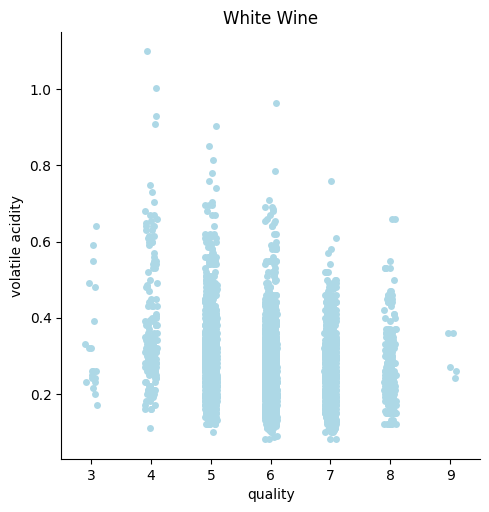

In [471]:
g = sns.catplot(data=df_white, x="quality", y="volatile acidity", color="lightblue").set(title = "White Wine")

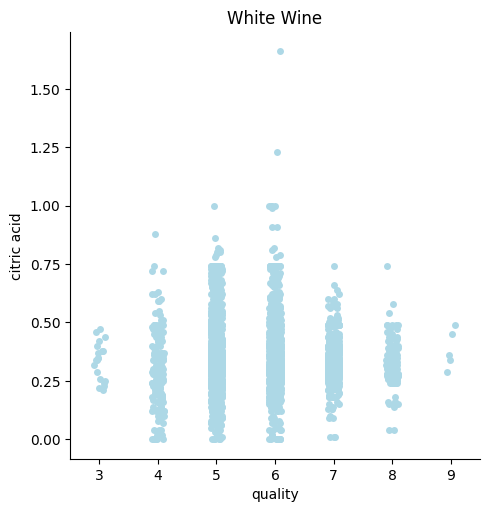

In [472]:
g = sns.catplot(data=df_white, x="quality", y="citric acid", color="lightblue").set(title = "White Wine")

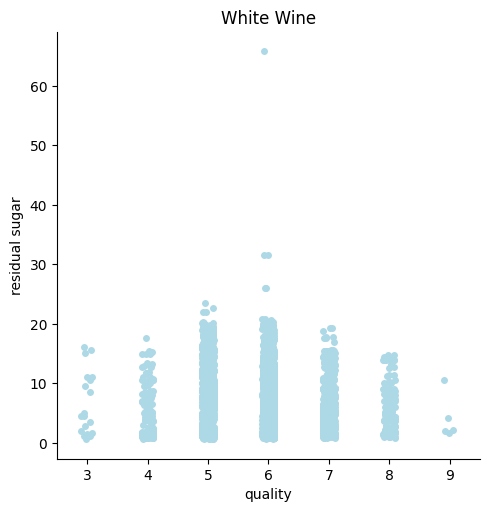

In [473]:
g = sns.catplot(data=df_white, x="quality", y="residual sugar", color="lightblue").set(title = "White Wine")

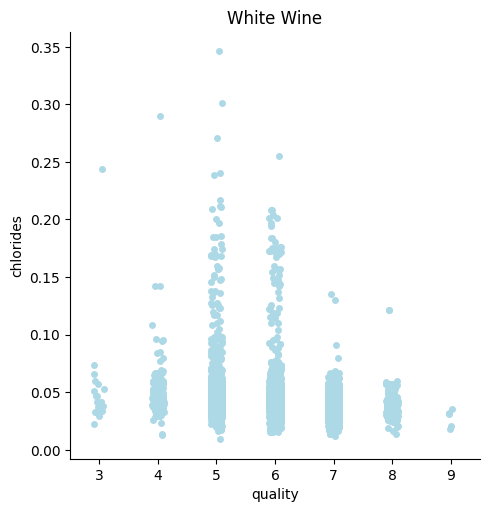

In [474]:
g = sns.catplot(data=df_white, x="quality", y="chlorides", color="lightblue").set(title = "White Wine")

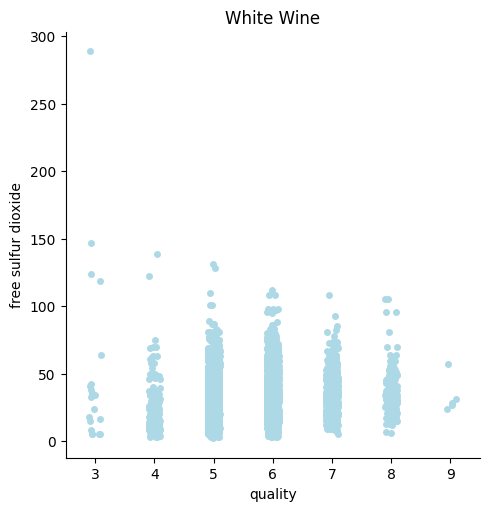

In [475]:
g = sns.catplot(data=df_white, x="quality", y="free sulfur dioxide", color="lightblue").set(title = "White Wine")

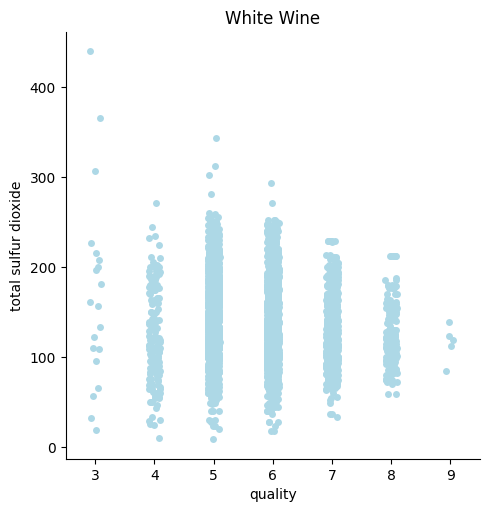

In [476]:
g = sns.catplot(data=df_white, x="quality", y="total sulfur dioxide", color="lightblue").set(title = "White Wine")

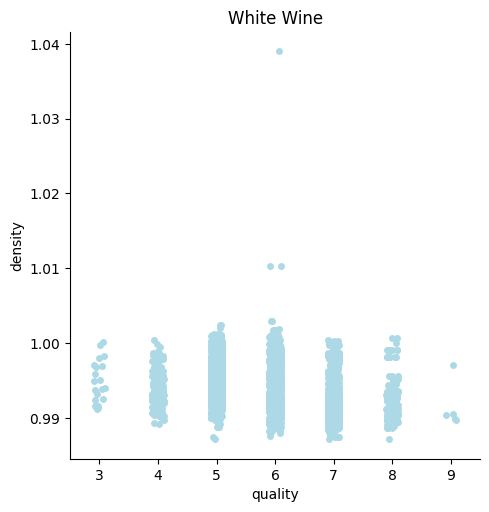

In [477]:
g = sns.catplot(data=df_white, x="quality", y="density", color="lightblue").set(title = "White Wine")

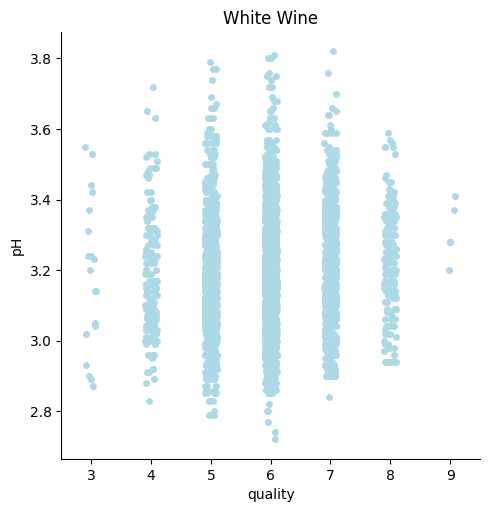

In [478]:
g = sns.catplot(data=df_white, x="quality", y="pH", color="lightblue").set(title = "White Wine")

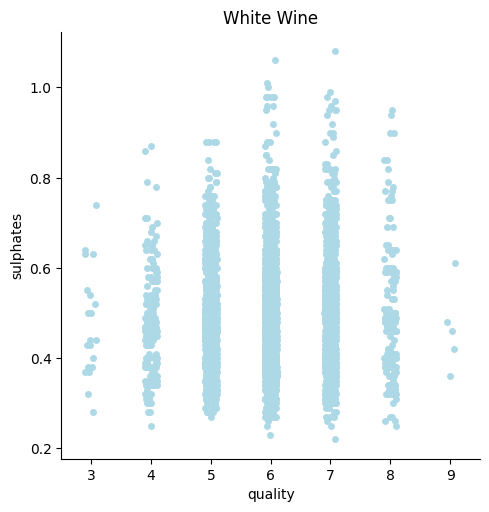

In [479]:
g = sns.catplot(data=df_white, x="quality", y="sulphates", color="lightblue").set(title = "White Wine")

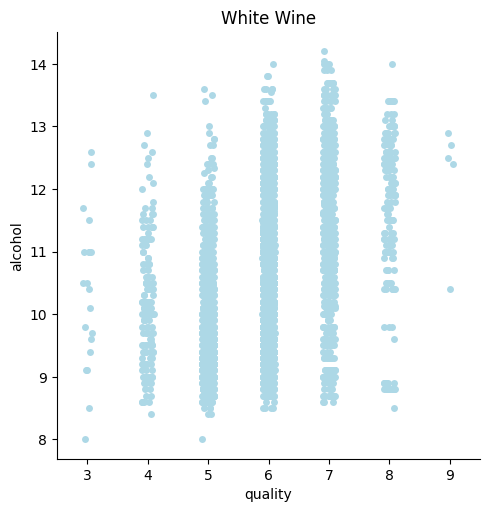

In [480]:
g = sns.catplot(data=df_white, x="quality", y="alcohol", color="lightblue").set(title = "White Wine")

Correlation Matrix: Because the data being roughly normally distributed, we can use Pearson correlation here:

/var/folders/p8/74p_0vf10dg9v09dqg69lwfc0000gn/T/ipykernel_16200/3632904128.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  g = sns.heatmap(df_white.corr(), vmin=-1, vmax=1, annot=True, cmap='PRGn').set(title = "White Wine")


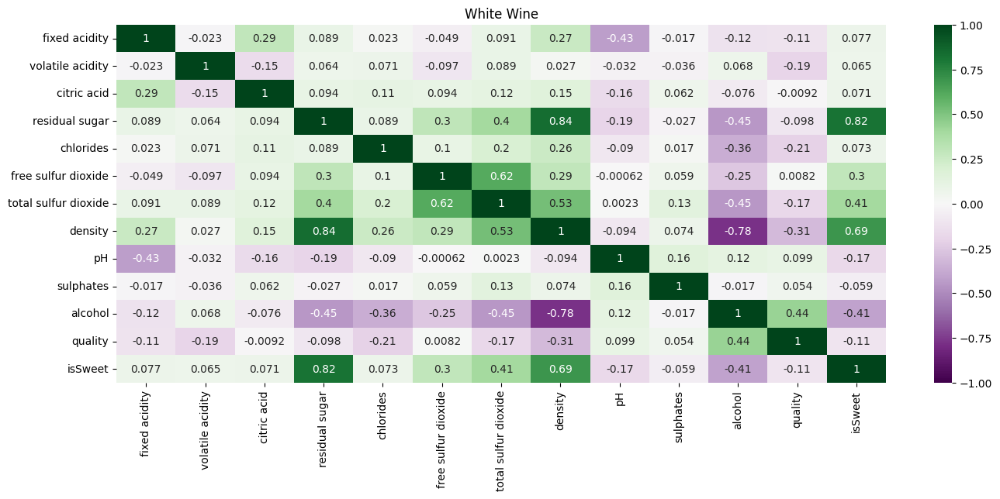

In [481]:
plt.figure(figsize=(16, 6))
g = sns.heatmap(df_white.corr(), vmin=-1, vmax=1, annot=True, cmap='PRGn').set(title = "White Wine")

It can be admitted that the Quality of wine is most strongly correlated with the Alcohol content and Density.

Now, we follow the same process for Red Wine:

Scatter Plots with Regression Lines:

First, with Fixed Acidity:

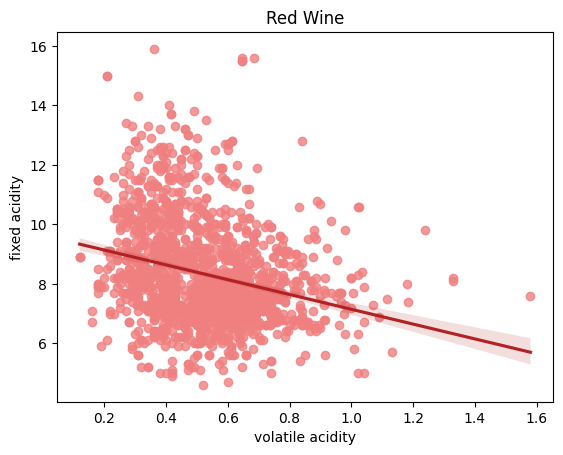

In [482]:
g = sns.regplot(data=df_red, x="volatile acidity", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

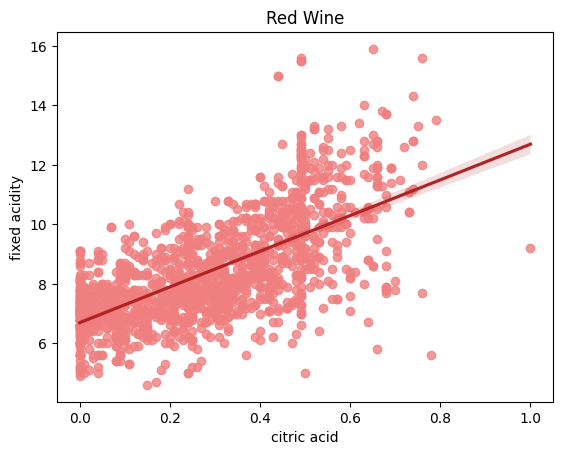

In [483]:
g = sns.regplot(data=df_red, x="citric acid", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

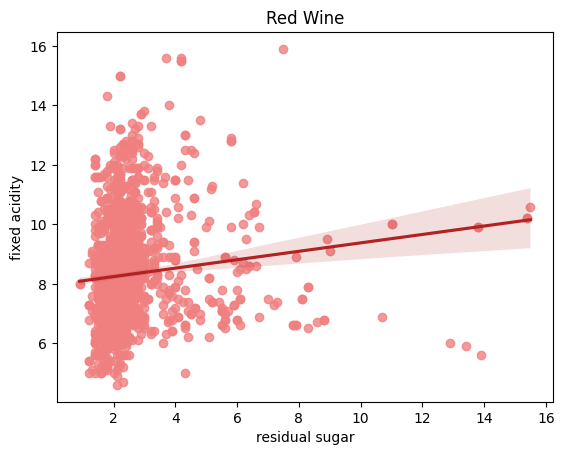

In [484]:
g = sns.regplot(data=df_red, x="residual sugar", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

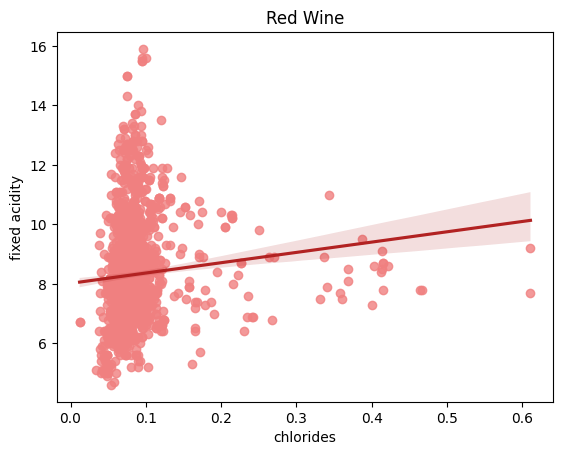

In [485]:
g = sns.regplot(data=df_red, x="chlorides", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

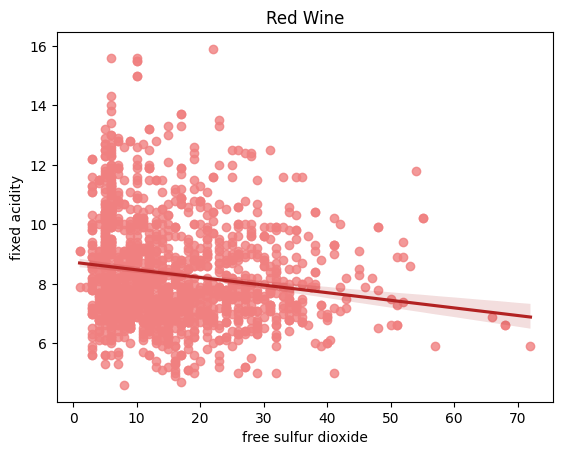

In [486]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

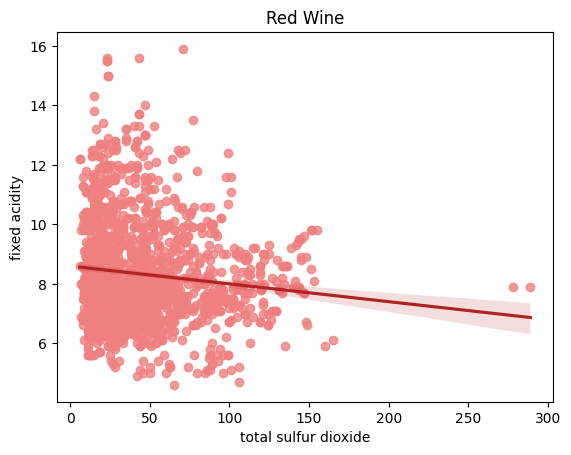

In [487]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

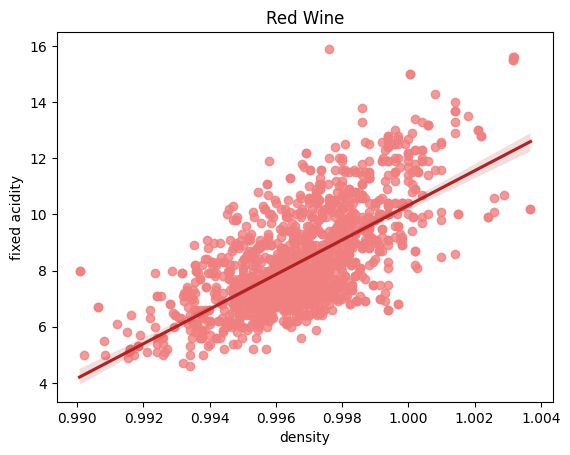

In [488]:
g = sns.regplot(data=df_red, x="density", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

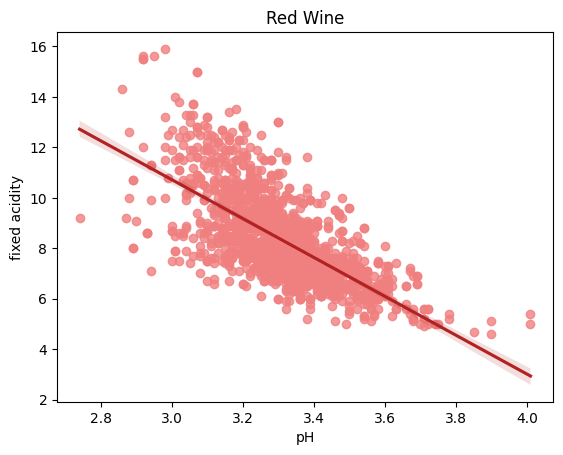

In [489]:
g = sns.regplot(data=df_red, x="pH", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

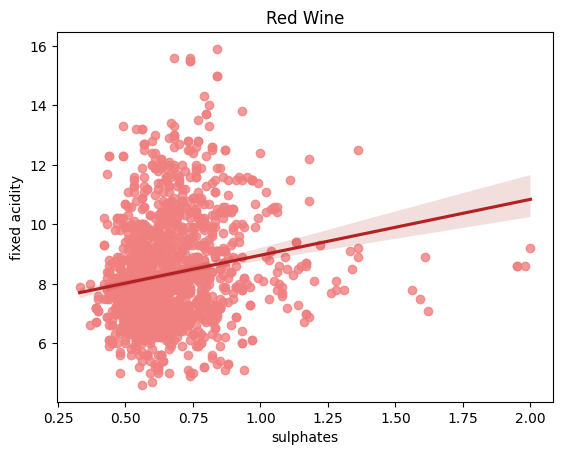

In [490]:
g = sns.regplot(data=df_red, x="sulphates", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

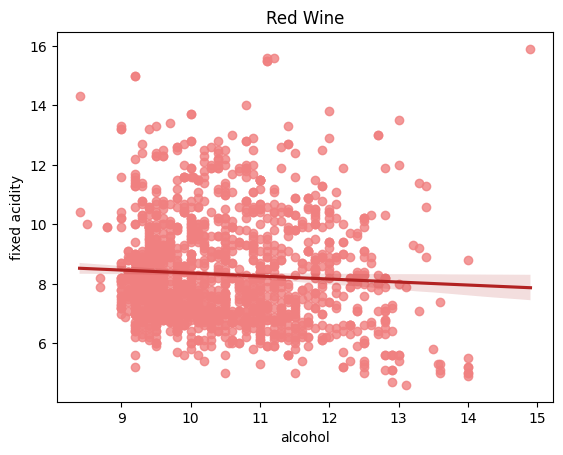

In [491]:
g = sns.regplot(data=df_red, x="alcohol", y="fixed acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now for Volatile Acidity:

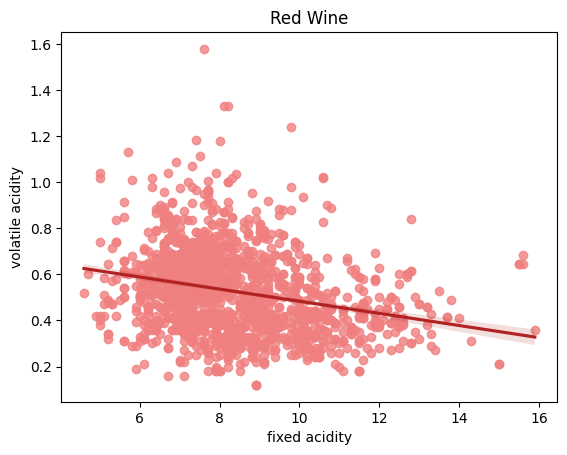

In [492]:
g = sns.regplot(data=df_red, x="fixed acidity", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

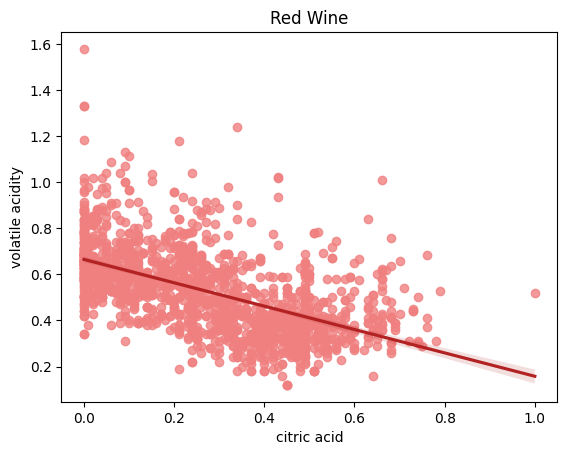

In [493]:
g = sns.regplot(data=df_red, x="citric acid", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

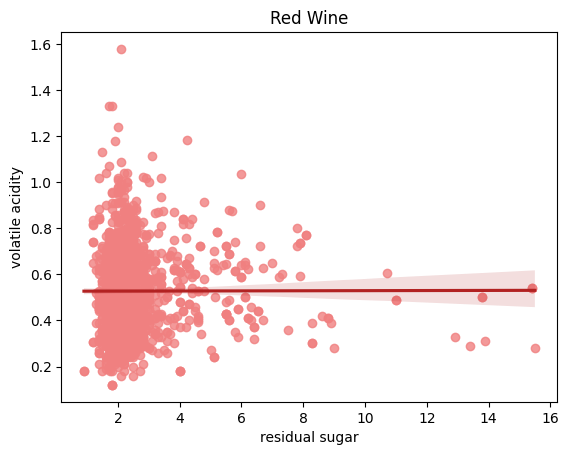

In [494]:
g = sns.regplot(data=df_red, x="residual sugar", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

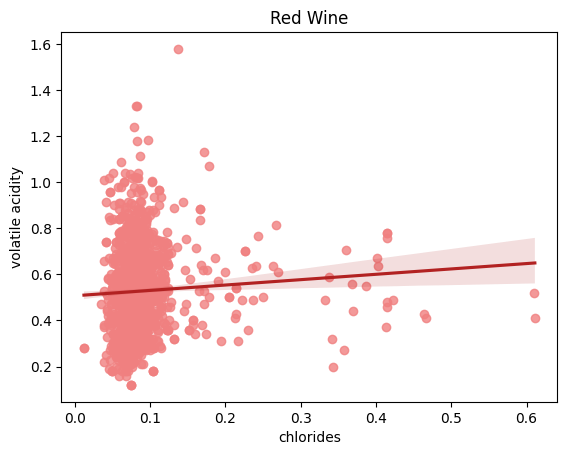

In [495]:
g = sns.regplot(data=df_red, x="chlorides", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

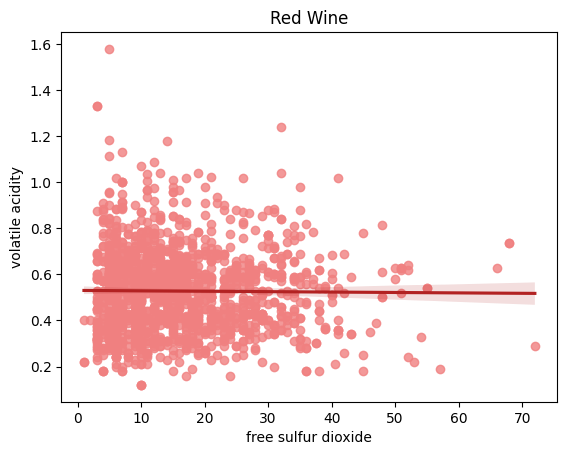

In [496]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

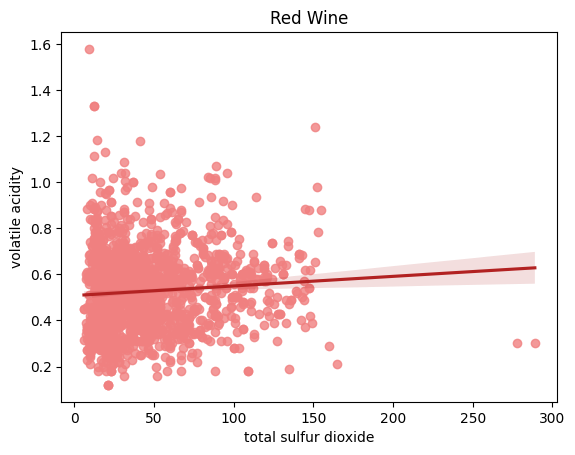

In [497]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

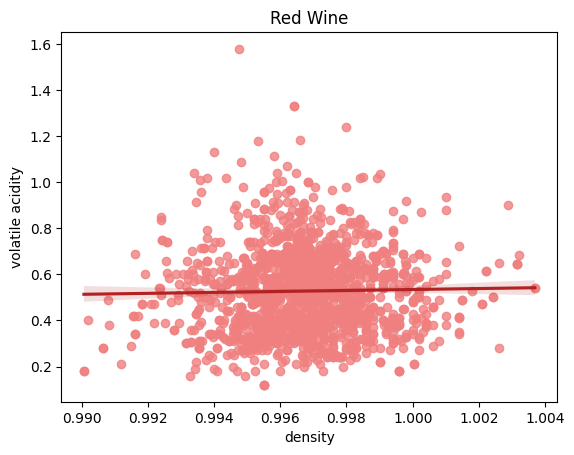

In [498]:
g = sns.regplot(data=df_red, x="density", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

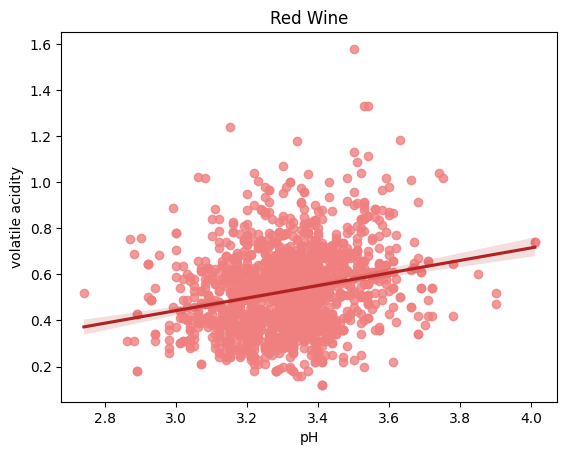

In [499]:
g = sns.regplot(data=df_red, x="pH", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

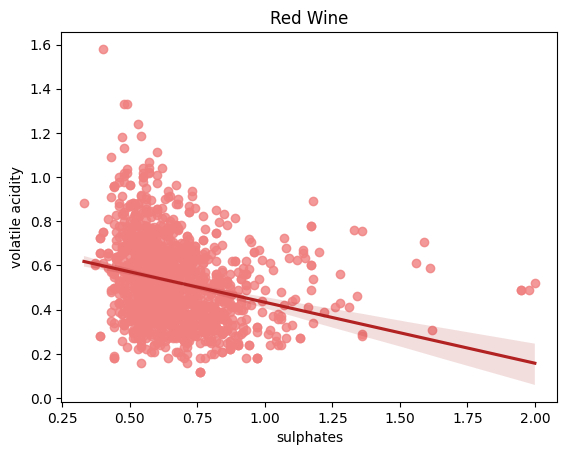

In [500]:
g = sns.regplot(data=df_red, x="sulphates", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

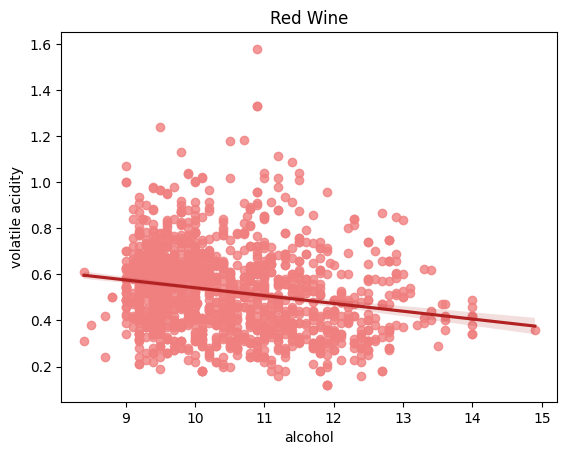

In [501]:
g = sns.regplot(data=df_red, x="alcohol", y="volatile acidity", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

For Citric Acid:

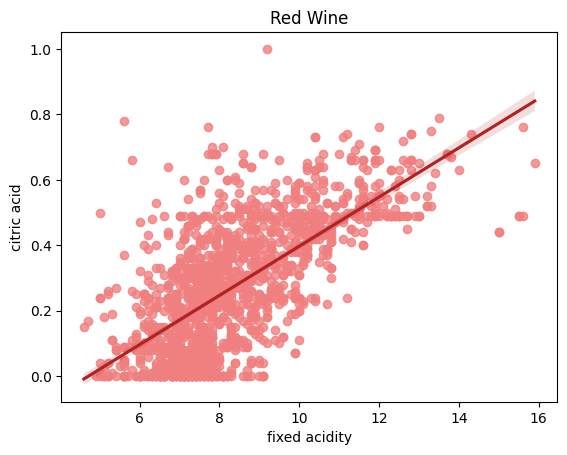

In [502]:
g = sns.regplot(data=df_red, x="fixed acidity", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

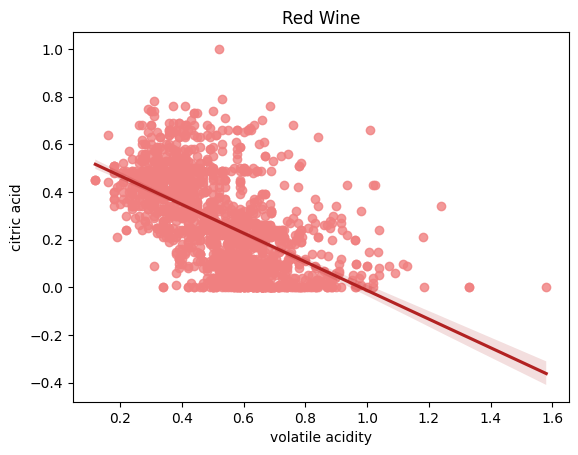

In [503]:
g = sns.regplot(data=df_red, x="volatile acidity", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

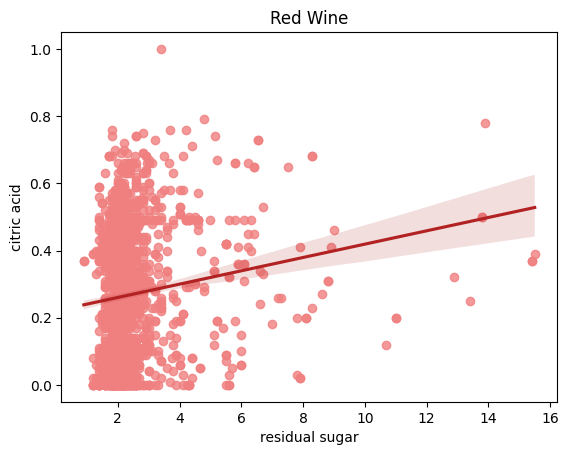

In [504]:
g = sns.regplot(data=df_red, x="residual sugar", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

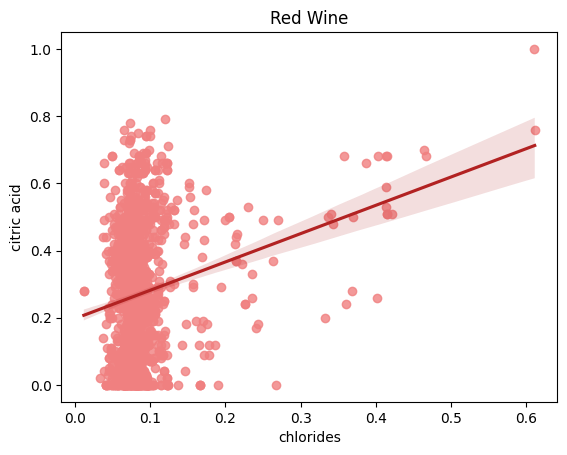

In [505]:
g = sns.regplot(data=df_red, x="chlorides", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

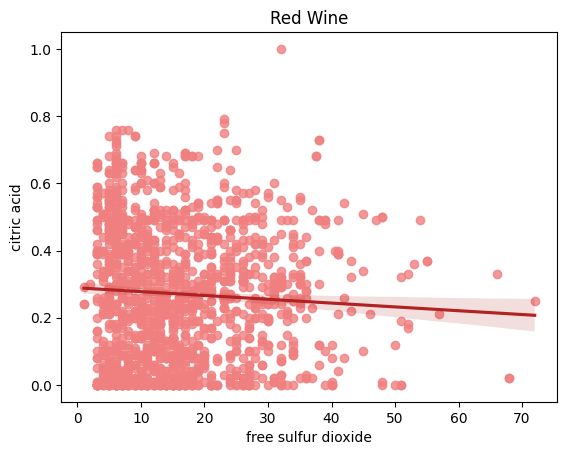

In [506]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

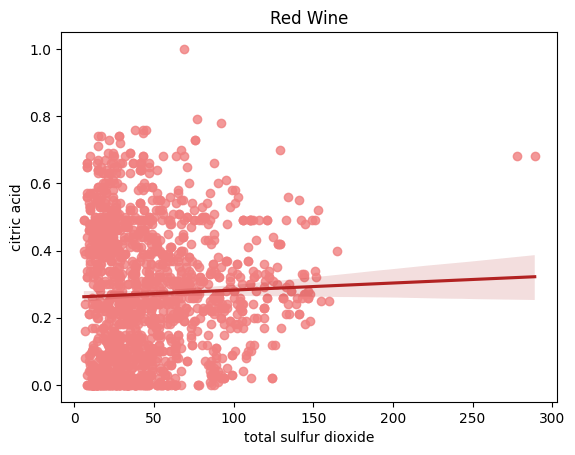

In [507]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

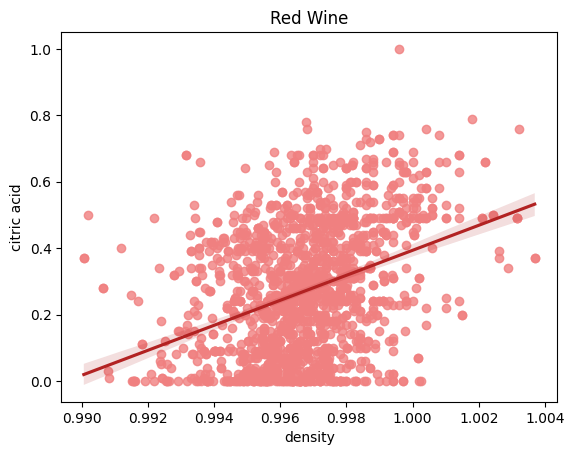

In [508]:
g = sns.regplot(data=df_red, x="density", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

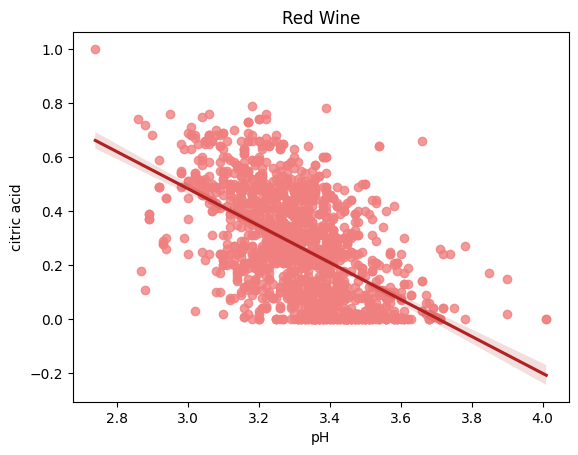

In [509]:
g = sns.regplot(data=df_red, x="pH", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

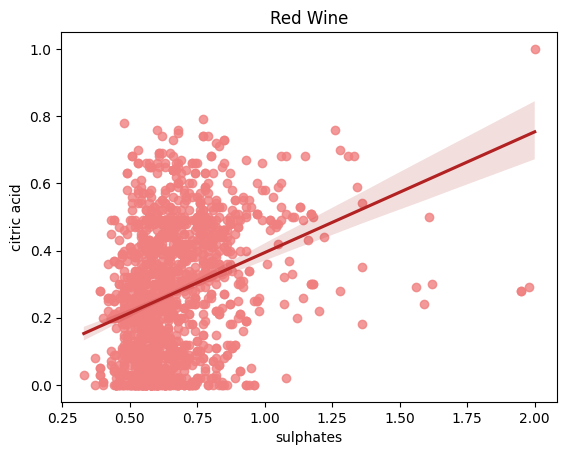

In [510]:
g = sns.regplot(data=df_red, x="sulphates", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

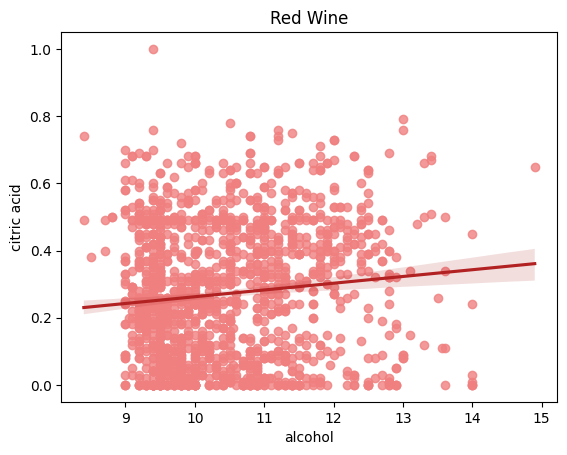

In [511]:
g = sns.regplot(data=df_red, x="alcohol", y="citric acid", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Residual Sugar:

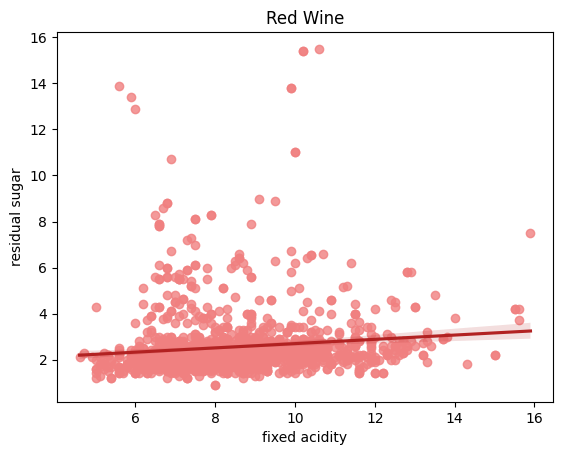

In [512]:
g = sns.regplot(data=df_red, x="fixed acidity", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

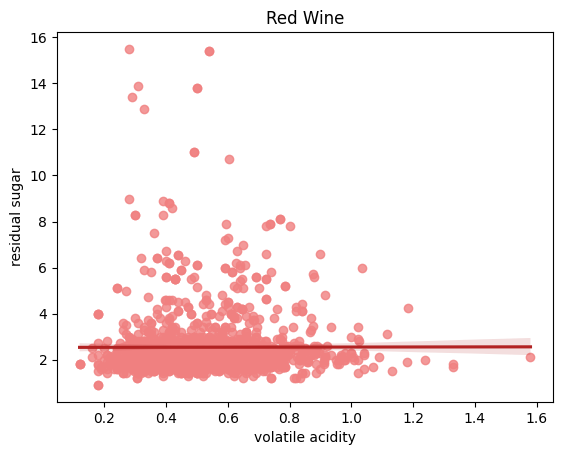

In [513]:
g = sns.regplot(data=df_red, x="volatile acidity", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

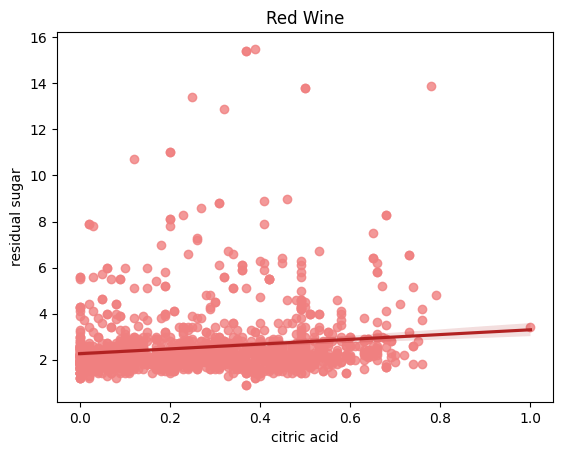

In [514]:
g = sns.regplot(data=df_red, x="citric acid", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

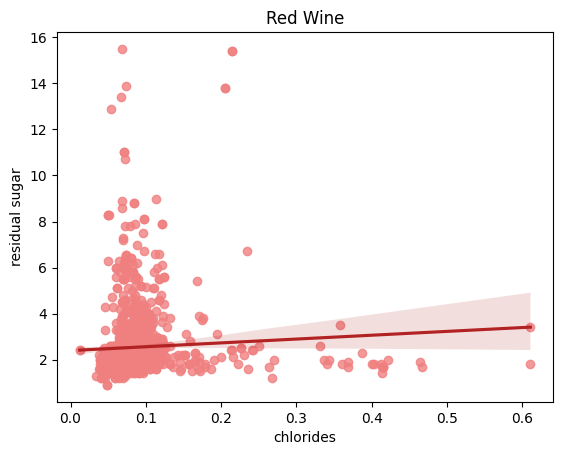

In [515]:
g = sns.regplot(data=df_red, x="chlorides", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

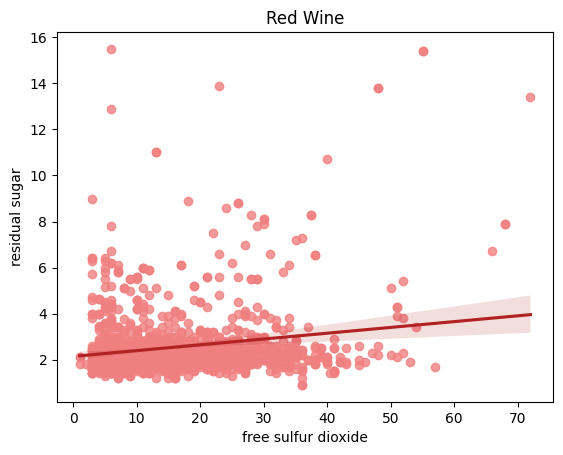

In [516]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

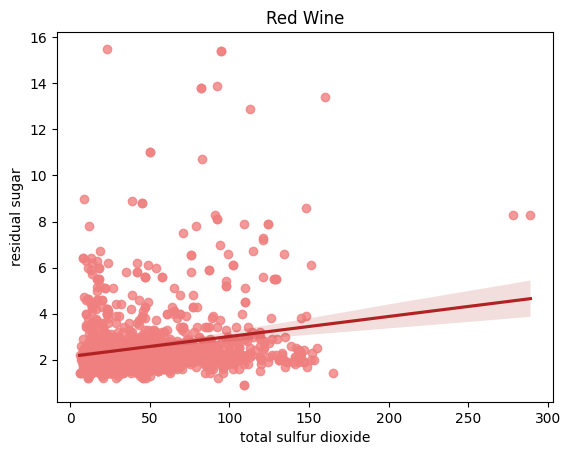

In [517]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

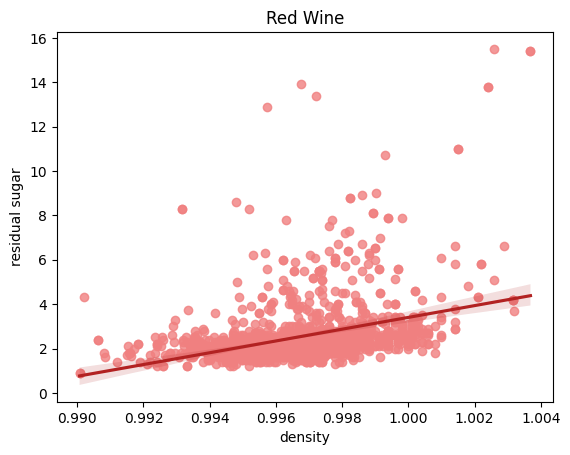

In [518]:
g = sns.regplot(data=df_red, x="density", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

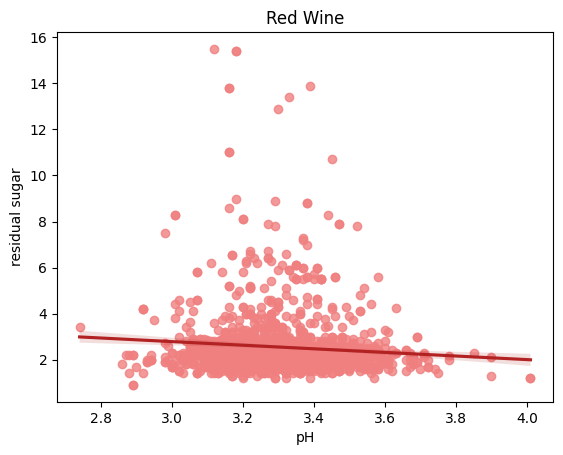

In [519]:
g = sns.regplot(data=df_red, x="pH", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

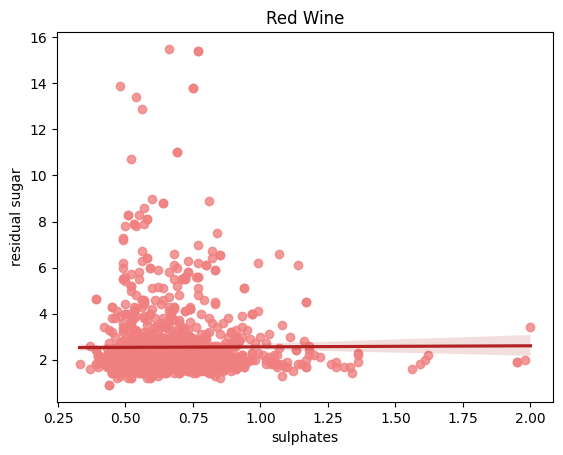

In [520]:
g = sns.regplot(data=df_red, x="sulphates", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

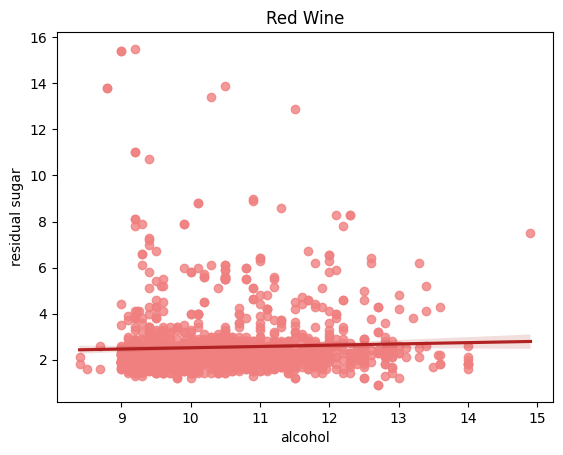

In [521]:
g = sns.regplot(data=df_red, x="alcohol", y="residual sugar", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Chlorides:

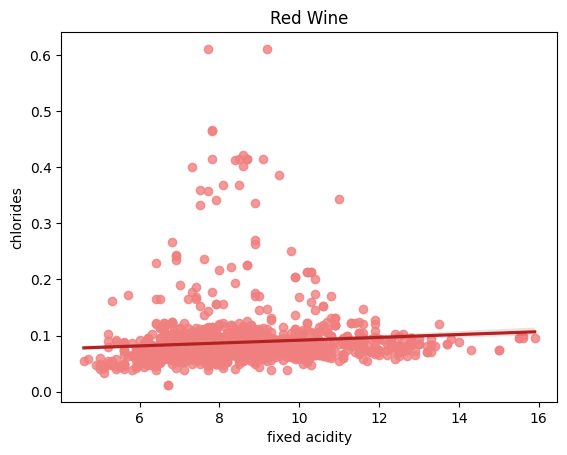

In [522]:
g = sns.regplot(data=df_red, x="fixed acidity", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

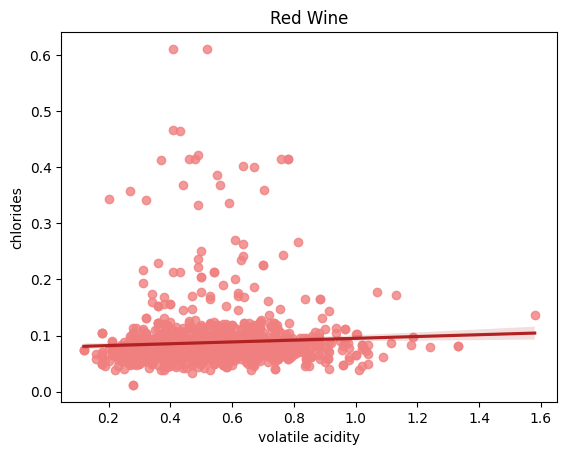

In [523]:
g = sns.regplot(data=df_red, x="volatile acidity", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

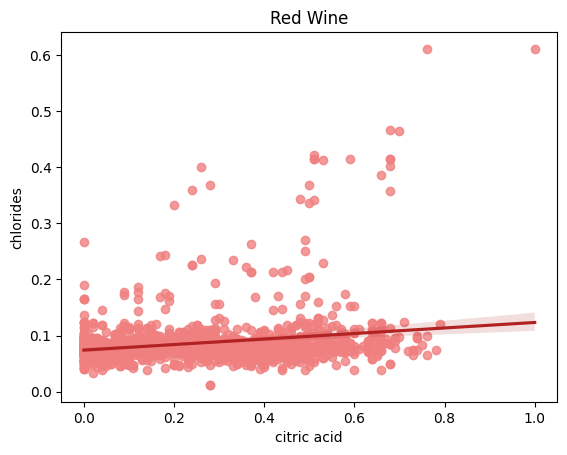

In [524]:
g = sns.regplot(data=df_red, x="citric acid", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

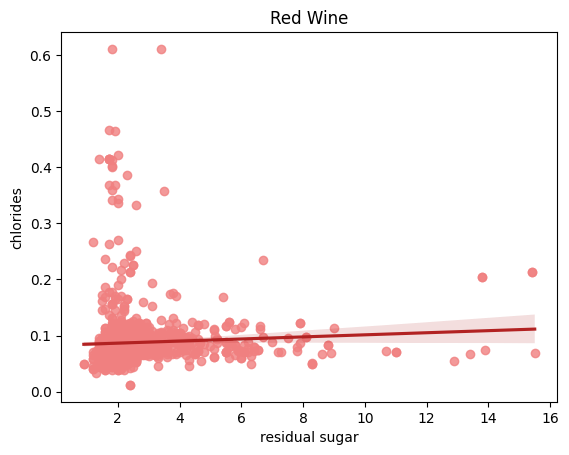

In [525]:
g = sns.regplot(data=df_red, x="residual sugar", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

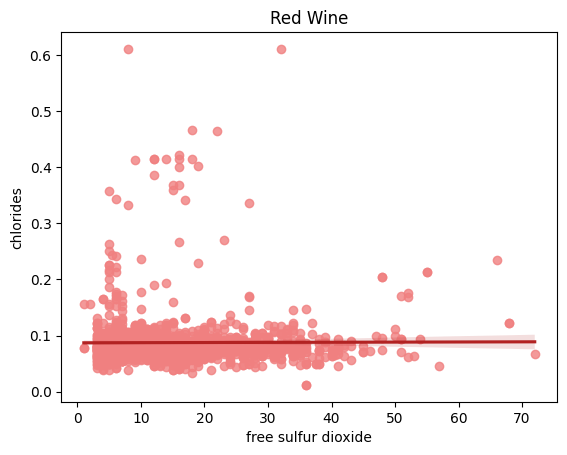

In [526]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

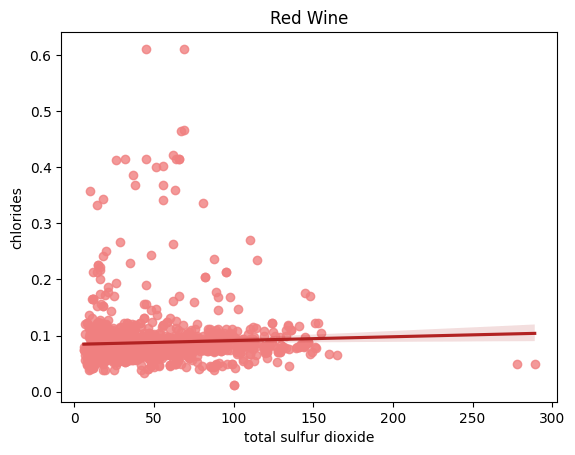

In [527]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

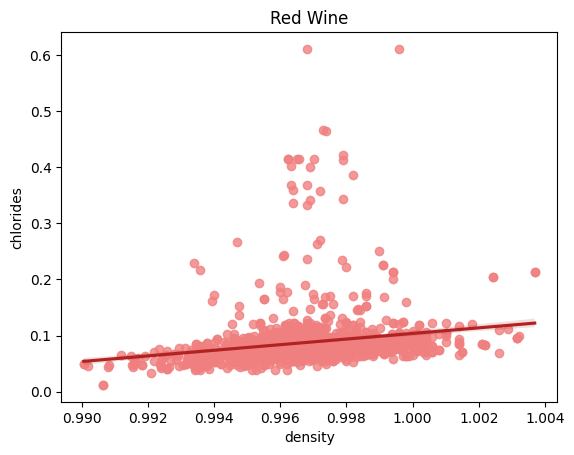

In [528]:
g = sns.regplot(data=df_red, x="density", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

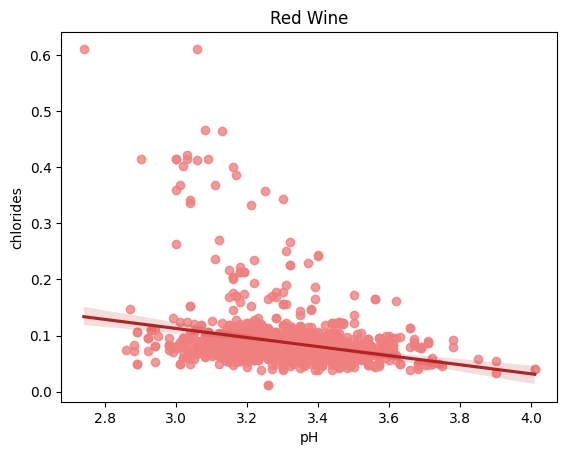

In [529]:
g = sns.regplot(data=df_red, x="pH", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

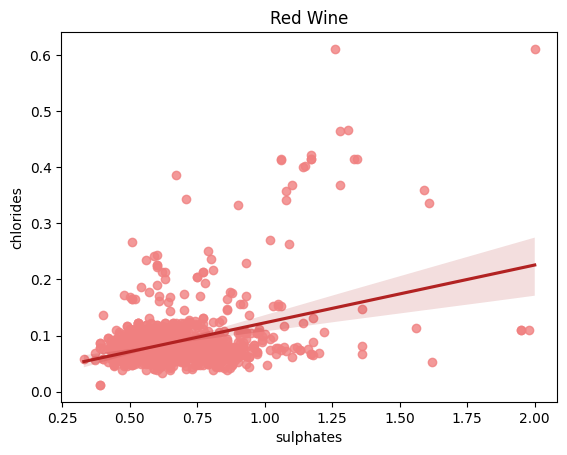

In [530]:
g = sns.regplot(data=df_red, x="sulphates", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

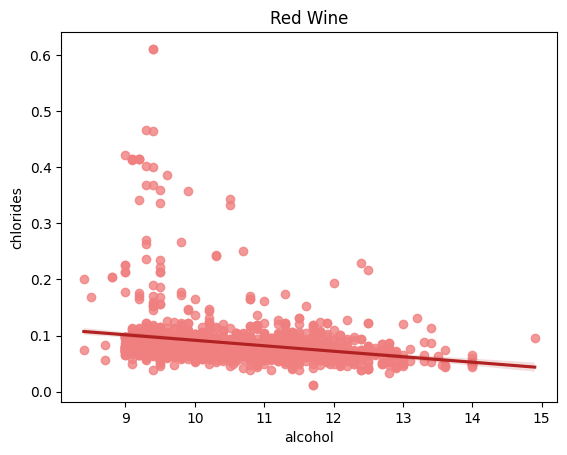

In [531]:
g = sns.regplot(data=df_red, x="alcohol", y="chlorides", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Free Sulfur Dioxide:

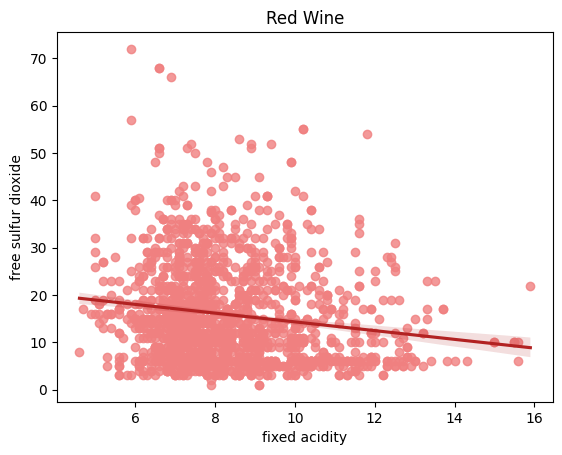

In [532]:
g = sns.regplot(data=df_red, x="fixed acidity", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

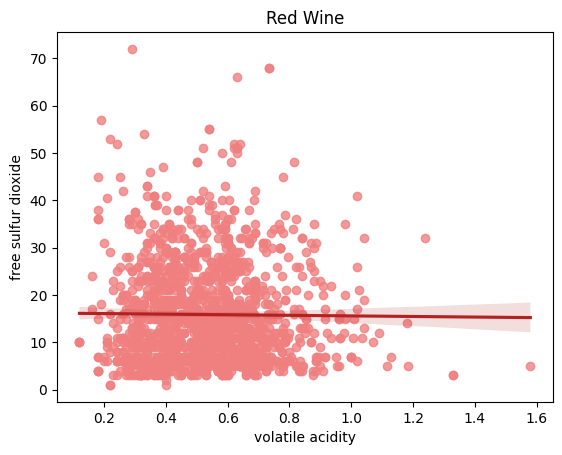

In [533]:
g = sns.regplot(data=df_red, x="volatile acidity", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

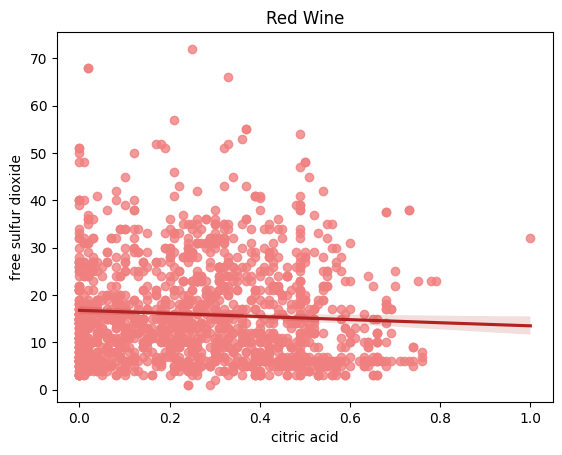

In [534]:
g = sns.regplot(data=df_red, x="citric acid", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

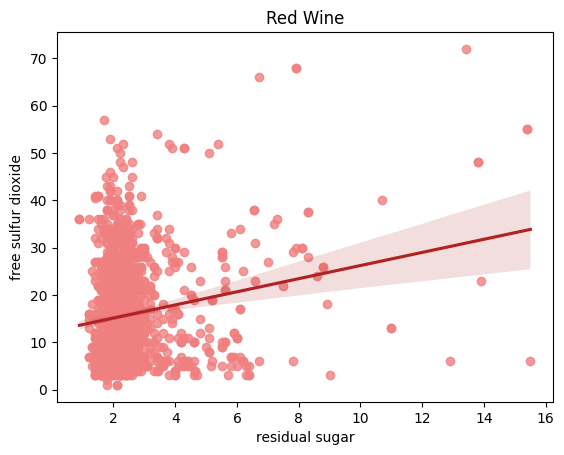

In [535]:
g = sns.regplot(data=df_red, x="residual sugar", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

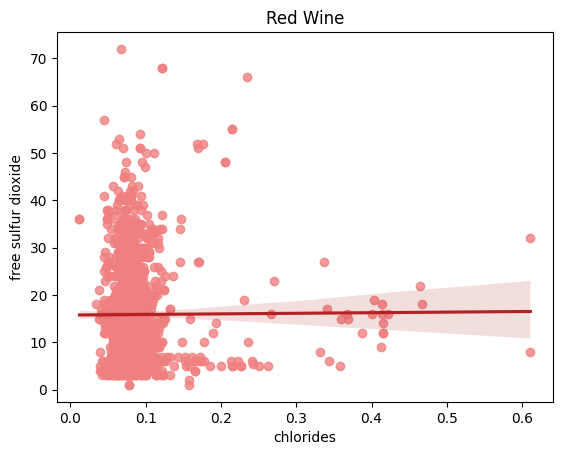

In [536]:
g = sns.regplot(data=df_red, x="chlorides", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

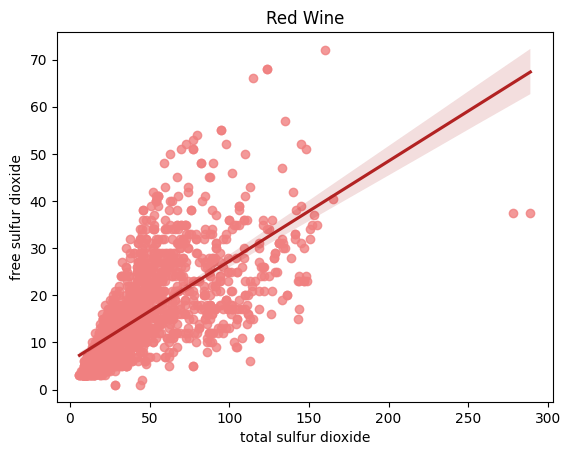

In [537]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

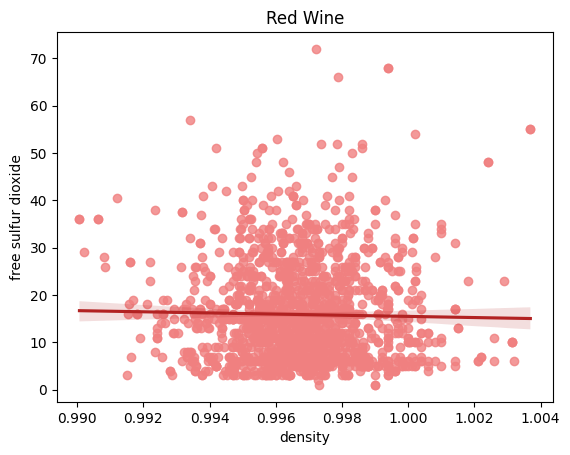

In [538]:
g = sns.regplot(data=df_red, x="density", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

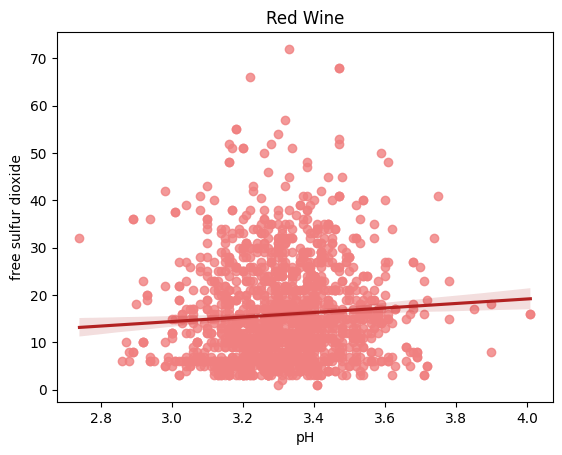

In [539]:
g = sns.regplot(data=df_red, x="pH", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

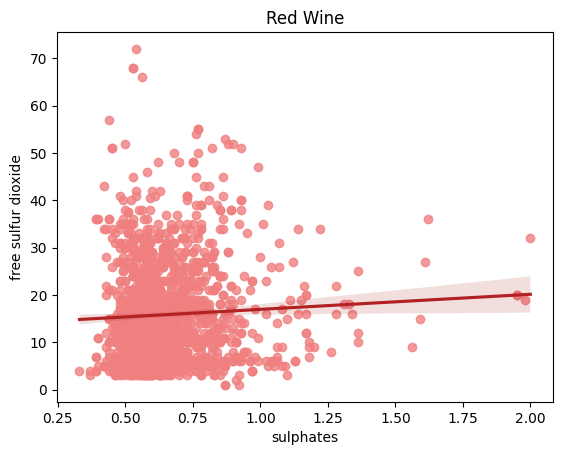

In [540]:
g = sns.regplot(data=df_red, x="sulphates", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

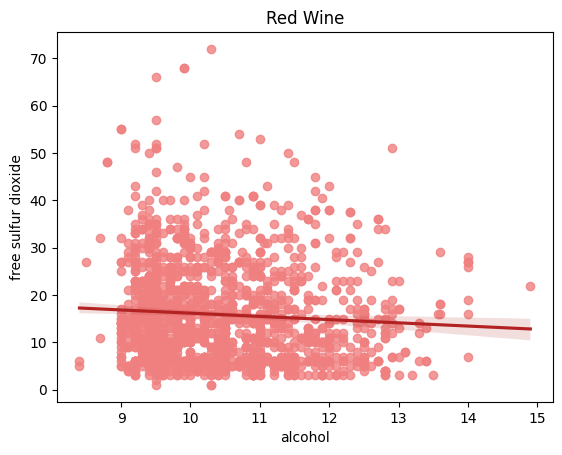

In [541]:
g = sns.regplot(data=df_red, x="alcohol", y="free sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Total Sulfur Dioxide:

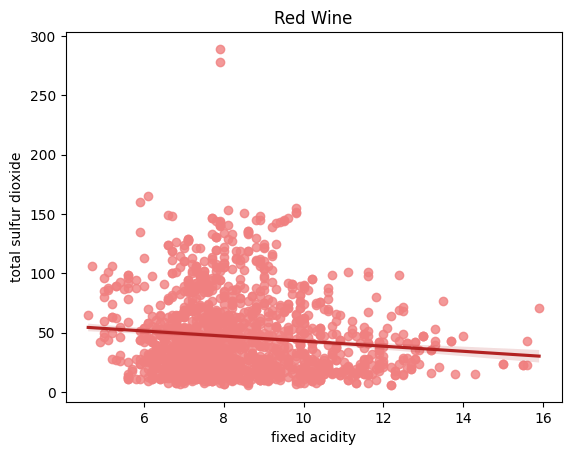

In [542]:
g = sns.regplot(data=df_red, x="fixed acidity", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

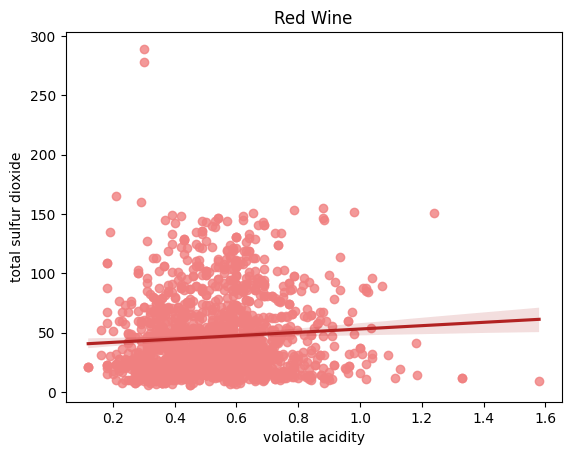

In [543]:
g = sns.regplot(data=df_red, x="volatile acidity", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

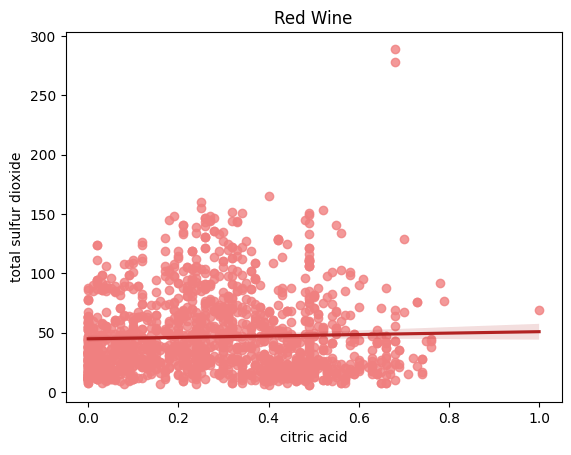

In [544]:
g = sns.regplot(data=df_red, x="citric acid", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

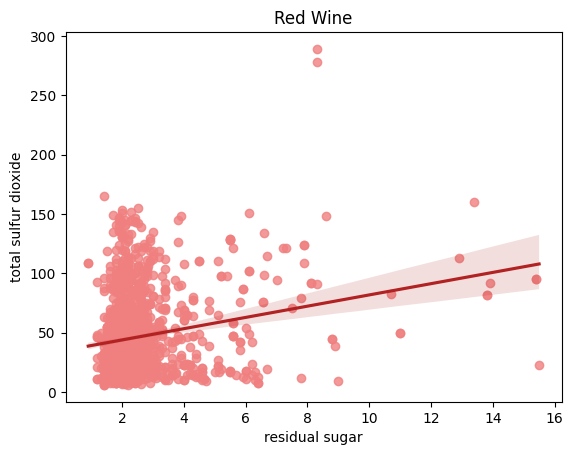

In [545]:
g = sns.regplot(data=df_red, x="residual sugar", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

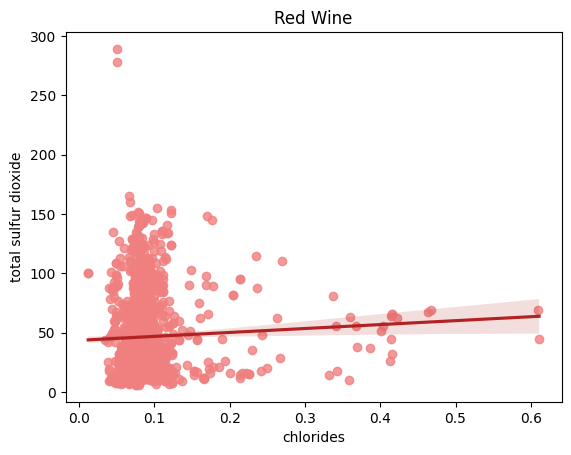

In [546]:
g = sns.regplot(data=df_red, x="chlorides", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

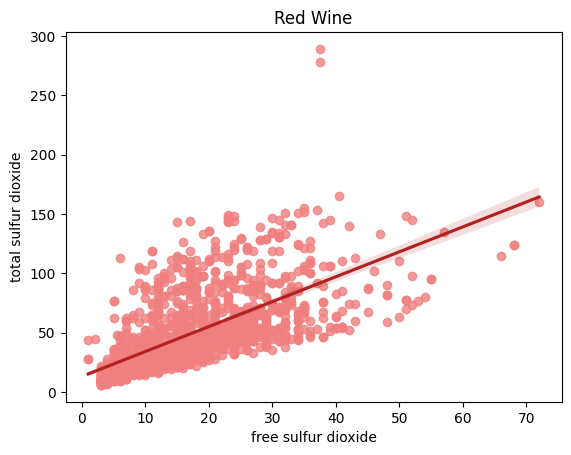

In [547]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

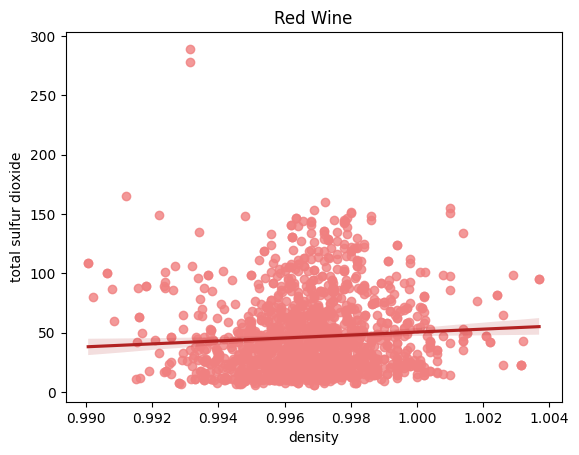

In [548]:
g = sns.regplot(data=df_red, x="density", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

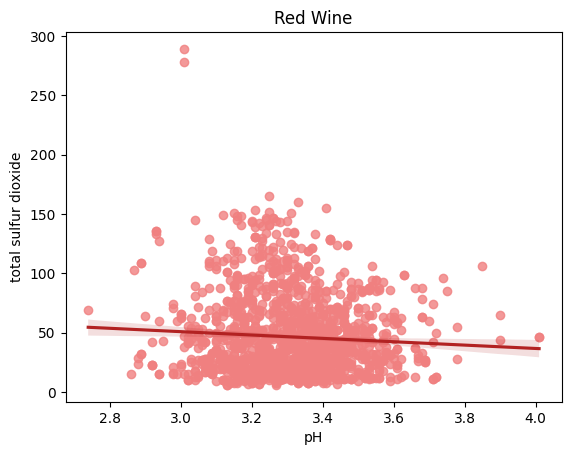

In [549]:
g = sns.regplot(data=df_red, x="pH", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

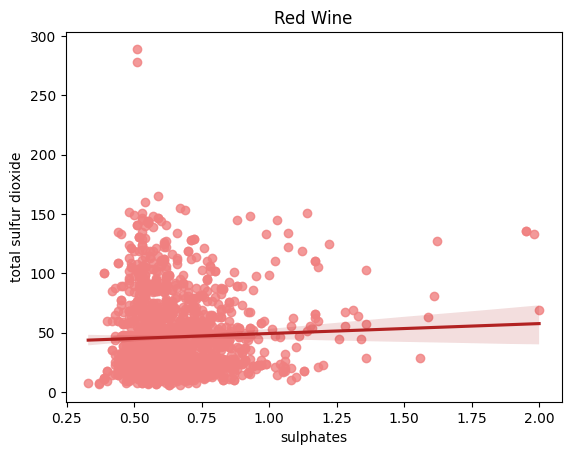

In [550]:
g = sns.regplot(data=df_red, x="sulphates", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

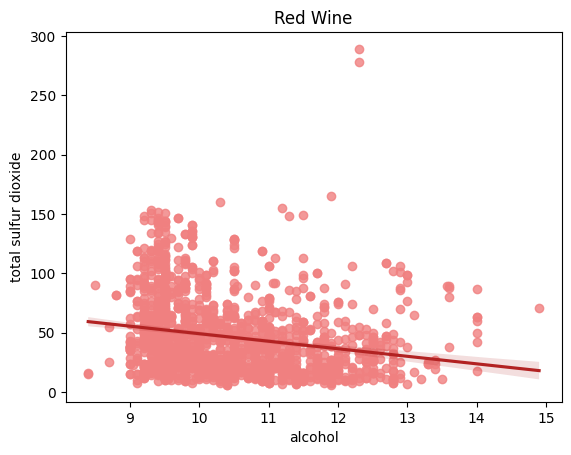

In [551]:
g = sns.regplot(data=df_red, x="alcohol", y="total sulfur dioxide", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Density:

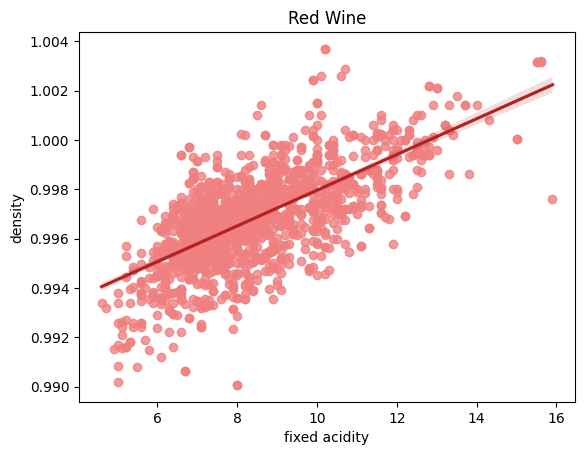

In [552]:
g = sns.regplot(data=df_red, x="fixed acidity", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

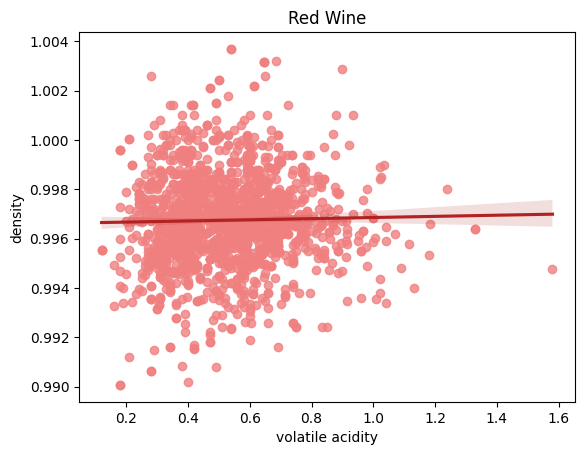

In [553]:
g = sns.regplot(data=df_red, x="volatile acidity", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

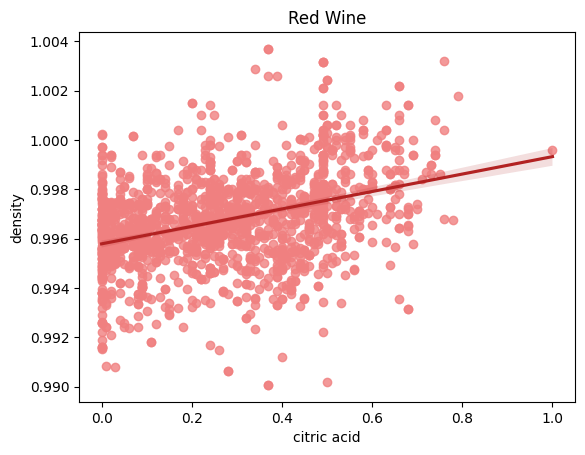

In [554]:
g = sns.regplot(data=df_red, x="citric acid", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

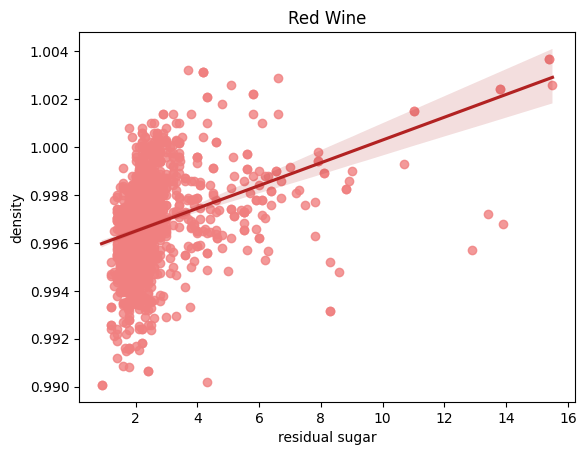

In [555]:
g = sns.regplot(data=df_red, x="residual sugar", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

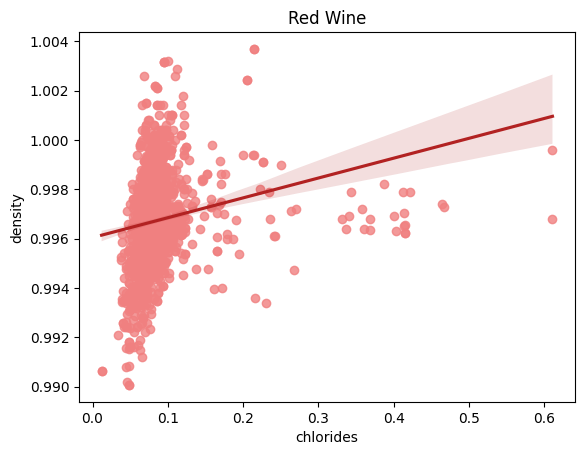

In [556]:
g = sns.regplot(data=df_red, x="chlorides", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

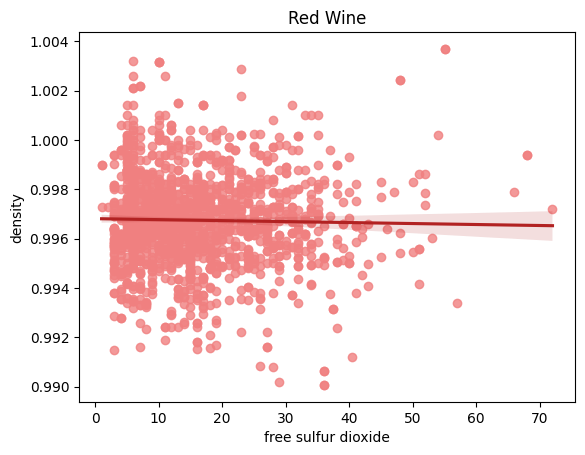

In [557]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

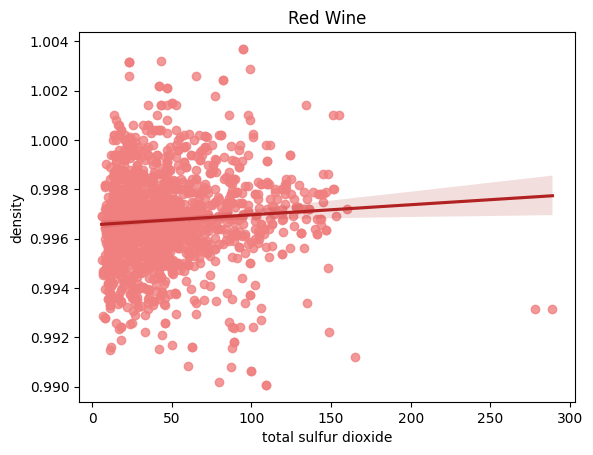

In [558]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

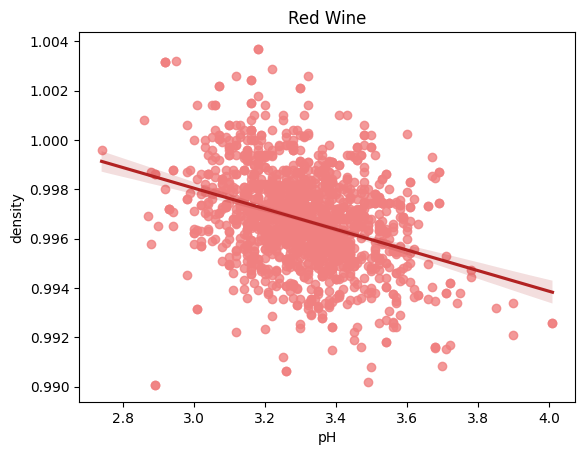

In [559]:
g = sns.regplot(data=df_red, x="pH", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

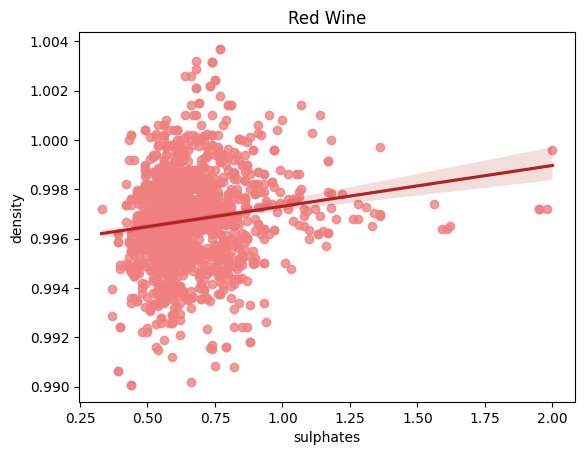

In [560]:
g = sns.regplot(data=df_red, x="sulphates", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

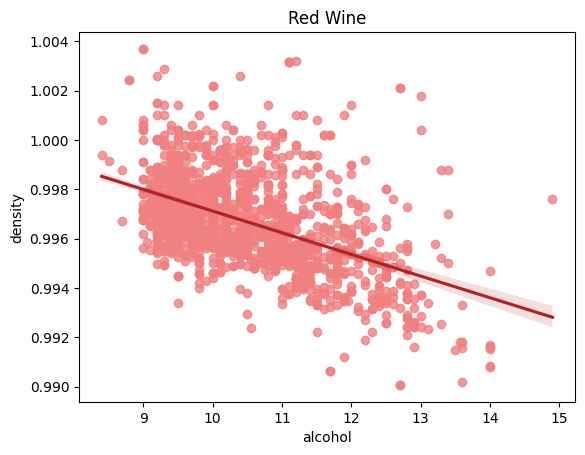

In [561]:
g = sns.regplot(data=df_red, x="alcohol", y="density", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for pH:

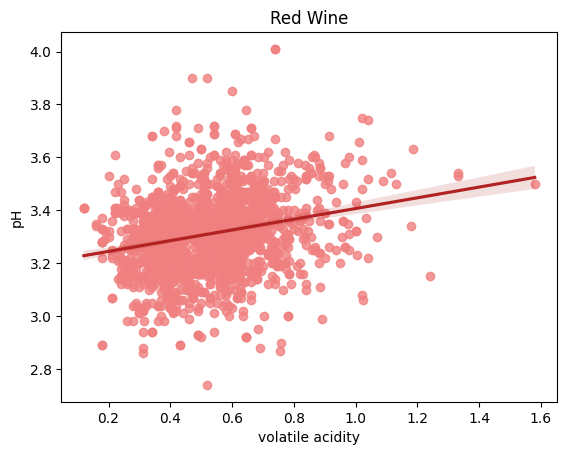

In [562]:
g = sns.regplot(data=df_red, x="volatile acidity", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

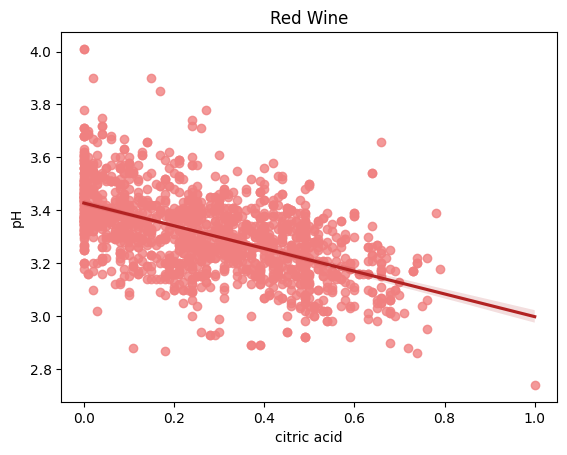

In [563]:
g = sns.regplot(data=df_red, x="citric acid", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

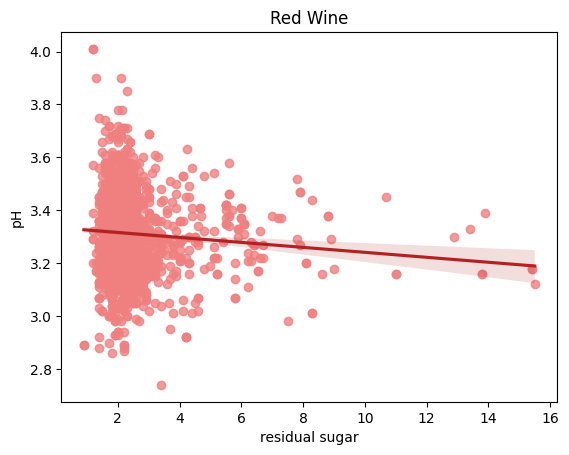

In [564]:
g = sns.regplot(data=df_red, x="residual sugar", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

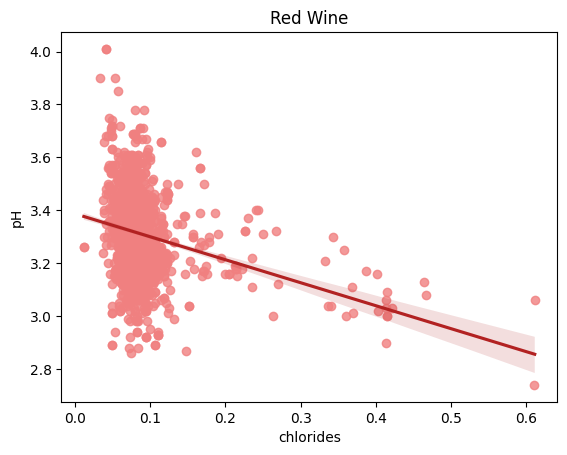

In [565]:
g = sns.regplot(data=df_red, x="chlorides", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

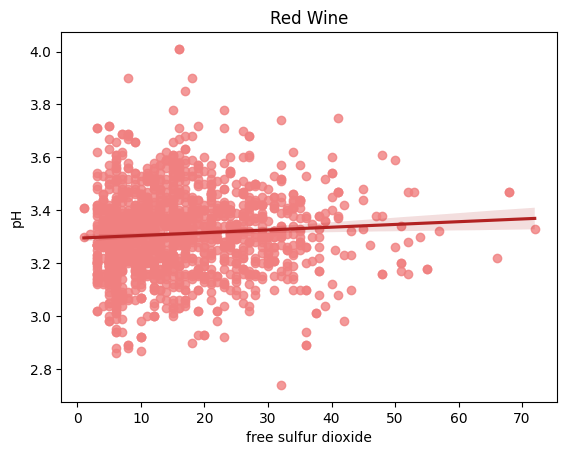

In [566]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

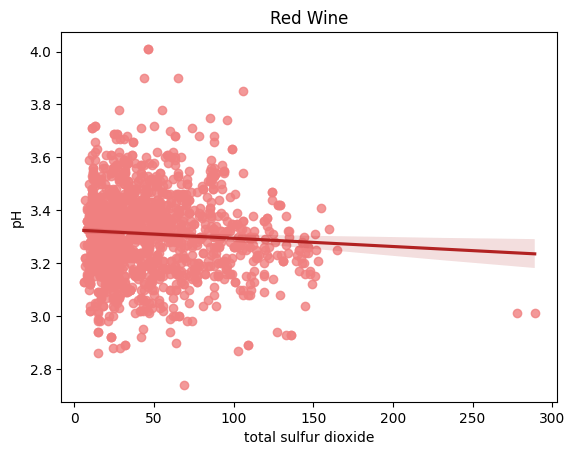

In [567]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

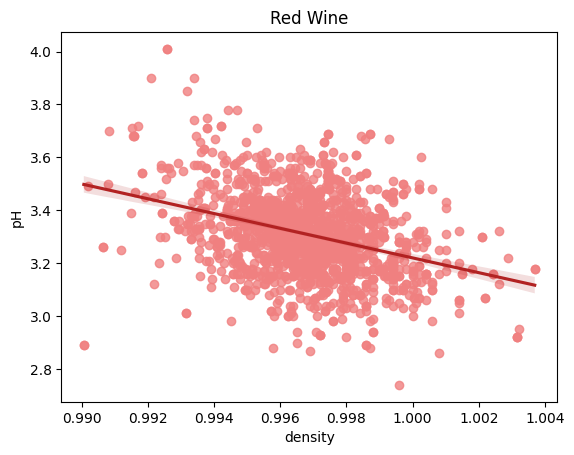

In [568]:
g = sns.regplot(data=df_red, x="density", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

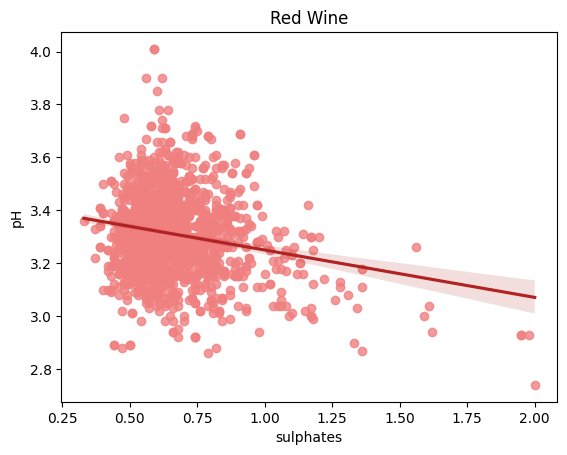

In [569]:
g = sns.regplot(data=df_red, x="sulphates", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

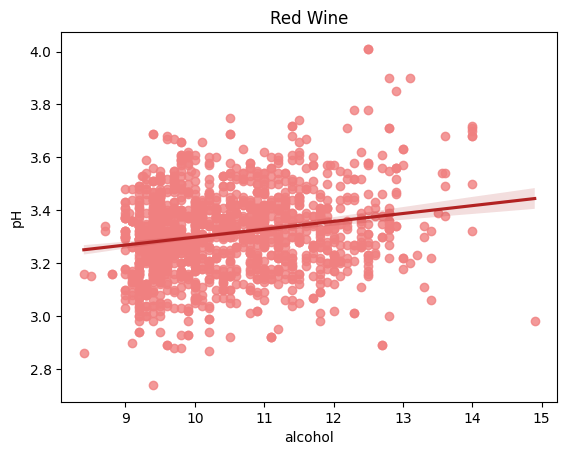

In [570]:
g = sns.regplot(data=df_red, x="alcohol", y="pH", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Sulphates:

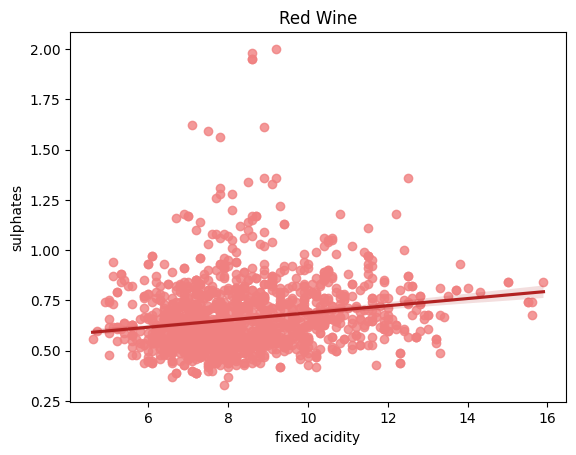

In [571]:
g = sns.regplot(data=df_red, x="fixed acidity", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

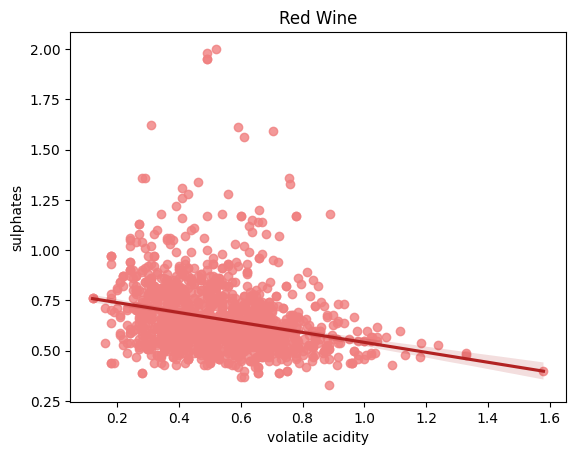

In [572]:
g = sns.regplot(data=df_red, x="volatile acidity", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

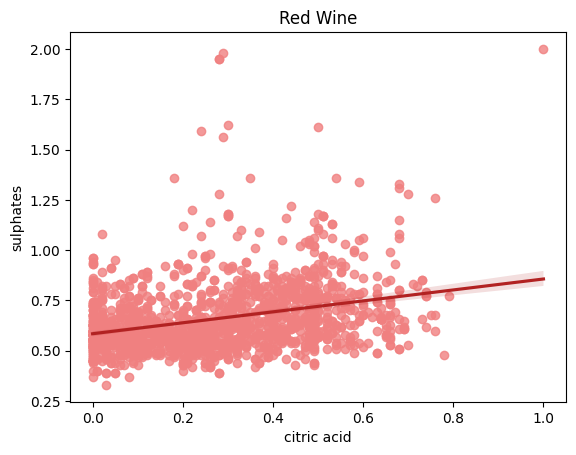

In [573]:
g = sns.regplot(data=df_red, x="citric acid", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

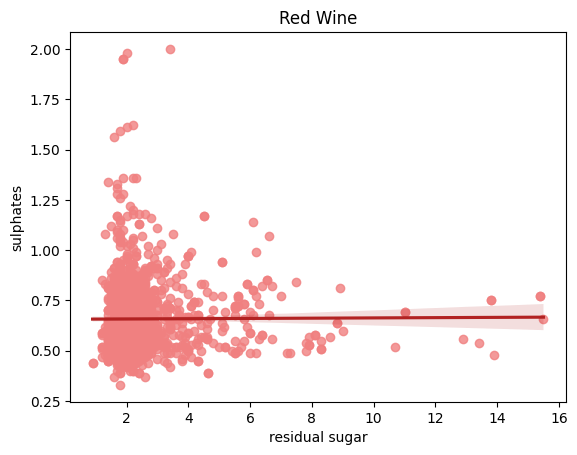

In [574]:
g = sns.regplot(data=df_red, x="residual sugar", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

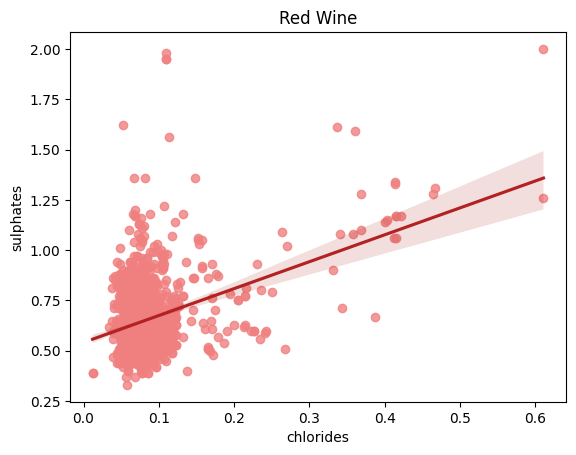

In [575]:
g = sns.regplot(data=df_red, x="chlorides", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

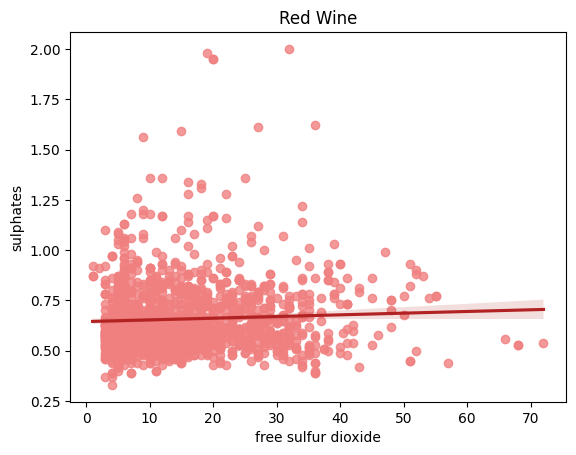

In [576]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

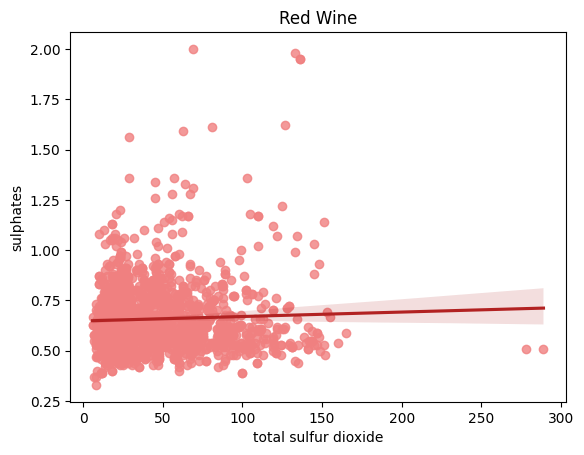

In [577]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

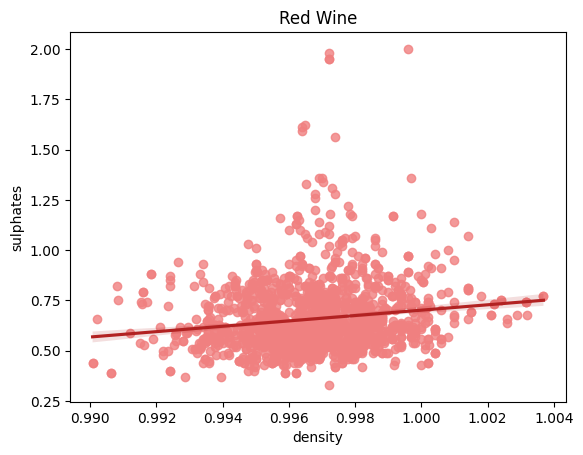

In [578]:
g = sns.regplot(data=df_red, x="density", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

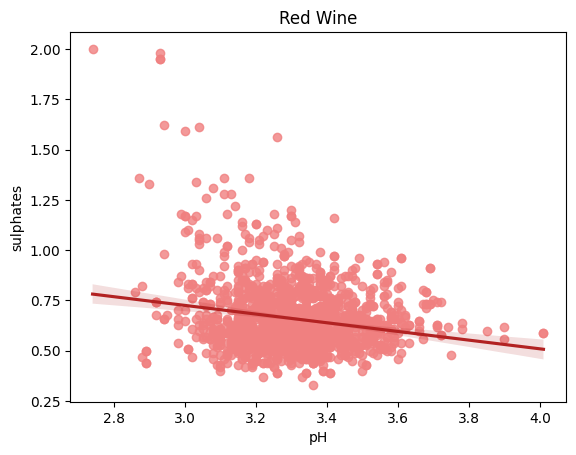

In [579]:
g = sns.regplot(data=df_red, x="pH", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

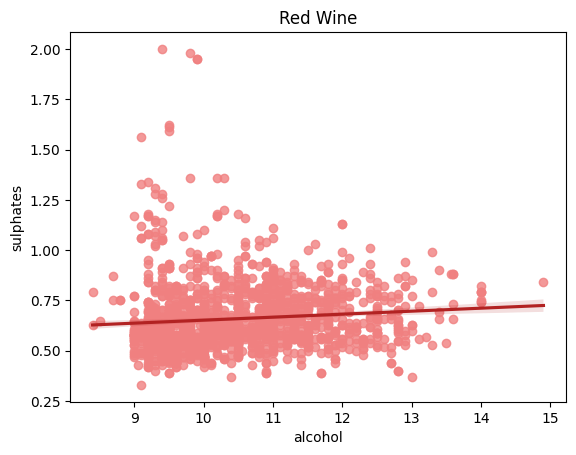

In [580]:
g = sns.regplot(data=df_red, x="alcohol", y="sulphates", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Now, for Alcohol:

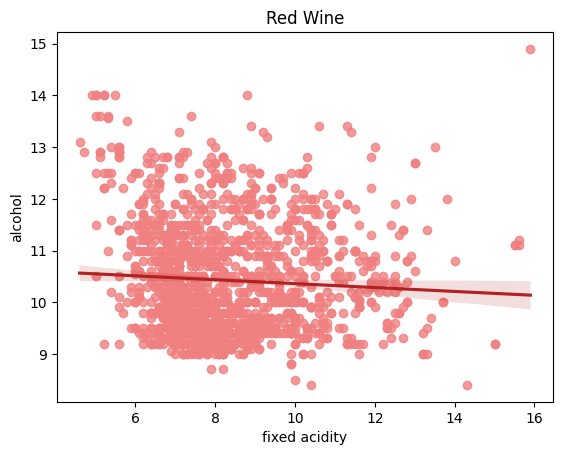

In [581]:
g = sns.regplot(data=df_red, x="fixed acidity", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

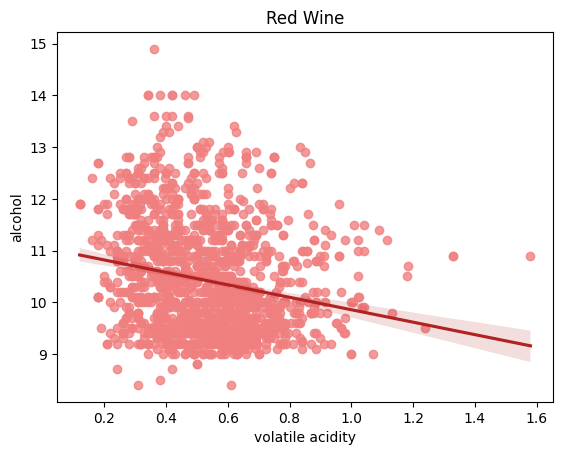

In [582]:
g = sns.regplot(data=df_red, x="volatile acidity", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

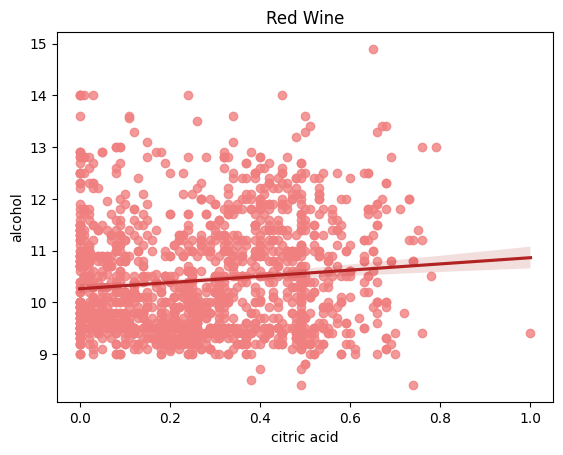

In [583]:
g = sns.regplot(data=df_red, x="citric acid", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

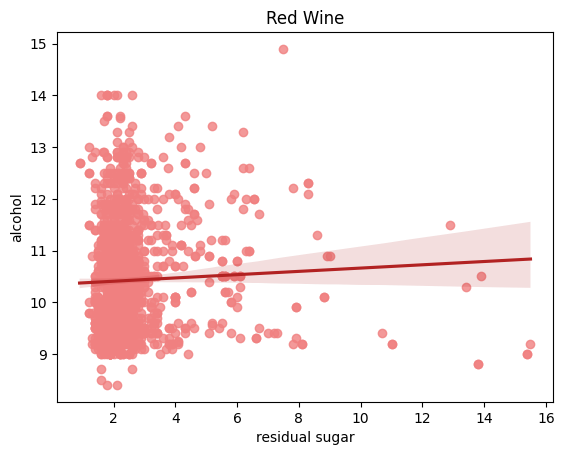

In [584]:
g = sns.regplot(data=df_red, x="residual sugar", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

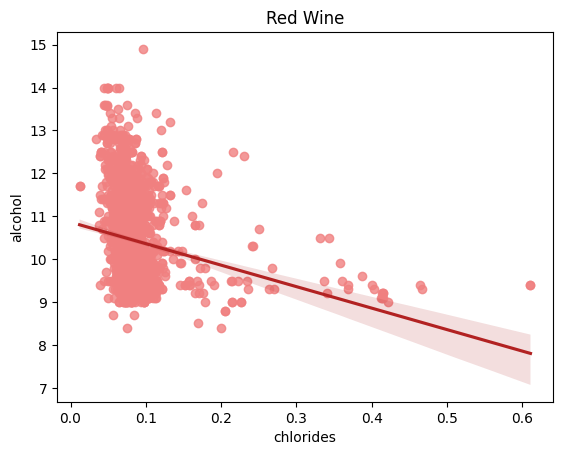

In [585]:
g = sns.regplot(data=df_red, x="chlorides", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

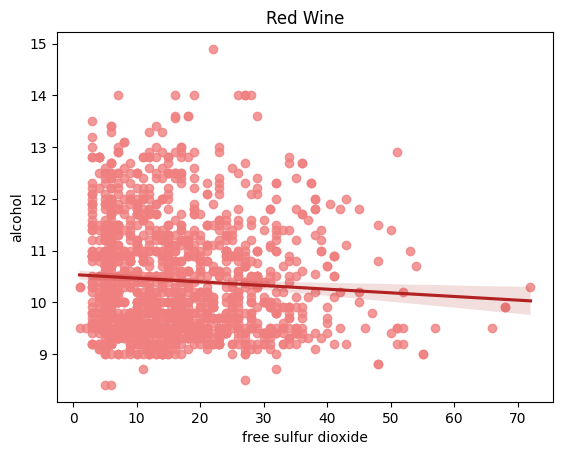

In [586]:
g = sns.regplot(data=df_red, x="free sulfur dioxide", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

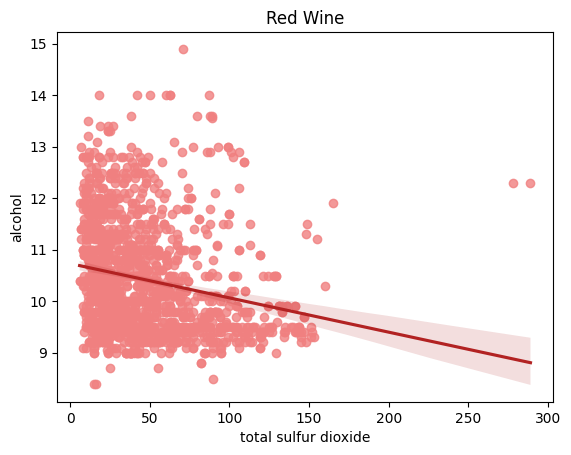

In [587]:
g = sns.regplot(data=df_red, x="total sulfur dioxide", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

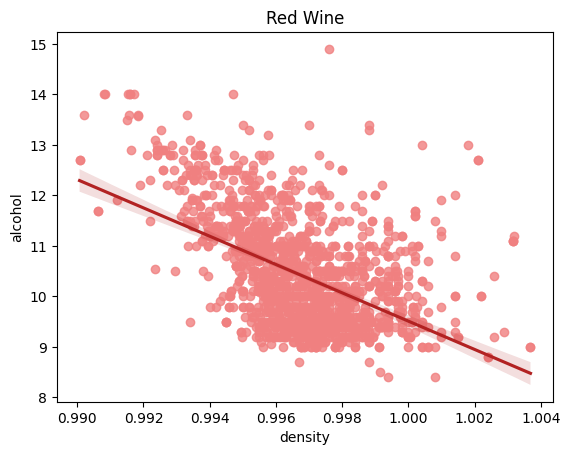

In [588]:
g = sns.regplot(data=df_red, x="density", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

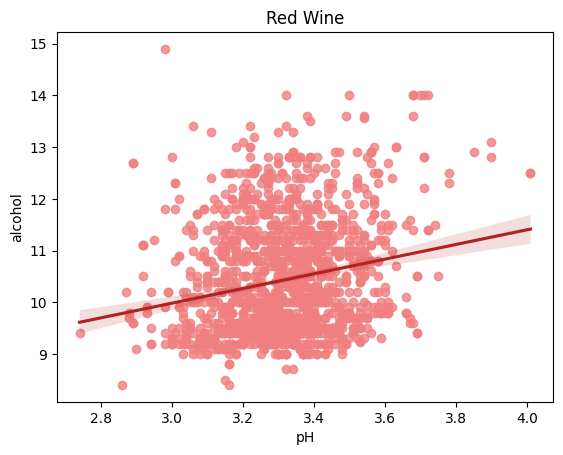

In [589]:
g = sns.regplot(data=df_red, x="pH", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

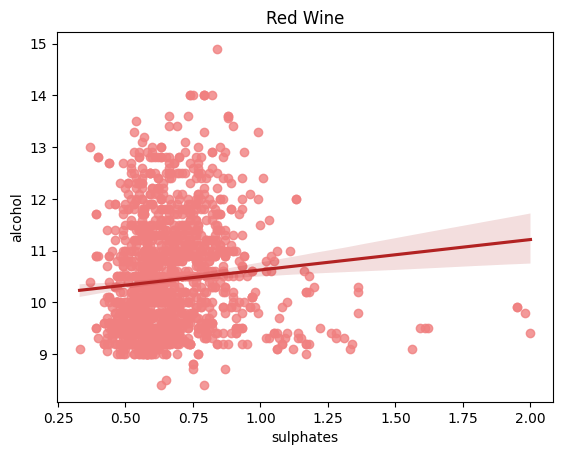

In [590]:
g = sns.regplot(data=df_red, x="sulphates", y="alcohol", scatter_kws={"color":"lightcoral"}, line_kws={"color":"firebrick"}).set(title = "Red Wine")

Below are Scattered plots for Quality categorically:

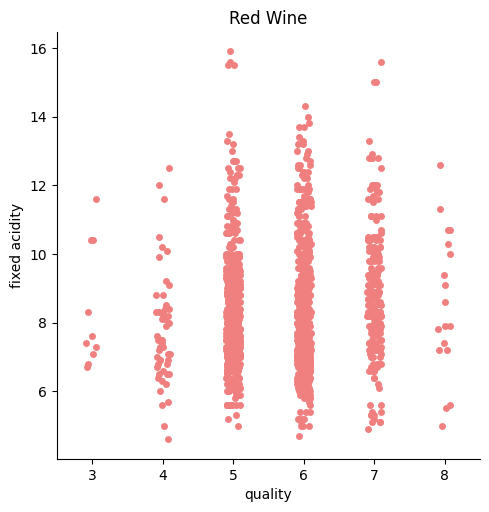

In [591]:
g = sns.catplot(data=df_red, x="quality", y="fixed acidity", color="lightcoral").set(title = "Red Wine")

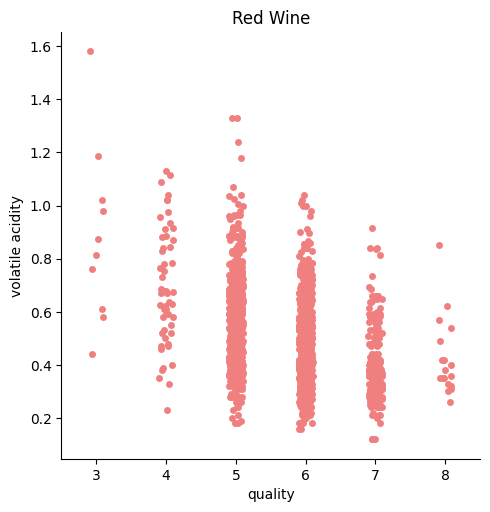

In [592]:
g = sns.catplot(data=df_red, x="quality", y="volatile acidity", color="lightcoral").set(title = "Red Wine")

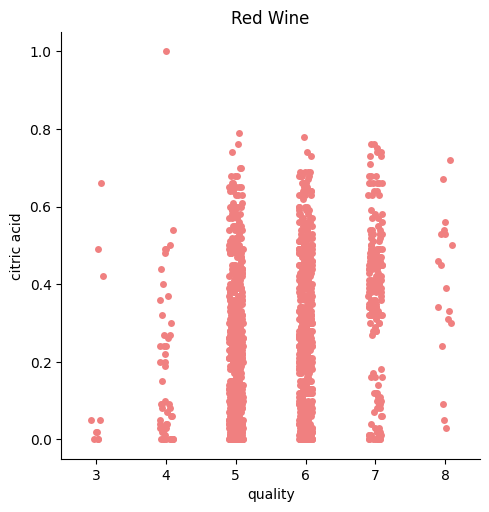

In [593]:
g = sns.catplot(data=df_red, x="quality", y="citric acid", color="lightcoral").set(title = "Red Wine")

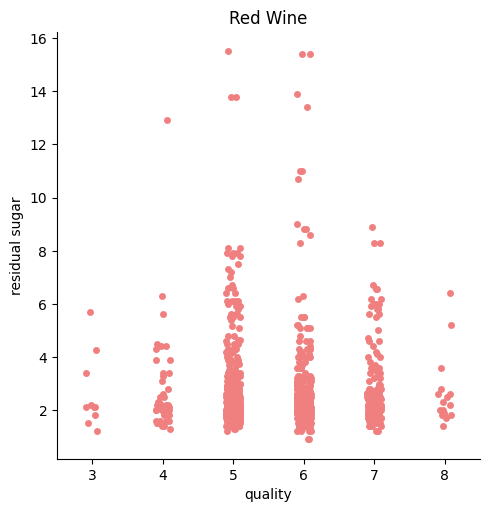

In [594]:
g = sns.catplot(data=df_red, x="quality", y="residual sugar", color="lightcoral").set(title = "Red Wine")

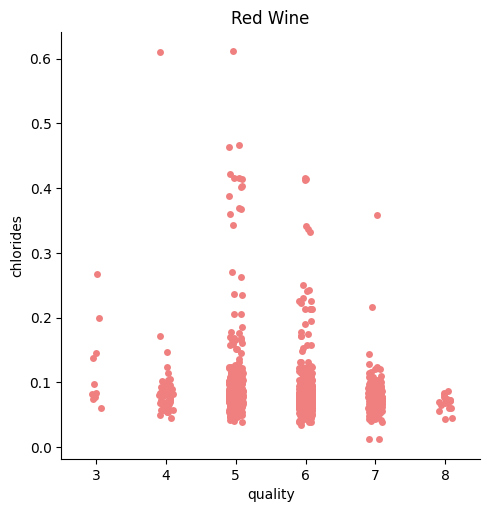

In [595]:
g = sns.catplot(data=df_red, x="quality", y="chlorides", color="lightcoral").set(title = "Red Wine")

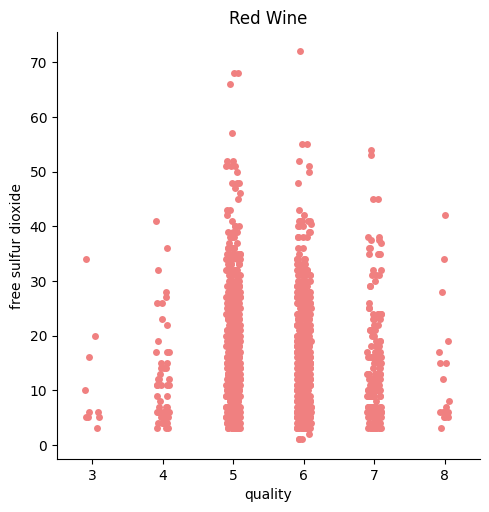

In [596]:
g = sns.catplot(data=df_red, x="quality", y="free sulfur dioxide", color="lightcoral").set(title = "Red Wine")

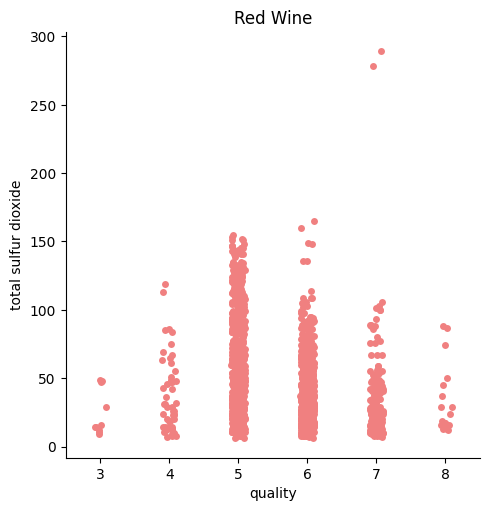

In [597]:
g = sns.catplot(data=df_red, x="quality", y="total sulfur dioxide", color="lightcoral").set(title = "Red Wine")

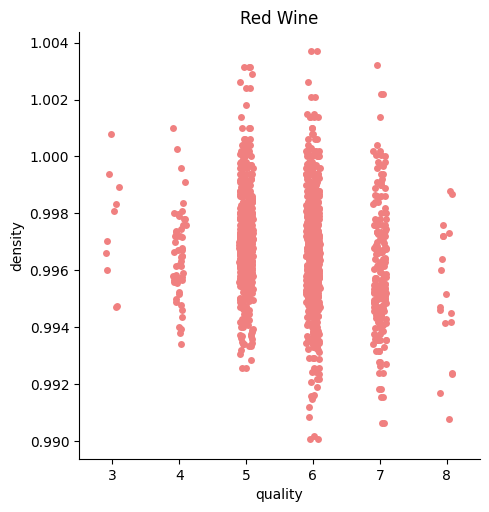

In [598]:
g = sns.catplot(data=df_red, x="quality", y="density", color="lightcoral").set(title = "Red Wine")

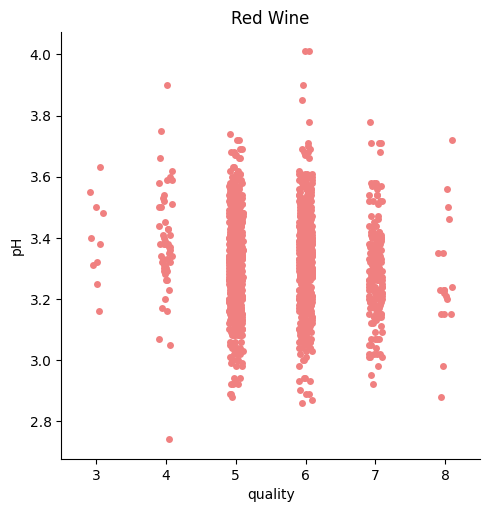

In [599]:
g = sns.catplot(data=df_red, x="quality", y="pH", color="lightcoral").set(title = "Red Wine")

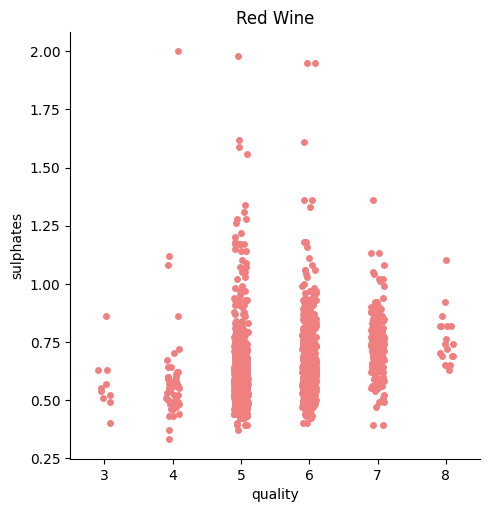

In [600]:
g = sns.catplot(data=df_red, x="quality", y="sulphates", color="lightcoral").set(title = "Red Wine")

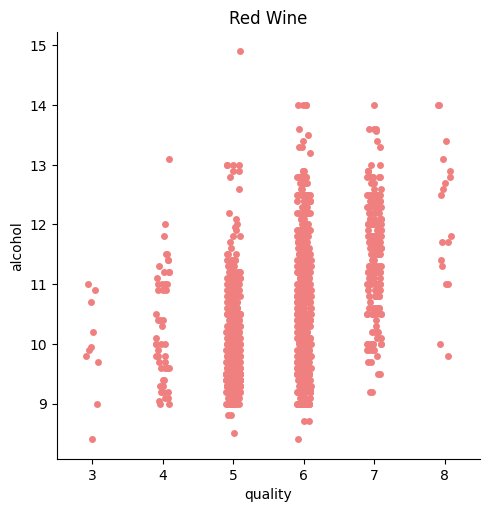

In [601]:
g = sns.catplot(data=df_red, x="quality", y="alcohol", color="lightcoral").set(title = "Red Wine")

Correlation Matrix: Because the data being roughly normally distributed, we can use Pearson correlation here:

/var/folders/p8/74p_0vf10dg9v09dqg69lwfc0000gn/T/ipykernel_16200/4014996933.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  g = sns.heatmap(df_red.corr(), vmin=-1, vmax=1, annot=True, cmap='RdBu').set(title = "Red Wine")


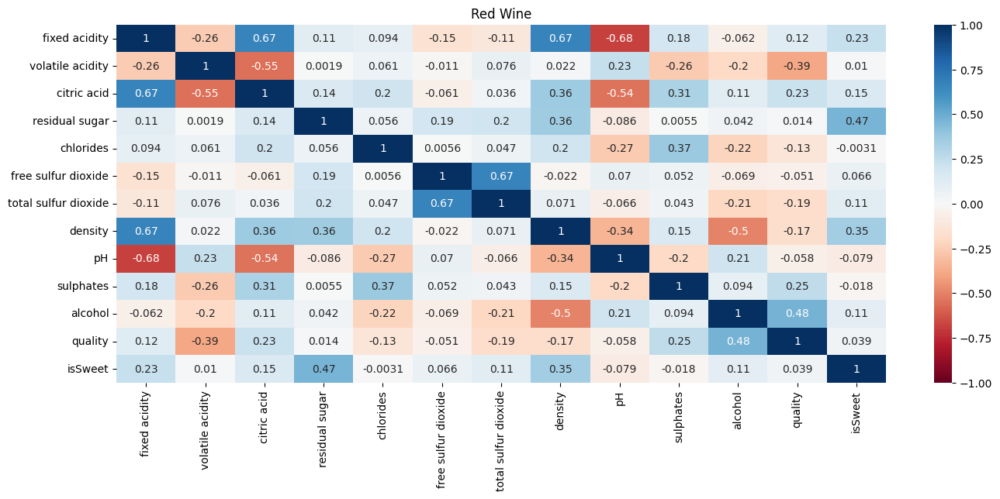

In [602]:
plt.figure(figsize=(16, 6))
g = sns.heatmap(df_red.corr(), vmin=-1, vmax=1, annot=True, cmap='RdBu').set(title = "Red Wine")

It can be admitted that the Quality of wine is most strongly correlated with the Alcohol content, Volatile Acidity, Sulphates and Citric Acids to a certain extent.

Task 3: Modelling:

First, for White Wine:

Using One-Hot Encoding

In [603]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,alcohol_cat,isSweet
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,L,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,M,0
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,M,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,M,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,M,1


In [604]:
dummies = []
dummies.append(pd.get_dummies(df_white["alcohol_cat"]))
df_dummies = pd.concat(dummies, axis=1)
df_white = pd.concat((df_white, df_dummies), axis=1)
df_white = df_white.drop(["alcohol_cat"], axis=1)

In [605]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweet,H,L,M
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,0,1,0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,0,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,0,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1


Now, using Binary Classification:

In [606]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweet,H,L,M
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,0,1,0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,0,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,0,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1


In [607]:
data_bin_white = df_white.rename(columns={"quality":"quality_cat"})
for index, series in data_bin_white.iterrows():
    quality = series["quality_cat"]
    if quality < 6:
        data_bin_white.loc[index, "quality_cat"] = 0
    else:
        data_bin_white.loc[index, "quality_cat"] = 1

In [608]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweet,H,L,M
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,0,1,0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,0,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,0,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1


Here, the Quality seems to get unbalanced(also represented in the below image):

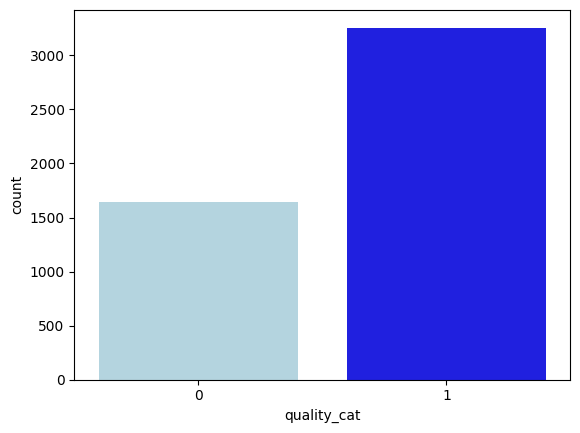

In [609]:
g = sns.countplot(x="quality_cat", data=data_bin_white, palette={0:"lightblue",1:"blue"})

In [610]:
X = data_bin_white.drop(["quality_cat"], axis=1).values
Q = data_bin_white["quality_cat"].values

Now, Splitting the Data and Applying SMOT to it later on:

In [611]:
XTrain, XTest, QTrain, QTest = train_test_split(X, Q, test_size=0.2, random_state=10)

XTrain, QTrain = SMOTE().fit_resample(XTrain, QTrain)
print(Counter(QTrain))

Counter({1: 2589, 0: 2589})


Scaling Data:

In [612]:
scaler = StandardScaler()
XTrain, XTest = (scaler.fit_transform(d) for d in (XTrain, XTest))

Now, Using Logistic Regression:

Train Set Predictions Report:

              precision    recall  f1-score   support

           0       0.72      0.78      0.75      2589
           1       0.76      0.70      0.73      2589

    accuracy                           0.74      5178
   macro avg       0.74      0.74      0.74      5178
weighted avg       0.74      0.74      0.74      5178

Test Set Predictions Report:

              precision    recall  f1-score   support

           0       0.50      0.83      0.63       311
           1       0.89      0.62      0.73       669

    accuracy                           0.69       980
   macro avg       0.70      0.72      0.68       980
weighted avg       0.77      0.69      0.70       980

Cross-validation scores
Training set: 0.73 (± 0.02)
Test set: 0.75 (± 0.02)


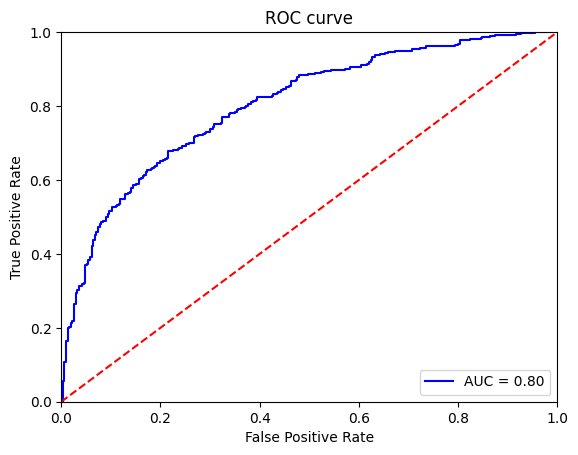

In [613]:
clf = LogisticRegression(penalty='l2', C=1, solver='lbfgs',multi_class='auto')
clf.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Hyper-Parameter Tuning:

In [614]:
tuned_parameters = [{'C': [1, 10, 100]}]

clf = GridSearchCV(LogisticRegression(solver='lbfgs', multi_class='auto'), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Best parameters set found on development set:

{'C': 10}

Grid scores on development set:

0.736 (± 0.029) for {'C': 1}

0.736 (± 0.028) for {'C': 10}

0.736 (± 0.028) for {'C': 100}



Now, using Supervised Machine Learning Algorithm(SVM):

Linear:

Train Set Predictions Report:

              precision    recall  f1-score   support

           0       0.71      0.80      0.75      2589
           1       0.77      0.67      0.72      2589

    accuracy                           0.73      5178
   macro avg       0.74      0.73      0.73      5178
weighted avg       0.74      0.73      0.73      5178

Test Set Predictions Report:

              precision    recall  f1-score   support

           0       0.49      0.83      0.62       311
           1       0.88      0.59      0.71       669

    accuracy                           0.67       980
   macro avg       0.69      0.71      0.66       980
weighted avg       0.76      0.67      0.68       980

Cross-validation scores
Training set: 0.73 (± 0.02)
Test set: 0.74 (± 0.03)


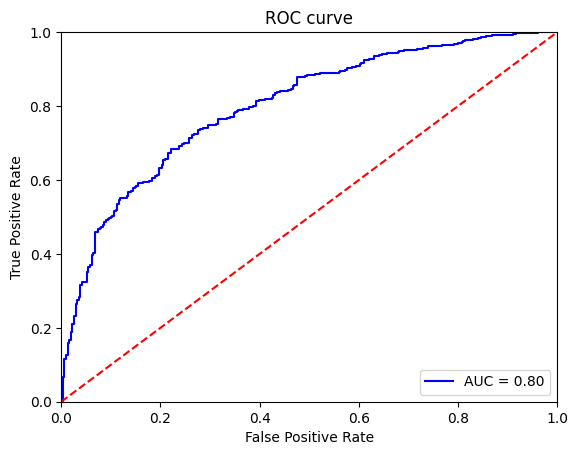

In [615]:
svm = SVC(kernel='linear')
clf = svm.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)
    
print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest, probs=False)

Poly:

Train Set Predictions Report:

              precision    recall  f1-score   support

           0       0.77      0.83      0.80      2589
           1       0.82      0.76      0.79      2589

    accuracy                           0.79      5178
   macro avg       0.80      0.79      0.79      5178
weighted avg       0.80      0.79      0.79      5178

Test Set Predictions Report:

              precision    recall  f1-score   support

           0       0.52      0.78      0.63       311
           1       0.87      0.67      0.76       669

    accuracy                           0.71       980
   macro avg       0.70      0.73      0.69       980
weighted avg       0.76      0.71      0.72       980

Cross-validation scores
Training set: 0.76 (± 0.05)
Test set: 0.74 (± 0.01)


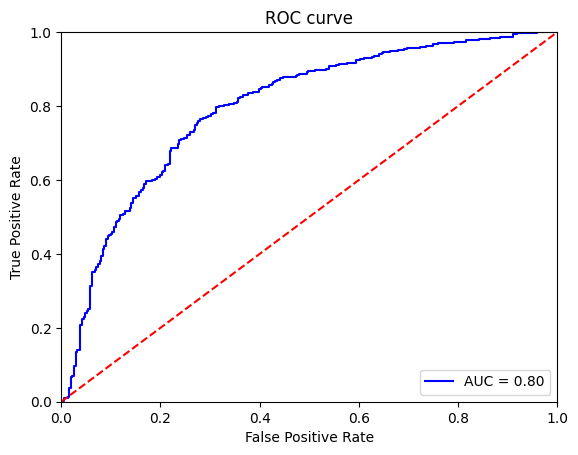

In [616]:
svm = SVC(kernel='poly')
clf = svm.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)
    
print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest, probs=False)

Now, using Radial Basis Function:

Train Set Predictions Report:

              precision    recall  f1-score   support

           0       0.80      0.84      0.82      2589
           1       0.83      0.80      0.81      2589

    accuracy                           0.82      5178
   macro avg       0.82      0.82      0.82      5178
weighted avg       0.82      0.82      0.82      5178

Test Set Predictions Report:

              precision    recall  f1-score   support

           0       0.57      0.78      0.66       311
           1       0.88      0.73      0.80       669

    accuracy                           0.74       980
   macro avg       0.72      0.75      0.73       980
weighted avg       0.78      0.74      0.75       980

Cross-validation scores
Training set: 0.78 (± 0.04)
Test set: 0.75 (± 0.03)


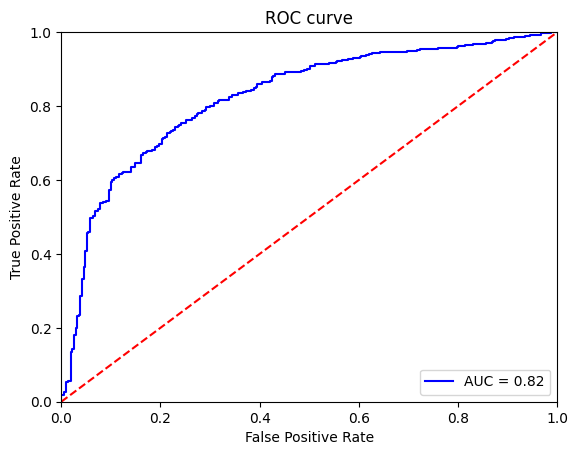

In [617]:
svm = SVC(kernel='rbf')
clf = svm.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)
    
print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest, probs=False)

Now, using Hyper-Parameter Tuning:

In [618]:
tuned_parameters = [{'kernel': ['rbf'], 'C': [1, 10, 100]},
                    {'kernel': ['poly'], 'C': [1, 10, 100]},
                    {'kernel': ['linear'], 'C': [1, 10, 100]}]

clf = GridSearchCV(SVC(), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Best parameters set found on development set:

{'C': 100, 'kernel': 'rbf'}

Grid scores on development set:

0.789 (± 0.046) for {'C': 1, 'kernel': 'rbf'}

0.807 (± 0.060) for {'C': 10, 'kernel': 'rbf'}

0.822 (± 0.069) for {'C': 100, 'kernel': 'rbf'}

0.768 (± 0.052) for {'C': 1, 'kernel': 'poly'}

0.791 (± 0.048) for {'C': 10, 'kernel': 'poly'}

0.792 (± 0.058) for {'C': 100, 'kernel': 'poly'}

0.733 (± 0.023) for {'C': 1, 'kernel': 'linear'}

0.733 (± 0.023) for {'C': 10, 'kernel': 'linear'}

0.733 (± 0.023) for {'C': 100, 'kernel': 'linear'}



Now, using Decision Tree:

Train Set Predictions Report

              precision    recall  f1-score   support

           0       0.90      0.92      0.91      2589
           1       0.92      0.89      0.91      2589

    accuracy                           0.91      5178
   macro avg       0.91      0.91      0.91      5178
weighted avg       0.91      0.91      0.91      5178

Test Set Predictions Report

              precision    recall  f1-score   support

           0       0.38      0.79      0.52       311
           1       0.81      0.41      0.54       669

    accuracy                           0.53       980
   macro avg       0.60      0.60      0.53       980
weighted avg       0.67      0.53      0.53       980

Cross-validation scores
Training set: 0.78 (± 0.05)
Test set: 0.68 (± 0.07)


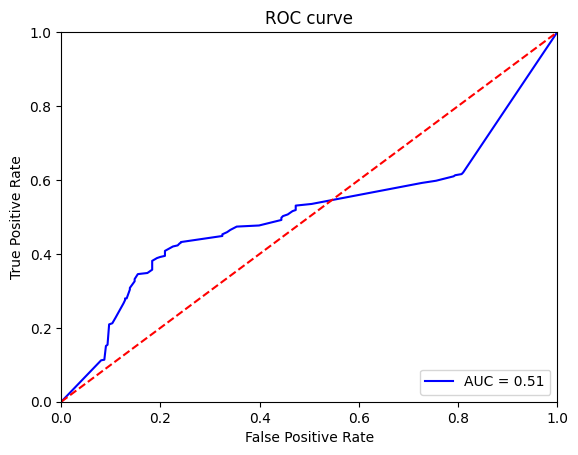

In [619]:
clf = DecisionTreeClassifier(max_depth=10)
clf = clf.fit(XTrain, QTrain)

# predictions
Q_pred_Train = clf.predict(XTrain)
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Random Forest:

Train Set Predictions Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2589
           1       1.00      1.00      1.00      2589

    accuracy                           1.00      5178
   macro avg       1.00      1.00      1.00      5178
weighted avg       1.00      1.00      1.00      5178

Test Set Predictions Report:

              precision    recall  f1-score   support

           0       0.38      0.96      0.55       311
           1       0.94      0.27      0.42       669

    accuracy                           0.49       980
   macro avg       0.66      0.62      0.48       980
weighted avg       0.76      0.49      0.46       980

Cross-validation scores
Training set: 0.85 (± 0.05)
Test set: 0.77 (± 0.02)


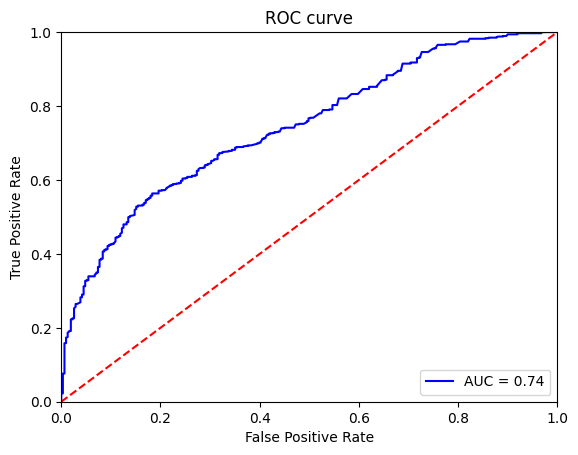

In [620]:
clf = RandomForestClassifier(n_estimators=200, max_depth=20, random_state=10)
clf.fit(XTrain, QTrain)

# predictions
Q_pred_Train = clf.predict(XTrain)
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Hyper-Parameter Tuning:

In [621]:
tuned_parameters = [{'n_estimators': [10,50,100,200],
                     'max_depth': [5,10,20,50]}]
clf = GridSearchCV(RandomForestClassifier(), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']

for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Best parameters set found on development set:

{'max_depth': 50, 'n_estimators': 200}

Grid scores on development set:

0.766 (± 0.043) for {'max_depth': 5, 'n_estimators': 10}

0.780 (± 0.046) for {'max_depth': 5, 'n_estimators': 50}

0.780 (± 0.052) for {'max_depth': 5, 'n_estimators': 100}

0.782 (± 0.054) for {'max_depth': 5, 'n_estimators': 200}

0.809 (± 0.066) for {'max_depth': 10, 'n_estimators': 10}

0.829 (± 0.057) for {'max_depth': 10, 'n_estimators': 50}

0.827 (± 0.061) for {'max_depth': 10, 'n_estimators': 100}

0.832 (± 0.058) for {'max_depth': 10, 'n_estimators': 200}

0.839 (± 0.051) for {'max_depth': 20, 'n_estimators': 10}

0.857 (± 0.062) for {'max_depth': 20, 'n_estimators': 50}

0.861 (± 0.064) for {'max_depth': 20, 'n_estimators': 100}

0.861 (± 0.069) for {'max_depth': 20, 'n_estimators': 200}

0.838 (± 0.042) for {'max_depth': 50, 'n_estimators': 10}

0.855 (± 0.058) for {'max_depth': 50, 'n_estimators': 50}

0.860 (± 0.065) for {'max_depth': 50, 'n_estimators'

Now, using K-Nearest Neighbors Algorithm:

Train Set Predictions Report:

              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2589
           1       0.90      0.84      0.87      2589

    accuracy                           0.87      5178
   macro avg       0.87      0.87      0.87      5178
weighted avg       0.87      0.87      0.87      5178

Test Set Predictions Report:

              precision    recall  f1-score   support

           0       0.55      0.75      0.64       311
           1       0.86      0.72      0.78       669

    accuracy                           0.73       980
   macro avg       0.71      0.73      0.71       980
weighted avg       0.76      0.73      0.74       980

Cross-validation scores
Training set: 0.78 (± 0.02)
Test set: 0.75 (± 0.02)


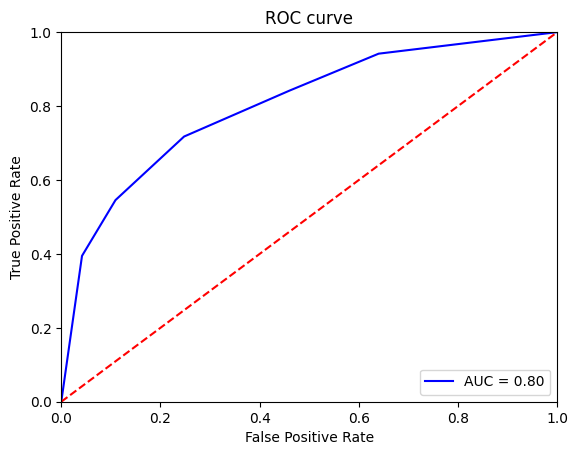

In [622]:
clf = KNeighborsClassifier(n_neighbors=5)
clf.fit(XTrain, QTrain)

# predictions
Q_pred_Train = clf.predict(XTrain)
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Hyper-Parameter Tuning with KNN:

In [623]:
tuned_parameters = [{'n_neighbors': [5, 10, 25, 50]}]

clf = GridSearchCV(KNeighborsClassifier(), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Best parameters set found on development set:

{'n_neighbors': 5}

Grid scores on development set:

0.791 (± 0.028) for {'n_neighbors': 5}

0.772 (± 0.037) for {'n_neighbors': 10}

0.773 (± 0.029) for {'n_neighbors': 25}

0.758 (± 0.032) for {'n_neighbors': 50}



Now, using Regression Modelling:

Before Modelling:

In [624]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,isSweet,H,L,M
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,1,0,1,0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,0,0,0,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,1,0,0,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,1,0,0,1


In [625]:
X = df_white.drop(["quality"], axis=1).values
Q = df_white["quality"].values

Now, Splitting the Data:

In [626]:
XTrain, XTest, QTrain, QTest = train_test_split(X, Q, test_size=0.2, random_state=10)

Now, using Linear Regression:

In [627]:
reg = LinearRegression()
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.27 (± 0.04)
Test set: 0.27 (± 0.03)

MSE:  0.5482307327826736
RMSE:  0.7404260481524632


Now, using Support Vector Regression(SVR):

Linear:

In [628]:
reg = SVR(kernel='linear')
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.26 (± 0.03)
Test set: 0.25 (± 0.04)

MSE:  0.5569394691657261
RMSE:  0.7462837725461583


Poly:

In [629]:
reg = SVR(kernel='poly')
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.08 (± 0.02)
Test set: 0.07 (± 0.02)

MSE:  0.671362380699104
RMSE:  0.8193670610288798


Now, using Radial Vasis Function(RBF):

In [630]:
reg = SVR(kernel='rbf')
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.13 (± 0.02)
Test set: 0.09 (± 0.01)

MSE:  0.6521622111702997
RMSE:  0.8075656079664981


Now, using Decision Tree:

In [631]:
reg = DecisionTreeRegressor(max_depth=10)
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.18 (± 0.02)
Test set: -0.13 (± 0.19)

MSE:  0.5493542294856247
RMSE:  0.7411843424449984


Now, using Random Forest:

In [632]:
reg = RandomForestRegressor(n_estimators=200, max_depth=20, random_state=10)
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.48 (± 0.06)
Test set: 0.31 (± 0.07)

MSE:  0.34030059770489607
RMSE:  0.583352892942939


Now, using K-Nearest Neighbors Algorithm(KNN):

In [633]:
reg = KNeighborsRegressor(n_neighbors=5)
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.13 (± 0.04)
Test set: 0.00 (± 0.08)

MSE:  0.6453061224489797
RMSE:  0.8033094811148314


Red Wine:

First, using One-Hot Encoding:

In [634]:
df_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,alcohol_cat,isSweet
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,M,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,M,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,M,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,M,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,M,0


In [635]:
dummies = []
dummies.append(pd.get_dummies(df_red["alcohol_cat"]))
df_dummies = pd.concat(dummies, axis=1)
df_red = pd.concat((df_red, df_dummies), axis=1)
df_red = df_red.drop(["alcohol_cat"], axis=1)

In [ ]:
df_red.head()

Now, using Binary Classification:

In [ ]:
df_red.head()

In [ ]:
data_bin_red = df_red.rename(columns={"quality":"quality_cat"})
for index, series in data_bin_red.iterrows():
    quality = series["quality_cat"]
    if quality < 6:
        data_bin_red.loc[index, "quality_cat"] = 0
    else:
        data_bin_red.loc[index, "quality_cat"] = 1

In [ ]:
data_bin_red.head()

Here, the Quality seems to get unbalanced(also represented in the below image):

In [ ]:
g = sns.countplot(x="quality_cat", data=data_bin_red, palette={0:"lightcoral",1:"firebrick"})

In [ ]:
X = data_bin_red.drop(["quality_cat"], axis=1).values
Q = data_bin_red["quality_cat"].values

Now, Splitting the Data and Applying SMOT to it later on:

In [ ]:
XTrain, XTest, QTrain, QTest = train_test_split(X, Q, test_size=0.2, random_state=10)

XTrain, QTrain = SMOTE().fit_resample(XTrain, QTrain)
print(Counter(QTrain))

Scaling Data:

In [ ]:
scaler = StandardScaler()
XTrain, XTest = (scaler.fit_transform(d) for d in (XTrain, XTest))

Now, Using Logistic Regression:

In [ ]:
clf = LogisticRegression(penalty='l2', C=1, solver='lbfgs',multi_class='auto')
clf.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Hyper-Parameter Tuning:

In [ ]:
tuned_parameters = [{'C': [1, 10, 100]}]

clf = GridSearchCV(LogisticRegression(solver='lbfgs', multi_class='auto'), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Now, using Supervised Machine Learning Algorithm(SVM):

Linear:

In [ ]:
svm = SVC(kernel='linear')
clf = svm.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)
    
print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest, probs=False)

Poly:

In [ ]:
svm = SVC(kernel='poly')
clf = svm.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)
    
print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest, probs=False)

Now, using Radial Basis Function:

In [ ]:
svm = SVC(kernel='rbf')
clf = svm.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = clf.predict(XTrain)

# predictions on test set
Q_pred_Test = clf.predict(XTest)
    
print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest, probs=False)

Now, using Hyper-Parameter Tuning:

In [ ]:
tuned_parameters = [{'kernel': ['rbf'], 'C': [1, 10, 100]},
                    {'kernel': ['poly'], 'C': [1, 10, 100]},
                    {'kernel': ['linear'], 'C': [1, 10, 100]}]

clf = GridSearchCV(SVC(), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Now, using Decision Tree:

In [ ]:
clf = DecisionTreeClassifier(max_depth=10)
clf = clf.fit(XTrain, QTrain)

# predictions
Q_pred_Train = clf.predict(XTrain)
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Random Forest:

In [ ]:
clf = RandomForestClassifier(n_estimators=200, max_depth=20, random_state=10)
clf.fit(XTrain, QTrain)

# predictions
Q_pred_Train = clf.predict(XTrain)
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Hyper-Parameter Tuning:

In [ ]:
tuned_parameters = [{'n_estimators': [10,50,100,200],
                     'max_depth': [5,10,20,50]}]
clf = GridSearchCV(RandomForestClassifier(), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']

for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Now, using K-Nearest Neighbors Algorithm:

In [ ]:
clf = KNeighborsClassifier(n_neighbors=5)
clf.fit(XTrain, QTrain)

# predictions
Q_pred_Train = clf.predict(XTrain)
Q_pred_Test = clf.predict(XTest)

print('Train Set Predictions Report:\n')
print(classification_report(QTrain, Q_pred_Train))
print('Test Set Predictions Report:\n')
print(classification_report(QTest, Q_pred_Test))

print("Cross-validation scores")
scores = cross_val_score(clf, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(clf, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")

plotROC(clf, XTest, QTest)

Now, using Hyper-Parameter Tuning with KNN:

In [ ]:
tuned_parameters = [{'n_neighbors': [5, 10, 25, 50]}]

clf = GridSearchCV(KNeighborsClassifier(), tuned_parameters, cv=5)
clf.fit(XTrain, QTrain)

print("Best parameters set found on development set:\n")
print(clf.best_params_)
print("\nGrid scores on development set:\n")

means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print(f"{mean:.3f} (± {std * 2:.03f}) for {params}\n")

Now, using Regression Modelling:

Before Modelling:

In [ ]:
df_red.head()

In [ ]:
X = df_red.drop(["quality"], axis=1).values
Q = df_red["quality"].values

Now, Splitting the Data:

In [ ]:
XTrain, XTest, QTrain, QTest = train_test_split(X, Q, test_size=0.2, random_state=10)

Now, using Linear Regression:

In [ ]:
reg = LinearRegression()
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Now, using Support Vector Regression(SVR):

Linear:

In [ ]:
reg = SVR(kernel='linear')
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Poly:

In [ ]:
reg = SVR(kernel='poly')
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Now, using Radial Basis Function(RBF):

In [ ]:
reg = SVR(kernel='rbf')
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Now, using Decision Tree:

In [668]:
reg = DecisionTreeRegressor(max_depth=10)
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.18 (± 0.01)
Test set: -0.13 (± 0.24)

MSE:  0.5448115764244004
RMSE:  0.7381135254311496


Now, using Random Forest:

In [667]:
reg = RandomForestRegressor(n_estimators=200, max_depth=20, random_state=10)
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.48 (± 0.06)
Test set: 0.31 (± 0.07)

MSE:  0.34030059770489607
RMSE:  0.583352892942939


Now, using K-Nearest Neighbors Algorithm(KNN):

In [666]:
reg = KNeighborsRegressor(n_neighbors=5)
reg.fit(XTrain, QTrain)

# predictions on training set
Q_pred_Train = reg.predict(XTrain)

# predictions on test set
Q_pred_Test = reg.predict(XTest)

print("Cross-validation scores")
scores = cross_val_score(reg, XTrain, QTrain, cv=3)
print(f"Training set: {scores.mean():.2f} (± {scores.std() * 2:.2f})")
scores = cross_val_score(reg, XTest, QTest, cv=3)
print(f"Test set: {scores.mean():.2f} (± {scores.std() * 2:.2f})\n")

print("MSE: ", mean_squared_error(QTest, Q_pred_Test))
print("RMSE: ", np.sqrt(mean_squared_error(QTest, Q_pred_Test)))

Cross-validation scores
Training set: 0.13 (± 0.04)
Test set: 0.00 (± 0.08)

MSE:  0.6453061224489797
RMSE:  0.8033094811148314
